# Capstone Project: NHL Cap Hit Predictions

#### Brian Johns, April 2022.  BrainStation

## Notebook #3: Clustering Models

### Overview

To revisit the question I would like to answer once again, **How can we predict and evaluate the Cap Hit of NHL players using their basic and advanced statistics?**

Here, my goal is to use Clustering in order to group NHL players by archetypes based on the performance profile of the players.  Doing so may provide a way to categorize the players and apply a valuation on the type of player they are.  From there we can identify players who are over/undervalued by their archetype and get more insight on potential team-building strategies.

In order to accomplish this, I want the clustering to be focused on the player's performance statistics in order to draw conclusions about how that type of player may be acquired for a team, whether it is by their salary (represented by cap hit) or where they could be drafted.

To do this, I will need to do the following:

1. Identify appropriate features to clusters
2. Scale the data.
3. Visualize the data to estimate the number of clusters.
4. Cluster the data.
5. Interpret the player data through our clusters.

In making the attempt to cluster this data, it became apparent that it would be best to actual cluster the data by the position of the players (defencemen and forwards).  Here is an outline of how I went through these steps.

1. [Readying and Scaling the Data](#data)
2. [Visualizing Clusters for All Players](#visualall)
3. [Clustering All Players](#clusterall)
4. [Visualizing Clusters for Defencemen](#visuald)
5. [Clustering Defencemen](#clusterd)
6. [Visualizing Clusters for Forwards](#visualf)
7. [Clustering Forwards](#clusterf)
8. [Interpreting the Clusters](#interpret)

### Readying and Scaling the Data

<a id = 'data'></a>

Here we will be inputting the data after it had been transformed in preparation for our linear regression modeling and includes the predicted `Cap_Hit` values.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from scipy import stats

In [2]:
clean_df = pd.read_csv('CLEAN_CLUSTERING_032522.csv')

In [3]:
pd.set_option("display.max_columns", None)

In [4]:
clean_df.shape

(6226, 146)

In [5]:
clean_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6226 entries, 0 to 6225
Columns: 146 entries, Player to Prediction_Difference
dtypes: float64(131), int64(11), object(4)
memory usage: 6.9+ MB


In [6]:
clean_df.head()

,Player,Team,Birthday,Age,Draft Ov,GP,TOI,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,Year,Cap_Hit,ID,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%,Left_Handed,Defenceman,Predicted_Cap_Hit,Prediction_Difference
0,aaron ekblad,FLA,1996-02-07,18,1.0,81,1766.62,59.96,57.82,56.61,57.07,58.74,2.93,1.96,34.78,25.38,45.59,34.94,59.18,44.51,2.78,1.95,0.97,9.40,10.65,14.67,0.83,8.43,92.29,0.183,0.105,1.267,-0.170,0.033,0.023,0.324,0.100,0.056,0.454,0.086,0.165,4.5,2.6,4.7,-0.1,1.0,0.7,9.2,2.5,1.6,13.4,2.5,4.9,5.77,8.08,11.92,0.30,7.06,1.39,0.88,0.54,0.51,0.00,0.00,-0.03,0.0,0.0,0.0,0,0,-1,0,0,0,86.30,57.63,1024.10,747.21,1342.33,1028.68,1742.44,1310.56,81.86,57.49,28.67,276.89,313.65,431.88,24.37,1766.6,1485.7,221.4,31.5,5.5,5.7,1.2,-0.3,1.0,6.7,5.4,13.8,2.6,5.0,0.222,0.230,0.326,-0.547,0.033,0.023,0.236,0.214,0.056,0.467,0.089,0.170,2015,0.925,aaron ekblad-18-2015,0.343590,0.292670,0.457425,0.841567,1.798404,1.313724,1.547563,1.726332,2.564949,2.397895,2.890372,3.688879,5.141664,5.476464,5.863631,2.299581,4.394449,3.737670,3.295837,4.700480,4.919981,2.833213,2.772589,2.506296,0,1,1.425904,0.500904
1,aaron ekblad,FLA,1996-02-07,19,1.0,78,1690.82,60.69,56.43,55.41,55.96,57.83,3.29,2.13,31.34,24.20,42.34,34.07,54.45,42.84,2.94,2.14,1.16,7.14,8.27,11.61,0.80,10.51,91.18,0.415,0.132,-0.004,0.359,0.034,-0.022,0.358,0.140,0.011,0.468,0.090,0.174,9.5,3.0,0.0,0.3,0.9,-0.6,9.5,3.4,0.3,13.2,2.5,4.9,6.46,8.52,11.50,0.36,8.24,1.45,0.85,0.67,0.28,0.04,0.04,-0.39,0.0,0.0,0.0,1,1,-11,0,0,0,92.85,60.15,883.09,681.85,1193.09,960.11,1534.30,1207.24,82.79,60.38,32.70,201.24,232.98,327.06,22.41,1690.8,1378.1,218.3,55.1,4.2,3.0,0.2,0.2,0.9,4.4,3.2,7.9,1.5,2.9,0.181,0.130,0.056,0.262,0.034,-0.022,0.164,0.135,0.011,0.280,0.054,0.104,2016,0.925,aaron ekblad-19-2016,0.425268,0.246860,0.378436,0.824175,1.981001,1.128171,1.408545,1.699279,2.772589,2.197225,2.639057,3.610918,5.209486,5.484797,5.783825,2.415914,4.094345,3.737670,3.218876,4.477337,4.844187,2.995732,2.197225,2.026296,0,1,1.306689,0.381689
2,aaron ekblad,FLA,1996-02-07,20,1.0,68,1459.28,46.49,55.24,55.40,56.71,53.00,2.21,2.54,35.47,28.75,48.02,38.66,63.21,48.24,2.81,2.49,-0.33,6.72,9.36,14.96,0.32,6.22,91.17,-0.055,-0.007,0.449,0.754,-0.003,0.006,0.013,0.025,0.003,0.037,0.007,0.013,-1.1,-0.1,1.4,0.7,-0.1,0.1,0.3,0.5,0.1,0.9,0.2,0.3,9.25,12.17,16.78,0.49,4.44,2.38,1.03,1.19,0.70,0.00,0.00,-0.49,0.0,0.0,0.0,0,0,-12,0,0,0,53.64,61.75,862.68,699.13,1167.80,940.17,1537.28,1173.32,68.38,60.63,-8.11,163.55,227.63,363.96,7.75,1459.3,1194.7,187.3,52.9,-6.2,0.5,0.9,0.7,-0.1,-5.3,1.2,-4.0,-0.8,-1.5,-0.311,0.027,0.275,0.787,-0.003,0.006,-0.231,0.059,0.003,-0.166,-0.031,-0.060,2017,0.925,aaron ekblad-20-2017,0.343590,0.148420,0.254642,0.620576,1.477049,1.266948,1.530395,1.492904,2.397895,1.609438,2.079442,3.091042,5.420535,5.693732,6.013715,2.567254,4.143135,4.077537,3.258097,4.488636,4.442651,3.401197,2.890372,2.216296,0,1,2.347113,1.422113
3,aaron ekblad,FLA,1996-02-07,21,1.0,82,1917.90,53.04,48.15,48.85,48.87,47.70,3.60,3.19,34.88,37.56,47.86,50.11,60.62,63.41,3.26,3.57,0.41,-2.68,-2.25,-2.79,-0.31,10.33,91.51,0.

The transformed data has successfully transferred from our other dataset, and appropriate columns have already been log-transformed.  Unlike the PCA modeling, I don't have a specific target in mind so we will keep as many of the features as possible for this clustering.

This clustering is going to be used in order to determine a player's Performance Profile.  First we will scale the data and then we will begin the process of identifying the best tools for clustering the data.  These are some of the choices that I made in order to get the best out of our clustering.

1. Player, Team, Birthday, ID, Year will be removed and used for identification after
2. We are also going to remove Left-Handedness and Position as categorical features
    - With the clustering, we will see if positional strengths are captured in the clustering without pre-labeling positions
3. I am also going to remove GP and TOI.
    - The hopes of this analysis would be to identify players who may be undervalued.  Often times those are players who are outperforming limited roles on the ice.  Also, this data includes 3 shortened seasons, two for covid and one currently in progress.  Including these may make the clusters group just by season due to the inconsistency in the number of games played in a season.
4. I am also going to remove Age, Draft Ov, Cap Hit, Predicted Cap Hit and Prediction Difference
    - Age will be used to identify how a player may move from cluster to cluster as they get older
    - Draft Ov will be used to identify where these players are picked in the draft and evaluate if their is value to be gained there
    - Cap Hit will be used in order to see which players are undervalued and overvalued in each cluster
    - Referencing the Predictions from the XGBoost model may give more insight on overvalued and undervalued players within each cluster.

In [7]:
drop_list = ['Player', 'Team', 'Birthday', 'ID', 'Cap_Hit', 'Year',
             'Left_Handed', 'GP', 'TOI', 'Age', 'Draft Ov', 'Cap_Hit', 'Defenceman',
             'Predicted_Cap_Hit', 'Prediction_Difference']

In [8]:
cluster_df = clean_df.drop(columns = drop_list)

In [9]:
cluster_df.head()

,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%
0,59.96,57.82,56.61,57.07,58.74,2.93,1.96,34.78,25.38,45.59,34.94,59.18,44.51,2.78,1.95,0.97,9.40,10.65,14.67,0.83,8.43,92.29,0.183,0.105,1.267,-0.170,0.033,0.023,0.324,0.100,0.056,0.454,0.086,0.165,4.5,2.6,4.7,-0.1,1.0,0.7,9.2,2.5,1.6,13.4,2.5,4.9,5.77,8.08,11.92,0.30,7.06,1.39,0.88,0.54,0.51,0.00,0.00,-0.03,0.0,0.0,0.0,0,0,-1,0,0,0,86.30,57.63,1024.10,747.21,1342.33,1028.68,1742.44,1310.56,81.86,57.49,28.67,276.89,313.65,431.88,24.37,1766.6,1485.7,221.4,31.5,5.5,5.7,1.2,-0.3,1.0,6.7,5.4,13.8,2.6,5.0,0.222,0.230,0.326,-0.547,0.033,0.023,0.236,0.214,0.056,0.467,0.089,0.170,0.343590,0.292670,0.457425,0.841567,1.798404,1.313724,1.547563,1.726332,2.564949,2.397895,2.890372,3.688879,5.141664,5.476464,5.863631,2.299581,4.394449,3.737670,3.295837,4.700480,4.919981,2.833213,2.772589,2.506296
1,60.69,56.43,55.41,55.96,57.83,3.29,2.13,31.34,24.20,42.34,34.07,54.45,42.84,2.94,2.14,1.16,7.14,8.27,11.61,0.80,10.51,91.18,0.415,0.132,-0.004,0.359,0.034,-0.022,0.358,0.140,0.011,0.468,0.090,0.174,9.5,3.0,0.0,0.3,0.9,-0.6,9.5,3.4,0.3,13.2,2.5,4.9,6.46,8.52,11.50,0.36,8.24,1.45,0.85,0.67,0.28,0.04,0.04,-0.39,0.0,0.0,0.0,1,1,-11,0,0,0,92.85,60.15,883.09,681.85,1193.09,960.11,1534.30,1207.24,82.79,60.38,32.70,201.24,232.98,327.06,22.41,1690.8,1378.1,218.3,55.1,4.2,3.0,0.2,0.2,0.9,4.4,3.2,7.9,1.5,2.9,0.181,0.130,0.056,0.262,0.034,-0.022,0.164,0.135,0.011,0.280,0.054,0.104,0.425268,0.246860,0.378436,0.824175,1.981001,1.128171,1.408545,1.699279,2.772589,2.197225,2.639057,3.610918,5.209486,5.484797,5.783825,2.415914,4.094345,3.737670,3.218876,4.477337,4.844187,2.995732,2.197225,2.026296
2,46.49,55.24,55.40,56.71,53.00,2.21,2.54,35.47,28.75,48.02,38.66,63.21,48.24,2.81,2.49,-0.33,6.72,9.36,14.96,0.32,6.22,91.17,-0.055,-0.007,0.449,0.754,-0.003,0.006,0.013,0.025,0.003,0.037,0.007,0.013,-1.1,-0.1,1.4,0.7,-0.1,0.1,0.3,0.5,0.1,0.9,0.2,0.3,9.25,12.17,16.78,0.49,4.44,2.38,1.03,1.19,0.70,0.00,0.00,-0.49,0.0,0.0,0.0,0,0,-12,0,0,0,53.64,61.75,862.68,699.13,1167.80,940.17,1537.28,1173.32,68.38,60.63,-8.11,163.55,227.63,363.96,7.75,1459.3,1194.7,187.3,52.9,-6.2,0.5,0.9,0.7,-0.1,-5.3,1.2,-4.0,-0.8,-1.5,-0.311,0.027,0.275,0.787,-0.003,0.006,-0.231,0.059,0.003,-0.166,-0.031,-0.060,0.343590,0.148420,0.254642,0.620576,1.477049,1.266948,1.530395,1.492904,2.397895,1.609438,2.079442,3.091042,5.420535,5.693732,6.013715,2.567254,4.143135,4.077537,3.258097,4.488636,4.442651,3.401197,2.890372,2.216296
3,53.04,48.15,48.85,48.87,47.70,3.60,3.19,34.88,37.56,47.86,50.11,60.62,63.41,3.26,3.57,0.41,-2.68,-2.25,-2.79,-0.31,10.33,91.51,0.273,-0.197,1.128,-0.540,-0.036,-0.025,0.362,-0.234,-0.061,0.049,0.010,0.018,6.8,-4.9,3.3,-1.6,-1.2,-0.8,10.1,-6.6,-2.0,1.6,0.3,0.6,5.91,8.85,12.48,0.39,8.47,3.10,1.25,0.91,0.28,0.09,0.09,-0.63,0.0,0.0,0.0,3,3,-20,0,0,0,115.16,101.95,1114.81,1200.56,1530.00,1601.91,1937.80,2027.05,104.15,114.21,13.21,-85.75,-71.91,-89.25,-10.06,1917.9,1500.0,173.4,181.2,5.1,-3.7,2.6,-1.7,-1.2,7.7,-5.4,0.3,0.1,0.1,0.204,-0.149,0.895,-0.547,-0.036,-0.025,0.276,-0.192,-0.061,0.011,0

In [10]:
len(cluster_df.columns)

132

With this, our numerical data is ready to be scaled.  I am choosing a Standard Scaler for the clustering as it was the better performing scale in my linear regression modeling, albeit marginally.

In [11]:
from sklearn.preprocessing import StandardScaler

In [12]:
ss = StandardScaler()
cluster_scaled = ss.fit_transform(cluster_df)

In [13]:
cluster_scaled

array([[ 1.03931151,  1.25202044,  1.0338086 , ...,  0.81548395,
         0.77710306,  0.21038272],
       [ 1.11127937,  1.02513864,  0.8414645 , ...,  1.08497252,
        -0.09833516, -0.1679826 ],
       [-0.28864337,  0.8309017 ,  0.83986163, ...,  1.75731399,
         0.95631439, -0.01821299],
       ...,
       [-1.66293373, -1.54890885, -1.44262168, ..., -0.6558405 ,
         0.46117195, -1.09229151],
       [-1.45393118, -1.48688361, -1.32400948, ..., -0.91145287,
        -0.48071953,  0.85471336],
       [-0.55482587, -0.37859049, -0.44243236, ..., -0.91145287,
        -0.7152656 , -0.41438698]])

In [14]:
#Turn this back into a dataframe
cluster_scaled_df = pd.DataFrame(data = cluster_scaled, columns = cluster_df.columns)

In [15]:
#Sanity Check
cluster_scaled_df.head()

,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%
0,1.039312,1.252020,1.033809,1.066885,1.174009,0.261434,-1.220764,0.964076,-1.201392,0.595310,-1.245534,0.401555,-1.521581,0.133515,-1.674447,0.875613,1.230664,0.979923,0.975978,0.976843,-0.196861,0.794072,0.079609,0.469249,1.503946,-0.348926,0.206838,0.367736,0.509218,0.455503,0.424410,0.736123,0.758648,0.774665,0.468411,0.931597,2.529974,-0.092216,0.637042,0.775116,1.197929,0.812829,0.960839,1.578584,1.567907,1.637495,-0.182270,-0.149097,0.190858,-0.810809,-0.301981,-0.352631,-0.749370,-0.433408,-0.405682,-0.332915,-0.335369,0.021498,-0.603236,-0.641684,0.029507,-0.471764,-0.477811,-0.056079,-0.529258,-0.563695,-0.009005,1.412549,0.599871,2.111658,1.222914,1.886552,1.206428,1.774316,1.049950,1.416939,0.636102,1.425510,2.044718,1.608076,1.595508,1.582130,1.894495,2.122696,1.655673,-0.562440,0.751125,2.206774,0.373846,-0.320891,0.637033,0.763534,1.898090,1.763633,1.776933,1.804179,0.230031,1.153683,0.118943,-0.647363,0.206834,0.367734,0.233299,1.071892,0.424408,0.801092,0.832085,0.842716,-0.295591,-0.498630,0.808624,-0.075300,-0.029217,0.181754,-0.163058,0.056377,0.621065,0.480351,1.391541,0.866236,1.094901,1.129960,1.310716,0.279463,1.058301,0.844362,0.481048,0.852469,1.436769,0.815484,0.777103,0.210383
1,1.111279,1.025139,0.841464,0.895454,1.052629,0.667035,-0.933368,0.257049,-1.526856,0.109081,-1.421308,-0.127007,-1.765363,0.378717,-1.223511,1.049985,0.923220,0.750013,0.762914,0.939881,0.835749,0.118832,0.851824,0.616038,-0.326729,0.362680,0.223619,-0.442084,0.621850,0.669765,-0.158402,0.776435,0.820549,0.848144,1.637335,1.093015,-0.397176,0.339303,0.530222,-0.753361,1.257172,1.142148,-0.119593,1.545501,1.567907,1.637495,0.130212,0.002397,0.070225,-0.631207,-0.053514,-0.265445,-0.794384,-0.114251,-0.963576,-0.169698,-0.170103,-0.776126,-0.603236,-0.641684,0.029507,0.048371,0.049645,-1.490544,-0.529258,-0.563695,-0.009005,1.647188,0.716727,1.536053,0.913044,1.447504,0.971606,1.316231,0.784054,1.453918,0.775787,1.642333,1.448320,1.159181,1.175528,1.444148,1.709907,1.781295,1.617938,-0.192497,0.440460,1.110045,-0.281843,0.223725,0.530211,0.290672,1.085418,0.734222,0.753227,0.776953,0.097021,0.613292,-0.157718,0.415964,0.223614,-0.442082,-0.000620,0.650675,-0.158403,0.259346,0.287564,0.300887,0.030991,-0.725955,0.315482,-0.132372,0.267541,-0.272503,-0.407087,-0.028159,0.859185,0.222669,1.052458,0.764988,1.205327,1.143765,1.176574,0.440160,0.665999,0.844362,0.369802,0.539564,1.282642,1.084973,-0.098335,-0.167983
2,-0.288643,0.830902,0.839862,1.011286,0.408378,-0.549768,-0.240234,1.105892,-0.271888,0.958860,-0.493948,0.851894,-0.977088,0.179491,-0.392838,-0.317457,0.866085,0.855308,0.996170,0.348489,-1.294009,0.112749,-0.712577,-0.139656,0.325746,0.894031,-0.397247,0.061804,-0.521035,0.053762,-0.262013,-0.464611,-0.463897,-0.466316,-0.840784,-0.157969,0.474741,0.770823,-0.537977,0.069665,-0.559611,0.081010,-0.285813,-0.489135,-0.460031,-0.496553,1.393730,1.259109,1.586757,-0.242070,-0.853661,1.085932,-0.524300,1.162376,0.055186,-0.332915,-0.33

With this it looks like that our data is ready to be used in clustering.  First I want to visualize what this data may look like and see if we can get a sense of how many clusters there may be before processing the model.

## Visualizing Clusters for All Players

<a id = 'visualall'></a>

In [16]:
#Import PCA and TSNE in order to better visualize data when transformed into managable portions.
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [17]:
#We'll have a look at the first 4 PC's and get a sense of the data
pca = PCA(n_components=4)

cluster_pca = pca.fit_transform(cluster_scaled_df)

<Figure size 1080x1080 with 0 Axes>

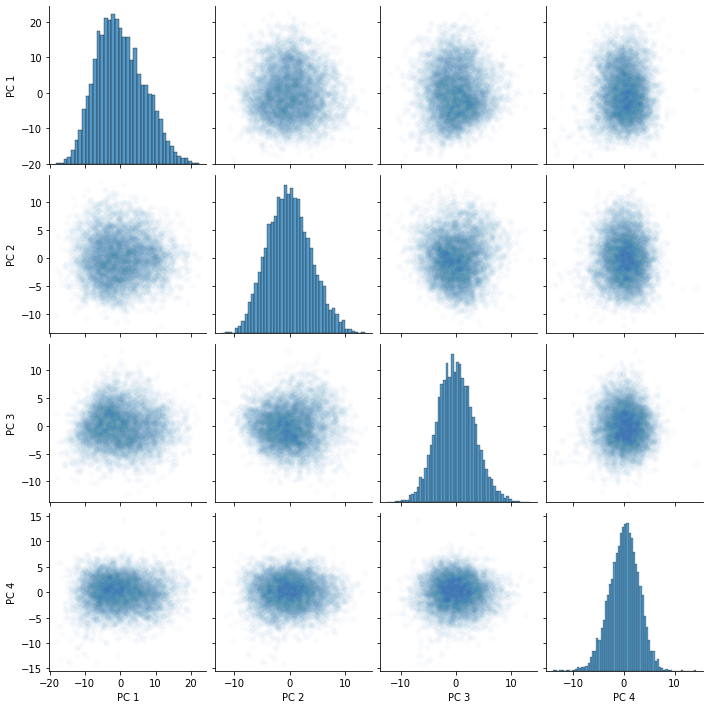

In [18]:
#Use a Pairplot to see what we have to start
plt.figure(figsize=(15,15))
sns.pairplot(pd.DataFrame(cluster_pca,
                          columns = [f'PC {i}' for i in range(1,5)]),
             plot_kws={'alpha':0.025})
plt.show()

There does not look like much to provide differentiation in order to develop separate clusters.  PC1/PC2 does look to have a bigger spread in the data, where as the other combinations of PC's are more concentrated in the centre.

The PC's themselves have relatively normal distributions.  Not much to go on yet before we do our clustering here.  We will try to visualize again with TSNE.  In order to better use TSNE, I used some extra resources including the following: https://distill.pub/2016/misread-tsne/

In [19]:
tsne = TSNE(n_components=2)

cluster_tsne = tsne.fit_transform(cluster_scaled_df)

<Figure size 432x288 with 0 Axes>

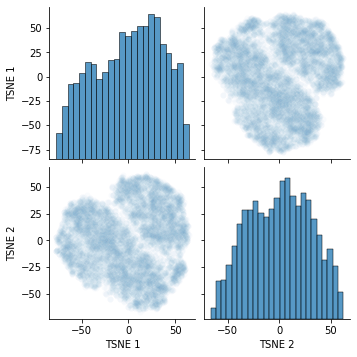

In [32]:
#Another pairplot to visualize what we see
plt.figure()
sns.pairplot(pd.DataFrame(cluster_tsne, columns = [f'TSNE {i}' for i in range(1,3)]), 
             plot_kws={'alpha':0.025})
plt.show()

There does seem to be some defining lines in this dataset.  We will try to tune our TSNE to see if we can get a better visual of the clustering.  With some defined shapes here, perhaps it was stopped too early, we'll try to increase the number of iterations to see if there is more clarity

<Figure size 1080x1080 with 0 Axes>

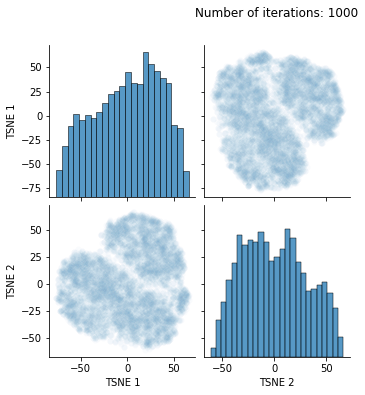

<Figure size 1080x1080 with 0 Axes>

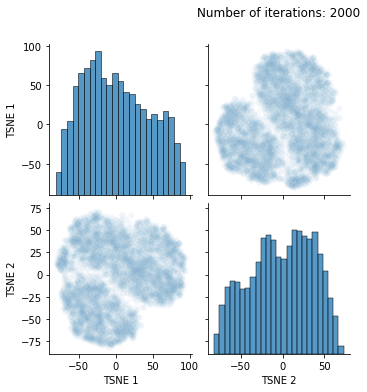

<Figure size 1080x1080 with 0 Axes>

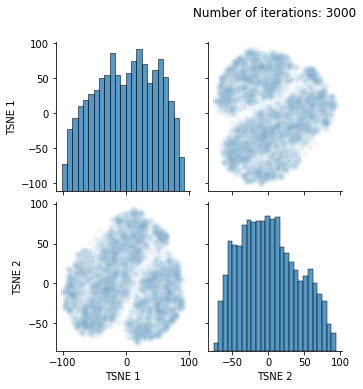

<Figure size 1080x1080 with 0 Axes>

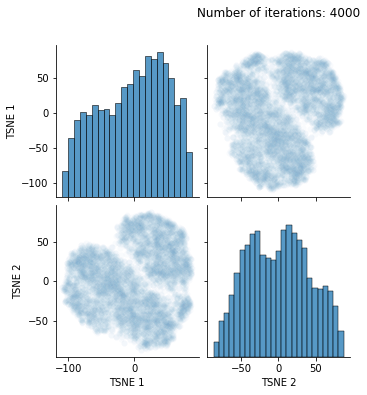

<Figure size 1080x1080 with 0 Axes>

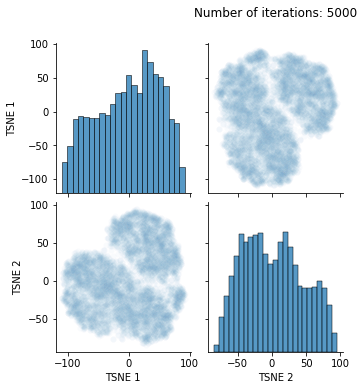

In [33]:
for num in range(1000, 5001, 1000):
    tsne = TSNE(n_components=2, 
               n_iter = num)
    
    cluster_tsne = tsne.fit_transform(cluster_scaled_df)

    plt.figure(figsize=(15,15))
    sns.pairplot(pd.DataFrame(cluster_tsne, columns = [f'TSNE {i}' for i in range(1,3)]), plot_kws={'alpha':0.025})
    plt.title(f'Number of iterations: {num}', y = 2.2)
    plt.show()

Despite the increase in iterations, not much changed in the shape of the data using TSNE.  There does look like there is one clear dividing line between the data, with a small circle separate from the two large hemispheres of data.

The greatest definintion in these shapes is at 3000 iterations, where the larger cluster of data looks like it may have some defining features to it.  We'll see if we can visulize this better by keeping the iterations at 3000 but changing the perplexity of the data to see if changes in the balance between the local and global information of the dataset changes how it is visualized.

Since the data is still somewhat spread here, we will start with a value of 30 and increase from there to see if the increase in perplexity will result in more defined clusters.

<Figure size 1080x1080 with 0 Axes>

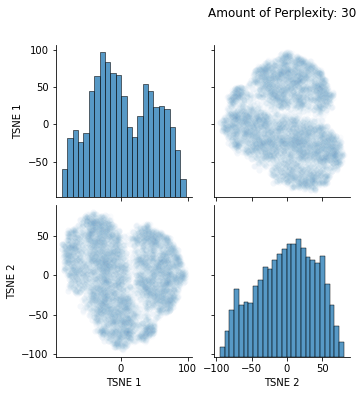

<Figure size 1080x1080 with 0 Axes>

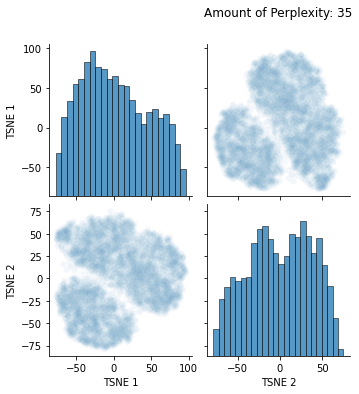

<Figure size 1080x1080 with 0 Axes>

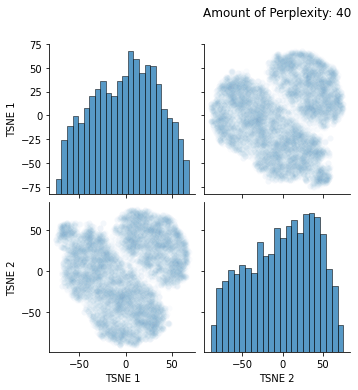

<Figure size 1080x1080 with 0 Axes>

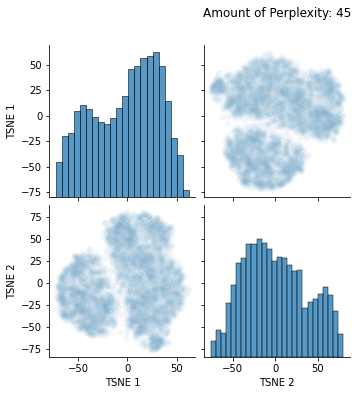

<Figure size 1080x1080 with 0 Axes>

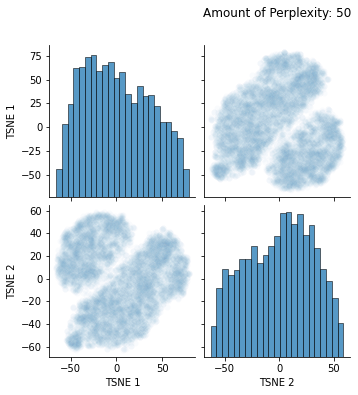

In [34]:
for num in range(30, 51, 5):
    tsne = TSNE(n_components=2, 
               n_iter = 3000,
               perplexity = num)
    
    cluster_tsne = tsne.fit_transform(cluster_scaled_df)

    plt.figure(figsize=(15,15))
    sns.pairplot(pd.DataFrame(cluster_tsne, columns = [f'TSNE {i}' for i in range(1,3)]), plot_kws={'alpha':0.025})
    plt.title(f'Amount of Perplexity: {num}', y = 2.2)
    plt.show()

Increasing the perplexity makes it look like there are certainly 2 distinct clusters but not much more.  We'll try one more visualization and increase the iterations further and see if we can get something more defined.

<Figure size 1080x1080 with 0 Axes>

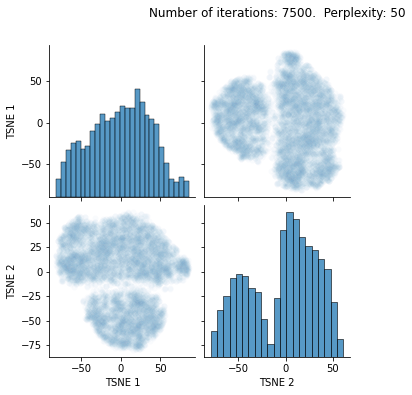

In [36]:
tsne = TSNE(n_components=2, 
            perplexity = 50,
            n_iter = 7500)
    
cluster_tsne = tsne.fit_transform(cluster_scaled_df)

plt.figure(figsize=(15,15))
sns.pairplot(pd.DataFrame(cluster_tsne, columns = [f'TSNE {i}' for i in range(1,3)]), plot_kws={'alpha':0.025})
plt.title(f'Number of iterations: 7500.  Perplexity: 50', y = 2.2)
plt.show()

With this it looks like there may be 3 defined clusters of data, but the overall shape of the data did not change much through the different iterations.

Now we will start to attempt to cluster the data itself.

### Clsutering Data For All Players

<a id = 'clusterall'></a>

In [37]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

We'll use the silouette score to measure how defined the clusters are in each iteration.  We'll do this across a range of the number of clusters and see what number may be the most appropriate for our data.

In [38]:
#We'll try 2-10 clusters to start
k_values = range(2, 11)

#An empty dataframe to save our measures to for the K-Means clustering
results = pd.DataFrame()

for k in k_values:
    kmeans = KMeans(n_clusters = k)
    y_labels = kmeans.fit_predict(cluster_scaled_df)

    #evaluate clustering with inertia, silhouette, size of clusters...
    print(f'KMeans with K = {k}')
    inertia = kmeans.inertia_
    s_score = silhouette_score(cluster_scaled_df, y_labels)
    unique_values, counts = np.unique(y_labels, return_counts = True)

    results = results.append({'k':k,
                              'inertia': inertia,
                              'Silhouette Score': s_score,
                              'Counts': counts},
                             ignore_index=True)

KMeans with K = 2
KMeans with K = 3
KMeans with K = 4
KMeans with K = 5
KMeans with K = 6
KMeans with K = 7
KMeans with K = 8
KMeans with K = 9
KMeans with K = 10


In [39]:
results

,k,inertia,Silhouette Score,Counts
0,2.0,633979.287512,0.197572,"[2579, 3647]"
1,3.0,585652.076622,0.111644,"[1472, 2109, 2645]"
2,4.0,547033.297487,0.112023,"[1593, 1767, 1405, 1461]"
3,5.0,524000.959367,0.098373,"[1201, 1395, 1183, 1121, 1326]"
4,6.0,506647.576724,0.091286,"[737, 1255, 1083, 984, 1060, 1107]"
5,7.0,492042.541357,0.093328,"[1032, 1038, 1123, 613, 975, 1221, 224]"
6,8.0,479230.994049,0.085455,"[911, 881, 903, 807, 551, 812, 210, 1151]"
7,9.0,468453.481289,0.086036,"[932, 787, 809, 716, 853, 669, 721, 195, 544]"
8,10.0,459348.576706,0.082137,"[598, 773, 193, 766, 741, 690, 518, 687, 486, ..."


Looking at the counts, it does look like there are 2 fairly distinct clusters that splits the data approxiamtely 60/40.

The silhouette score at 4 clusters is actually greater than it is at 3 clusters.  The score is also greater at 7 clusters than it is at 6 clusters.  The silhouette score itself (and in general) is pretty low, so there would be a lot of overlap within these clusters.

We'll try to visualize this to see if we can get a better sense as to the appropriate number of clusters.

In [40]:
results = results.set_index('k')

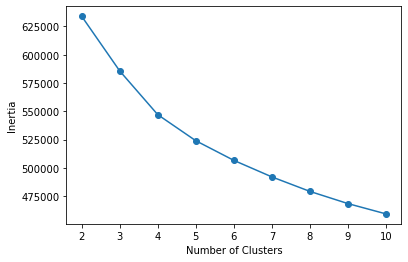

In [41]:
results['inertia'].plot(kind='line', marker = 'o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
sns.despine
plt.show()

There isn't a distinct flattening of the inertia relative to the number of clusters.  Considering the variation of play styles and performance profiles a hockey player could have, this shows that they are not easily fit into distinct boxes, or at least as few as this.

That being said, the decreases in inertia start to flatten out at around 5 clusters, albeit gradually, so that may be a decent target.  We'll try this again with the Silhouette score.

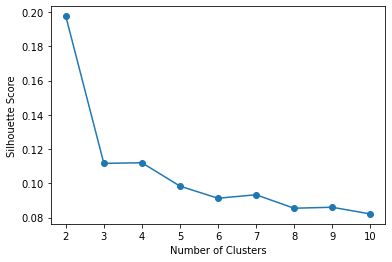

In [42]:
results['Silhouette Score'].plot(kind='line', marker = 'o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
sns.despine
plt.show()

2 clusters is clearly higher than the rest, but the silhouette score stays steady at 4 before dropping down at 5.

It would seem that 2 clusters is the best combination between silhouette scores, but in order to lower the inertia and get some potentially more pertinent feedback from our clusters, 4 clusters may be better keeping in mind that there will be a lot of overlap in the data.

Using the first 4 PC's, we'll try to visualize what each of these clusterings look like when plotting the PC's and using TSNE.

First we'll go with 2 clusters.

In [43]:
kmeans = KMeans(n_clusters = 2)
clusters2 = kmeans.fit_predict(cluster_scaled_df)

In [44]:
#PCA dataframe in order to graph the data
pca_df = pd.DataFrame(cluster_pca, columns = [f'PC {i}' for i in range(1,5)])
pca_df['Clusters'] = clusters2+1

<Figure size 1080x1080 with 0 Axes>

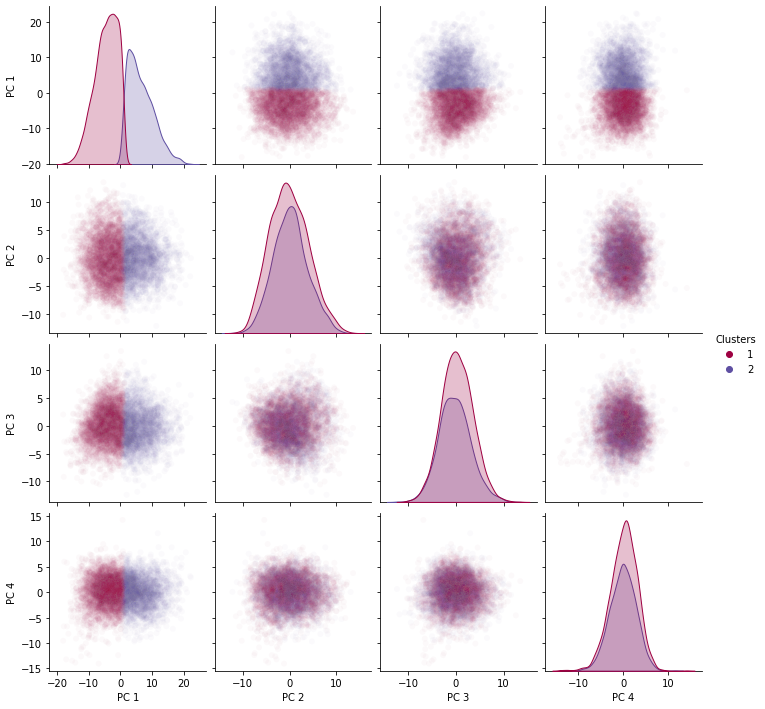

In [45]:
plt.figure(figsize=(15,15))
sns.pairplot(pca_df, 
             plot_kws={'alpha':0.025},
             hue = 'Clusters',
             palette = 'Spectral')
plt.show()

In [46]:
tsne = TSNE(n_components=2, 
            perplexity = 30,
            n_iter = 3000)
    
cluster_tsne = tsne.fit_transform(cluster_scaled_df)

In [47]:
tsne_df = pd.DataFrame(cluster_tsne, columns = [f'TSNE {i}' for i in range(1,3)])
tsne_df['Clusters'] = clusters2+1

<Figure size 1080x1080 with 0 Axes>

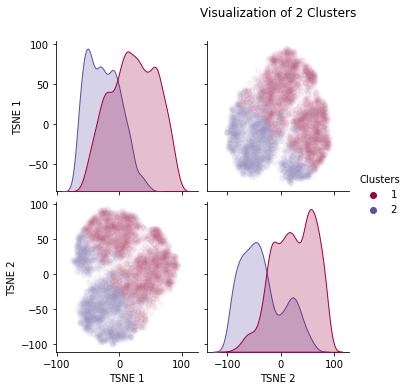

In [48]:
plt.figure(figsize=(15,15))
sns.pairplot(tsne_df,
             plot_kws={'alpha':0.025},
             hue = 'Clusters',
             palette = 'Spectral')
             
plt.title(f'Visualization of 2 Clusters', y = 2.2)
plt.show()

Using two clusters does not look like it clustered our data very effectively here.  Looking at our PC's it looks as though it splits our data right in half with PC1 and PC2.  Looking at TSNE, there visually looks like there may be some separation between two large groups of data, but the clustering split the data almost perpendicular to that divide.

I'll try again to see if 4 clusters is more informative.

In [49]:
kmeans = KMeans(n_clusters = 4)
clusters4 = kmeans.fit_predict(cluster_scaled_df)

In [50]:
#PCA dataframe in order to graph the data
pca_df = pd.DataFrame(cluster_pca, columns = [f'PC {i}' for i in range(1,5)])
pca_df['Clusters'] = clusters4+1

<Figure size 1080x1080 with 0 Axes>

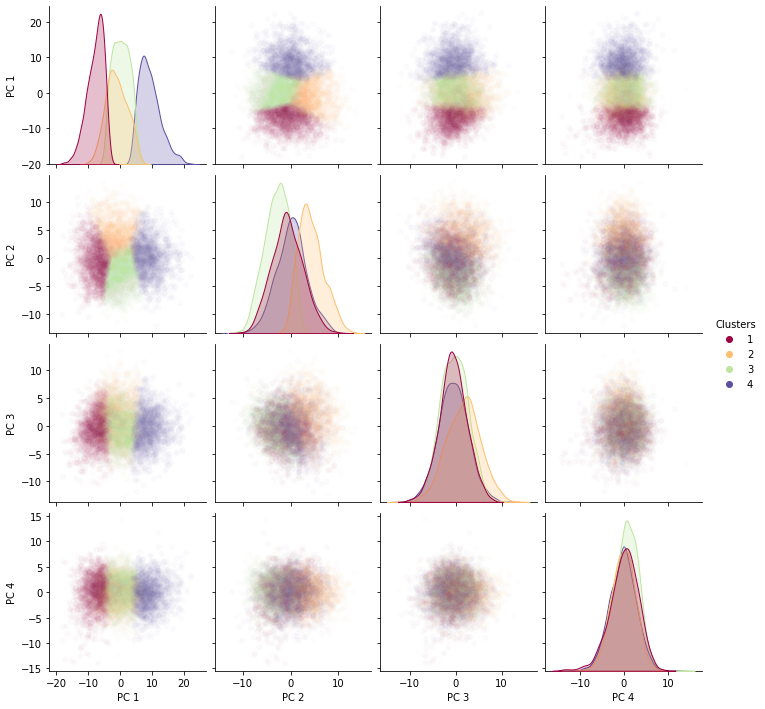

In [51]:
plt.figure(figsize=(15,15))
sns.pairplot(pca_df, 
             plot_kws={'alpha':0.025},
             hue = 'Clusters',
             palette = 'Spectral')
plt.show()

In [52]:
tsne = TSNE(n_components=2, 
            perplexity = 30,
            n_iter = 3000)
    
cluster_tsne = tsne.fit_transform(cluster_scaled_df)

In [53]:
tsne_df = pd.DataFrame(cluster_tsne, columns = [f'TSNE {i}' for i in range(1,3)])
tsne_df['Clusters'] = clusters4+1

<Figure size 1080x1080 with 0 Axes>

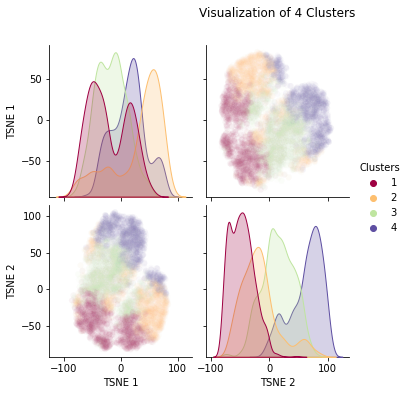

In [54]:
plt.figure(figsize=(15,15))
sns.pairplot(tsne_df,
             plot_kws={'alpha':0.025},
             hue = 'Clusters',
             palette = 'Spectral')
             
plt.title(f'Visualization of 4 Clusters', y = 2.2)
plt.show()

This seems to be a bit more informative on the clusters.  Looking at the PC's, Clusters 1 and 4 are definitely in distinct areas of the plotting looking at the effect of PC1 on the other PC's, whereas clusters 2 and 3 are split on PC1 and PC2, but after that largely overlap.

The TSNE provides an even better sense of division between the clusters.  Looking at the two pre-defined 'hemispheres' of data, Cluster 2 is mostly on one hemisphere, while clusters 3 and 4 are mostly on the other one with very little overlap.  Cluster 1 looks to be a bit more nebulous.

With this, we will look place these three cluster labels on our original data and see if anything can be gleamed from these clusters in regards to the performance profile of the players.

In [55]:
cluster_scaled_df['Clusters2'] = clusters2+1

In [56]:
cluster_scaled_df['Clusters4'] = clusters4+1

In [57]:
cluster_scaled_df.head()

,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%,Clusters2,Clusters4
0,1.039312,1.252020,1.033809,1.066885,1.174009,0.261434,-1.220764,0.964076,-1.201392,0.595310,-1.245534,0.401555,-1.521581,0.133515,-1.674447,0.875613,1.230664,0.979923,0.975978,0.976843,-0.196861,0.794072,0.079609,0.469249,1.503946,-0.348926,0.206838,0.367736,0.509218,0.455503,0.424410,0.736123,0.758648,0.774665,0.468411,0.931597,2.529974,-0.092216,0.637042,0.775116,1.197929,0.812829,0.960839,1.578584,1.567907,1.637495,-0.182270,-0.149097,0.190858,-0.810809,-0.301981,-0.352631,-0.749370,-0.433408,-0.405682,-0.332915,-0.335369,0.021498,-0.603236,-0.641684,0.029507,-0.471764,-0.477811,-0.056079,-0.529258,-0.563695,-0.009005,1.412549,0.599871,2.111658,1.222914,1.886552,1.206428,1.774316,1.049950,1.416939,0.636102,1.425510,2.044718,1.608076,1.595508,1.582130,1.894495,2.122696,1.655673,-0.562440,0.751125,2.206774,0.373846,-0.320891,0.637033,0.763534,1.898090,1.763633,1.776933,1.804179,0.230031,1.153683,0.118943,-0.647363,0.206834,0.367734,0.233299,1.071892,0.424408,0.801092,0.832085,0.842716,-0.295591,-0.498630,0.808624,-0.075300,-0.029217,0.181754,-0.163058,0.056377,0.621065,0.480351,1.391541,0.866236,1.094901,1.129960,1.310716,0.279463,1.058301,0.844362,0.481048,0.852469,1.436769,0.815484,0.777103,0.210383,2,4
1,1.111279,1.025139,0.841464,0.895454,1.052629,0.667035,-0.933368,0.257049,-1.526856,0.109081,-1.421308,-0.127007,-1.765363,0.378717,-1.223511,1.049985,0.923220,0.750013,0.762914,0.939881,0.835749,0.118832,0.851824,0.616038,-0.326729,0.362680,0.223619,-0.442084,0.621850,0.669765,-0.158402,0.776435,0.820549,0.848144,1.637335,1.093015,-0.397176,0.339303,0.530222,-0.753361,1.257172,1.142148,-0.119593,1.545501,1.567907,1.637495,0.130212,0.002397,0.070225,-0.631207,-0.053514,-0.265445,-0.794384,-0.114251,-0.963576,-0.169698,-0.170103,-0.776126,-0.603236,-0.641684,0.029507,0.048371,0.049645,-1.490544,-0.529258,-0.563695,-0.009005,1.647188,0.716727,1.536053,0.913044,1.447504,0.971606,1.316231,0.784054,1.453918,0.775787,1.642333,1.448320,1.159181,1.175528,1.444148,1.709907,1.781295,1.617938,-0.192497,0.440460,1.110045,-0.281843,0.223725,0.530211,0.290672,1.085418,0.734222,0.753227,0.776953,0.097021,0.613292,-0.157718,0.415964,0.223614,-0.442082,-0.000620,0.650675,-0.158403,0.259346,0.287564,0.300887,0.030991,-0.725955,0.315482,-0.132372,0.267541,-0.272503,-0.407087,-0.028159,0.859185,0.222669,1.052458,0.764988,1.205327,1.143765,1.176574,0.440160,0.665999,0.844362,0.369802,0.539564,1.282642,1.084973,-0.098335,-0.167983,2,4
2,-0.288643,0.830902,0.839862,1.011286,0.408378,-0.549768,-0.240234,1.105892,-0.271888,0.958860,-0.493948,0.851894,-0.977088,0.179491,-0.392838,-0.317457,0.866085,0.855308,0.996170,0.348489,-1.294009,0.112749,-0.712577,-0.139656,0.325746,0.894031,-0.397247,0.061804,-0.521035,0.053762,-0.262013,-0.464611,-0.463897,-0.466316,-0.840784,-0.157969,0.474741,0.770823,-0.537977,0.069665,-0.559611,0.081010,-0.285813,-0.489135,-0.460031,-0.496553,1.393730,1.259109,1.586757,-0.242070,-0.853661,1.085932,-0.524300,1.162

We will also re-add many of our columns to get a better understanding of these clusters.

In [59]:
cluster_scaled_df[['Player','Age','Year','Draft Overall','Cap Hit','Defenceman','Team','Predicted_Cap_Hit','Prediction_Difference']] = clean_df[['Player','Age','Year','Draft Ov','Cap_Hit','Defenceman','Team','Predicted_Cap_Hit','Prediction_Difference']]

In [60]:
cluster_scaled_df.head()

,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%,Clusters2,Clusters4,Player,Age,Year,Draft Overall,Cap Hit,Defenceman,Team,Predicted_Cap_Hit,Prediction_Difference
0,1.039312,1.252020,1.033809,1.066885,1.174009,0.261434,-1.220764,0.964076,-1.201392,0.595310,-1.245534,0.401555,-1.521581,0.133515,-1.674447,0.875613,1.230664,0.979923,0.975978,0.976843,-0.196861,0.794072,0.079609,0.469249,1.503946,-0.348926,0.206838,0.367736,0.509218,0.455503,0.424410,0.736123,0.758648,0.774665,0.468411,0.931597,2.529974,-0.092216,0.637042,0.775116,1.197929,0.812829,0.960839,1.578584,1.567907,1.637495,-0.182270,-0.149097,0.190858,-0.810809,-0.301981,-0.352631,-0.749370,-0.433408,-0.405682,-0.332915,-0.335369,0.021498,-0.603236,-0.641684,0.029507,-0.471764,-0.477811,-0.056079,-0.529258,-0.563695,-0.009005,1.412549,0.599871,2.111658,1.222914,1.886552,1.206428,1.774316,1.049950,1.416939,0.636102,1.425510,2.044718,1.608076,1.595508,1.582130,1.894495,2.122696,1.655673,-0.562440,0.751125,2.206774,0.373846,-0.320891,0.637033,0.763534,1.898090,1.763633,1.776933,1.804179,0.230031,1.153683,0.118943,-0.647363,0.206834,0.367734,0.233299,1.071892,0.424408,0.801092,0.832085,0.842716,-0.295591,-0.498630,0.808624,-0.075300,-0.029217,0.181754,-0.163058,0.056377,0.621065,0.480351,1.391541,0.866236,1.094901,1.129960,1.310716,0.279463,1.058301,0.844362,0.481048,0.852469,1.436769,0.815484,0.777103,0.210383,2,4,aaron ekblad,18,2015,1.0,0.925,1,FLA,1.425904,0.500904
1,1.111279,1.025139,0.841464,0.895454,1.052629,0.667035,-0.933368,0.257049,-1.526856,0.109081,-1.421308,-0.127007,-1.765363,0.378717,-1.223511,1.049985,0.923220,0.750013,0.762914,0.939881,0.835749,0.118832,0.851824,0.616038,-0.326729,0.362680,0.223619,-0.442084,0.621850,0.669765,-0.158402,0.776435,0.820549,0.848144,1.637335,1.093015,-0.397176,0.339303,0.530222,-0.753361,1.257172,1.142148,-0.119593,1.545501,1.567907,1.637495,0.130212,0.002397,0.070225,-0.631207,-0.053514,-0.265445,-0.794384,-0.114251,-0.963576,-0.169698,-0.170103,-0.776126,-0.603236,-0.641684,0.029507,0.048371,0.049645,-1.490544,-0.529258,-0.563695,-0.009005,1.647188,0.716727,1.536053,0.913044,1.447504,0.971606,1.316231,0.784054,1.453918,0.775787,1.642333,1.448320,1.159181,1.175528,1.444148,1.709907,1.781295,1.617938,-0.192497,0.440460,1.110045,-0.281843,0.223725,0.530211,0.290672,1.085418,0.734222,0.753227,0.776953,0.097021,0.613292,-0.157718,0.415964,0.223614,-0.442082,-0.000620,0.650675,-0.158403,0.259346,0.287564,0.300887,0.030991,-0.725955,0.315482,-0.132372,0.267541,-0.272503,-0.407087,-0.028159,0.859185,0.222669,1.052458,0.764988,1.205327,1.143765,1.176574,0.440160,0.665999,0.844362,0.369802,0.539564,1.282642,1.084973,-0.098335,-0.167983,2,4,aaron ekblad,19,2016,1.0,0.925,1,FLA,1.306689,0.381689
2,-0.288643,0.830902,0.839862,1.011286,0.408378,-0.549768,-0.240234,1.105892,-0.271888,0.958860,-0.493948,0.851894,-0.977088,0.179491,-0.392838,-0.317457,0.866085,0.855308,0.996170,0.348489,-1.294009,0.112749,-0.712577,-0.139656,0.325746,0.894031,-0.397247,0.061804,-0.521035,0.053762,-0.262013,-0.464611,-0.

### Analyzing Clusters for All Players

First we'll analyze splitting our data into 2 clusters.

In [61]:
mean_clusters2 = cluster_scaled_df.groupby('Clusters2').mean()

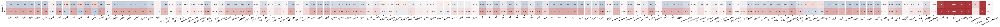

In [62]:
plt.figure(figsize=(100,20))

ax = sns.heatmap(mean_clusters2,
                cmap='vlag',
                 xticklabels=list(mean_clusters2.columns),
                 linewidths = 1,
                 annot = True,
                 vmin=-2,
                 vmax=+2,
                cbar = False)

plt.yticks(rotation=0)
plt.xticks(rotation=25)
ax.set_aspect("equal")

This is not too difficult to decipher, these two clusters split the players into 'good' and 'bad' NHLers.  Cluster 1 encompasses players who are below average in our statistics, whereas Cluster 2 are the above average players.  While this may be the most 'accurate' way to divide the players, it does not provide us with something very actionable considering the range of salaries in the league.

I'll try again with 4 clusters.

In [63]:
mean_clusters4 = cluster_scaled_df.groupby('Clusters4').mean()

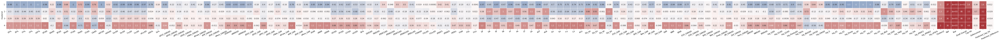

In [64]:
plt.figure(figsize=(100,20))

ax = sns.heatmap(mean_clusters4,
                cmap='vlag',
                 xticklabels=list(mean_clusters4.columns),
                 linewidths = 1,
                 annot = True,
                 vmin=-2,
                 vmax=2,
                cbar = False)

plt.yticks(rotation=0)
plt.xticks(rotation=25)
ax.set_aspect("equal")

Again, it looks like these clusters primarily group players together by overall production without much differentiating between specific statistics, with the exception of cluster #4.

Cluster 4 are the above average players in the league, similar to Cluster 2 in the previous iteration.

Cluster 1 are the poor players, who may be more defencemen than fowards, but have the lowest production of all the clusters.

Cluster 2 These are players who are primarily defencemen with who are on the ice a lot (the highest totals for TOI_All, TOI_EV and TOI_SH) which results in them have totals in shots against them (GA, SA, FA, CA).

Cluster 3 are average players, who may be more forwards than defencemen, and are in the middle of the road in overall production.

After observing these clusters, and how broad they are, I think that we might get more useful information by clustering the Defencemen and the Forwards separately.  In hockey, these positions are generally very separated and it is extremely rare for players to play both positions.  As well, there may be too much overlap in the statistics to appreicate the level of performance, especially the offensive contribtions from a defenceman.

Perhaps by clustering the positions separately I will be able to get clusters that are more informative about the players that could have more actionable results.

### Clustering, Separating Positions

In [65]:
#We'll separate the positions first
defence_df = clean_df[clean_df['Defenceman'] == 1]

In [66]:
forward_df = clean_df[clean_df['Defenceman'] == 0]

In [67]:
defence_df.head()

,Player,Team,Birthday,Age,Draft Ov,GP,TOI,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,Year,Cap_Hit,ID,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%,Left_Handed,Defenceman,Predicted_Cap_Hit,Prediction_Difference
0,aaron ekblad,FLA,1996-02-07,18,1.0,81,1766.62,59.96,57.82,56.61,57.07,58.74,2.93,1.96,34.78,25.38,45.59,34.94,59.18,44.51,2.78,1.95,0.97,9.40,10.65,14.67,0.83,8.43,92.29,0.183,0.105,1.267,-0.170,0.033,0.023,0.324,0.100,0.056,0.454,0.086,0.165,4.5,2.6,4.7,-0.1,1.0,0.7,9.2,2.5,1.6,13.4,2.5,4.9,5.77,8.08,11.92,0.30,7.06,1.39,0.88,0.54,0.51,0.00,0.00,-0.03,0.0,0.0,0.0,0,0,-1,0,0,0,86.30,57.63,1024.10,747.21,1342.33,1028.68,1742.44,1310.56,81.86,57.49,28.67,276.89,313.65,431.88,24.37,1766.6,1485.7,221.4,31.5,5.5,5.7,1.2,-0.3,1.0,6.7,5.4,13.8,2.6,5.0,0.222,0.230,0.326,-0.547,0.033,0.023,0.236,0.214,0.056,0.467,0.089,0.170,2015,0.925,aaron ekblad-18-2015,0.343590,0.292670,0.457425,0.841567,1.798404,1.313724,1.547563,1.726332,2.564949,2.397895,2.890372,3.688879,5.141664,5.476464,5.863631,2.299581,4.394449,3.737670,3.295837,4.700480,4.919981,2.833213,2.772589,2.506296,0,1,1.425904,0.500904
1,aaron ekblad,FLA,1996-02-07,19,1.0,78,1690.82,60.69,56.43,55.41,55.96,57.83,3.29,2.13,31.34,24.20,42.34,34.07,54.45,42.84,2.94,2.14,1.16,7.14,8.27,11.61,0.80,10.51,91.18,0.415,0.132,-0.004,0.359,0.034,-0.022,0.358,0.140,0.011,0.468,0.090,0.174,9.5,3.0,0.0,0.3,0.9,-0.6,9.5,3.4,0.3,13.2,2.5,4.9,6.46,8.52,11.50,0.36,8.24,1.45,0.85,0.67,0.28,0.04,0.04,-0.39,0.0,0.0,0.0,1,1,-11,0,0,0,92.85,60.15,883.09,681.85,1193.09,960.11,1534.30,1207.24,82.79,60.38,32.70,201.24,232.98,327.06,22.41,1690.8,1378.1,218.3,55.1,4.2,3.0,0.2,0.2,0.9,4.4,3.2,7.9,1.5,2.9,0.181,0.130,0.056,0.262,0.034,-0.022,0.164,0.135,0.011,0.280,0.054,0.104,2016,0.925,aaron ekblad-19-2016,0.425268,0.246860,0.378436,0.824175,1.981001,1.128171,1.408545,1.699279,2.772589,2.197225,2.639057,3.610918,5.209486,5.484797,5.783825,2.415914,4.094345,3.737670,3.218876,4.477337,4.844187,2.995732,2.197225,2.026296,0,1,1.306689,0.381689
2,aaron ekblad,FLA,1996-02-07,20,1.0,68,1459.28,46.49,55.24,55.40,56.71,53.00,2.21,2.54,35.47,28.75,48.02,38.66,63.21,48.24,2.81,2.49,-0.33,6.72,9.36,14.96,0.32,6.22,91.17,-0.055,-0.007,0.449,0.754,-0.003,0.006,0.013,0.025,0.003,0.037,0.007,0.013,-1.1,-0.1,1.4,0.7,-0.1,0.1,0.3,0.5,0.1,0.9,0.2,0.3,9.25,12.17,16.78,0.49,4.44,2.38,1.03,1.19,0.70,0.00,0.00,-0.49,0.0,0.0,0.0,0,0,-12,0,0,0,53.64,61.75,862.68,699.13,1167.80,940.17,1537.28,1173.32,68.38,60.63,-8.11,163.55,227.63,363.96,7.75,1459.3,1194.7,187.3,52.9,-6.2,0.5,0.9,0.7,-0.1,-5.3,1.2,-4.0,-0.8,-1.5,-0.311,0.027,0.275,0.787,-0.003,0.006,-0.231,0.059,0.003,-0.166,-0.031,-0.060,2017,0.925,aaron ekblad-20-2017,0.343590,0.148420,0.254642,0.620576,1.477049,1.266948,1.530395,1.492904,2.397895,1.609438,2.079442,3.091042,5.420535,5.693732,6.013715,2.567254,4.143135,4.077537,3.258097,4.488636,4.442651,3.401197,2.890372,2.216296,0,1,2.347113,1.422113
3,aaron ekblad,FLA,1996-02-07,21,1.0,82,1917.90,53.04,48.15,48.85,48.87,47.70,3.60,3.19,34.88,37.56,47.86,50.11,60.62,63.41,3.26,3.57,0.41,-2.68,-2.25,-2.79,-0.31,10.33,91.51,0.

In [68]:
forward_df.head()

,Player,Team,Birthday,Age,Draft Ov,GP,TOI,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,Year,Cap_Hit,ID,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%,Left_Handed,Defenceman,Predicted_Cap_Hit,Prediction_Difference
8,aaron palushaj,COL,1989-09-07,23,44.0,25,282.88,46.60,50.36,49.30,48.95,52.21,2.78,3.18,32.81,32.34,42.16,43.36,54.77,57.12,2.45,2.25,-0.41,0.46,-1.20,-2.35,0.21,8.46,90.16,0.514,-0.141,-0.734,-0.026,-0.007,0.215,0.431,-0.141,0.208,0.506,0.094,0.174,2.3,-0.6,-0.2,0.0,0.0,1.0,2.0,-0.6,1.0,2.4,0.4,0.8,6.15,7.85,10.39,0.40,6.90,1.06,1.70,0.85,1.91,0.00,0.00,1.06,0.42,1.27,-0.85,0,0,5,2,6,-4,13.09,15.00,154.68,152.49,198.76,204.44,258.20,269.29,11.57,10.59,-1.91,2.19,-5.68,-11.09,0.98,282.9,263.1,18.6,0.0,3.1,0.3,0.0,0.0,0.0,3.1,0.3,4.3,0.8,1.5,0.696,0.067,0.045,-0.725,-0.007,0.215,0.653,0.066,0.208,0.920,0.171,0.317,2013,0.600,aaron palushaj-23-2013,0.350657,0.494696,0.615186,1.068153,1.857859,1.324419,2.052841,2.079442,1.098612,1.386294,1.609438,2.302585,3.401197,3.637586,3.912023,1.064711,2.639057,1.791759,2.197225,3.496508,3.526361,1.609438,2.302585,1.136296,0,0,0.863599,0.263599
11,aaron volpatti,VAN/WSH,1985-05-30,27,293.0,33,275.13,41.32,45.85,48.68,46.13,47.88,1.09,1.55,23.17,27.36,34.11,35.95,43.61,50.92,1.74,1.90,-0.46,-4.19,-1.84,-7.31,-0.15,4.71,94.34,-0.256,0.353,-0.096,-0.026,-0.041,-0.022,-0.254,0.353,-0.063,0.032,0.006,0.011,-1.2,1.6,0.0,0.0,-0.2,-0.1,-1.2,1.6,-0.3,0.1,0.0,0.0,4.58,6.98,9.16,0.42,4.76,1.09,0.87,1.09,0.65,1.09,1.09,-0.44,0.22,0.65,-0.44,5,5,-2,1,3,-2,5.00,7.10,106.23,125.45,156.40,164.85,199.96,233.50,8.00,8.71,-2.10,-19.22,-8.45,-33.54,-0.71,275.1,271.1,3.8,0.1,-1.5,0.8,0.0,0.0,-0.2,-1.5,0.8,-1.0,-0.2,-0.3,-0.330,0.181,0.072,-0.596,-0.041,-0.022,-0.325,0.181,-0.063,-0.208,-0.039,-0.072,2013,0.600,aaron volpatti-27-2013,0.198851,0.198851,0.000000,0.364643,1.415853,1.156881,2.915064,2.613740,0.693147,0.693147,0.000000,1.098612,3.091042,3.496508,3.761200,1.068153,2.397895,1.791759,1.609438,4.394449,4.077537,1.791759,1.386294,0.306296,1,0,0.674063,0.074063
12,aaron volpatti,WSH,1985-05-30,28,293.0,41,301.87,37.01,39.99,40.29,40.40,40.31,0.81,1.38,20.14,30.22,27.87,41.31,39.27,57.93,1.44,2.12,-0.57,-10.08,-13.44,-18.66,-0.69,4.04,95.42,-0.424,-0.306,0.000,0.000,-0.061,-0.057,-0.424,-0.306,-0.118,-0.842,-0.159,-0.298,-2.1,-1.5,0.0,0.0,-0.3,-0.3,-2.1,-1.5,-0.6,-4.2,-0.8,-1.5,3.58,5.37,7.75,0.40,11.11,0.20,1.19,1.39,0.40,0.99,0.99,-0.99,0.80,1.59,-0.80,5,5,-5,4,8,-4,4.09,6.96,101.32,152.03,140.24,207.84,197.58,291.44,7.22,10.69,-2.87,-50.71,-67.60,-93.86,-3.47,301.9,299.5,0.8,0.2,-2.9,-0.5,0.0,0.0,-0.3,-2.9,-0.5,-3.9,-0.7,-1.4,-0.575,-0.093,0.615,-0.417,-0.061,-0.057,-0.572,-0.093,-0.118,-0.779,-0.148,-0.276,2014,0.575,aaron volpatti-28-2014,0.336472,0.000000,0.000000,0.336472,2.129421,1.095273,2.791165,2.479056,1.098612,0.000000,0.000000,1.098612,2.944439,3.332205,3.688879,1.105257,2.397895,0.693147,1.945910,4.356709,4.025352,2.079442,1.098612,1.203704,1,0,0.964936,0.389936
16,adam burish,S.J,1983-01-06,29,282.0,46,486.20,21.01,38.58,39.72,39.56,38.50,0.62,2.32,20.75,33.03,31.44,47.72,44.01,67.23,1.

In [70]:
#Dropping the same columns as we did previously
defence_df2 = defence_df.drop(columns = ['Player', 'Team', 'Birthday', 'ID', 'Cap_Hit', 'Year',
                                         'Left_Handed', 'GP', 'TOI', 'Age', 'Draft Ov', 'Cap_Hit',
                                         'Defenceman', 'Predicted_Cap_Hit', 'Prediction_Difference'])

We will start with the defencemen and see what we can identify from here.

### Scaling and Visualizing Clusters for Defencemen

<a id = 'visuald'></a>

In [108]:
defence_df2.head()

,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%
0,59.96,57.82,56.61,57.07,58.74,2.93,1.96,34.78,25.38,45.59,34.94,59.18,44.51,2.78,1.95,0.97,9.40,10.65,14.67,0.83,8.43,92.29,0.183,0.105,1.267,-0.170,0.033,0.023,0.324,0.100,0.056,0.454,0.086,0.165,4.5,2.6,4.7,-0.1,1.0,0.7,9.2,2.5,1.6,13.4,2.5,4.9,5.77,8.08,11.92,0.30,7.06,1.39,0.88,0.54,0.51,0.00,0.00,-0.03,0.0,0.0,0.0,0,0,-1,0,0,0,86.30,57.63,1024.10,747.21,1342.33,1028.68,1742.44,1310.56,81.86,57.49,28.67,276.89,313.65,431.88,24.37,1766.6,1485.7,221.4,31.5,5.5,5.7,1.2,-0.3,1.0,6.7,5.4,13.8,2.6,5.0,0.222,0.230,0.326,-0.547,0.033,0.023,0.236,0.214,0.056,0.467,0.089,0.170,0.343590,0.292670,0.457425,0.841567,1.798404,1.313724,1.547563,1.726332,2.564949,2.397895,2.890372,3.688879,5.141664,5.476464,5.863631,2.299581,4.394449,3.737670,3.295837,4.700480,4.919981,2.833213,2.772589,2.506296
1,60.69,56.43,55.41,55.96,57.83,3.29,2.13,31.34,24.20,42.34,34.07,54.45,42.84,2.94,2.14,1.16,7.14,8.27,11.61,0.80,10.51,91.18,0.415,0.132,-0.004,0.359,0.034,-0.022,0.358,0.140,0.011,0.468,0.090,0.174,9.5,3.0,0.0,0.3,0.9,-0.6,9.5,3.4,0.3,13.2,2.5,4.9,6.46,8.52,11.50,0.36,8.24,1.45,0.85,0.67,0.28,0.04,0.04,-0.39,0.0,0.0,0.0,1,1,-11,0,0,0,92.85,60.15,883.09,681.85,1193.09,960.11,1534.30,1207.24,82.79,60.38,32.70,201.24,232.98,327.06,22.41,1690.8,1378.1,218.3,55.1,4.2,3.0,0.2,0.2,0.9,4.4,3.2,7.9,1.5,2.9,0.181,0.130,0.056,0.262,0.034,-0.022,0.164,0.135,0.011,0.280,0.054,0.104,0.425268,0.246860,0.378436,0.824175,1.981001,1.128171,1.408545,1.699279,2.772589,2.197225,2.639057,3.610918,5.209486,5.484797,5.783825,2.415914,4.094345,3.737670,3.218876,4.477337,4.844187,2.995732,2.197225,2.026296
2,46.49,55.24,55.40,56.71,53.00,2.21,2.54,35.47,28.75,48.02,38.66,63.21,48.24,2.81,2.49,-0.33,6.72,9.36,14.96,0.32,6.22,91.17,-0.055,-0.007,0.449,0.754,-0.003,0.006,0.013,0.025,0.003,0.037,0.007,0.013,-1.1,-0.1,1.4,0.7,-0.1,0.1,0.3,0.5,0.1,0.9,0.2,0.3,9.25,12.17,16.78,0.49,4.44,2.38,1.03,1.19,0.70,0.00,0.00,-0.49,0.0,0.0,0.0,0,0,-12,0,0,0,53.64,61.75,862.68,699.13,1167.80,940.17,1537.28,1173.32,68.38,60.63,-8.11,163.55,227.63,363.96,7.75,1459.3,1194.7,187.3,52.9,-6.2,0.5,0.9,0.7,-0.1,-5.3,1.2,-4.0,-0.8,-1.5,-0.311,0.027,0.275,0.787,-0.003,0.006,-0.231,0.059,0.003,-0.166,-0.031,-0.060,0.343590,0.148420,0.254642,0.620576,1.477049,1.266948,1.530395,1.492904,2.397895,1.609438,2.079442,3.091042,5.420535,5.693732,6.013715,2.567254,4.143135,4.077537,3.258097,4.488636,4.442651,3.401197,2.890372,2.216296
3,53.04,48.15,48.85,48.87,47.70,3.60,3.19,34.88,37.56,47.86,50.11,60.62,63.41,3.26,3.57,0.41,-2.68,-2.25,-2.79,-0.31,10.33,91.51,0.273,-0.197,1.128,-0.540,-0.036,-0.025,0.362,-0.234,-0.061,0.049,0.010,0.018,6.8,-4.9,3.3,-1.6,-1.2,-0.8,10.1,-6.6,-2.0,1.6,0.3,0.6,5.91,8.85,12.48,0.39,8.47,3.10,1.25,0.91,0.28,0.09,0.09,-0.63,0.0,0.0,0.0,3,3,-20,0,0,0,115.16,101.95,1114.81,1200.56,1530.00,1601.91,1937.80,2027.05,104.15,114.21,13.21,-85.75,-71.91,-89.25,-10.06,1917.9,1500.0,173.4,181.2,5.1,-3.7,2.6,-1.7,-1.2,7.7,-5.4,0.3,0.1,0.1,0.204,-0.149,0.895,-0.547,-0.036,-0.025,0.276,-0.192,-0.061,0.011,0

In [72]:
ss = StandardScaler()
defence_scaled = ss.fit_transform(defence_df2)
defence_scaled_df = pd.DataFrame(data = defence_scaled, columns = defence_df2.columns)

In [73]:
defence_scaled_df.head(20)

,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%
0,1.430065,1.740519,1.501569,1.537714,1.713639,0.549330,-1.435049,1.468201,-1.488543,1.015703,-1.557134,0.764931,-1.868224,0.472049,-1.960439,1.301293,1.733090,1.456682,1.447566,1.539082,-0.217676,0.880871,0.470873,0.295439,1.697386,-0.340228,0.288254,0.659200,1.033602,0.290862,0.628216,1.065901,1.092408,1.111669,0.816262,0.611700,3.286087,-0.093501,0.577351,1.119501,1.716635,0.505791,1.045719,1.760478,1.750553,1.821704,0.973486,0.931184,0.915018,1.061883,0.902525,-0.714508,-0.015780,-0.402133,0.494398,-0.465368,-0.476382,0.751843,-0.162498,-0.168205,0.090564,-0.529328,-0.539134,0.660003,-0.203756,-0.247277,0.103117,1.350254,0.195129,1.840685,0.694681,1.622803,0.675929,1.514087,0.529651,1.279561,0.212187,1.826128,2.427468,1.986586,1.958166,2.082476,1.387438,1.539408,1.891003,-0.982965,1.070131,1.714164,0.583962,-0.289504,0.577351,1.138656,1.422458,1.907662,1.922430,1.952143,0.554717,0.964550,0.147538,-0.725135,0.288242,0.659200,0.558436,0.896723,0.628216,1.063576,1.098813,1.110615,1.357169,0.091060,0.995803,0.948748,0.900863,-1.446844,-0.075648,0.052906,1.577847,0.796278,1.363198,1.314664,1.411298,1.403078,1.403380,1.529961,0.164519,0.487524,0.848931,0.779216,1.181612,0.686002,1.281499,-0.808743
1,1.517129,1.477318,1.277147,1.337581,1.567827,1.104092,-1.134150,0.573980,-1.816340,0.399383,-1.735665,0.104426,-2.121017,0.802506,-1.491767,1.513117,1.377235,1.188850,1.198992,1.493969,1.049745,0.125897,1.512868,0.445350,-0.350093,0.347617,0.306557,-0.627079,1.183898,0.507859,-0.100098,1.114108,1.166389,1.199466,2.166926,0.756196,-0.356316,0.269443,0.479792,-0.958459,1.787557,0.792364,-0.093821,1.725767,1.750553,1.821704,1.460876,1.159874,0.762713,1.716412,1.325147,-0.624570,-0.083007,-0.016040,-0.518365,-0.086899,-0.092650,-0.342861,-0.162498,-0.168205,0.090564,0.169778,0.164213,-1.060377,-0.203756,-0.247277,0.103117,1.596587,0.300793,1.280967,0.418266,1.196375,0.466934,1.069656,0.294035,1.316743,0.338096,2.061628,1.814245,1.523648,1.527712,1.932052,1.219652,1.228707,1.852351,-0.635752,0.733707,0.755229,-0.190322,0.171188,0.479792,0.603134,0.728905,0.855220,0.874818,0.900066,0.397764,0.434898,-0.129397,0.334597,0.306545,-0.627079,0.283279,0.484037,-0.100098,0.454948,0.486699,0.501744,2.039056,-0.214810,0.441547,0.869701,1.226729,-2.225012,-0.369017,-0.033888,1.859381,0.525210,0.998753,1.205230,1.524670,1.417352,1.264132,1.746888,-0.413193,0.487524,0.739713,0.441915,1.020427,0.970841,0.378122,-1.430168
2,-0.176437,1.251988,1.275277,1.472806,0.793905,-0.560196,-0.408452,1.647565,-0.552376,1.476521,-0.793759,1.327687,-1.303602,0.534010,-0.628423,-0.148026,1.311102,1.311513,1.471124,0.772163,-1.564311,0.119096,-0.598071,-0.326415,0.379654,0.861225,-0.370647,0.173273,-0.341166,-0.116006,-0.229576,-0.370003,-0.368717,-0.371124,-0.696482,-0.363643,0.728655,0.632386,-0.495800,0.160443,-0.387370,-0.131038,-0.269135,-0.408946,-0.378994,-0.417160,3.431629,3.056963,2.677408,3.134559,-0.035839,0.769455,0.320357,1.528331,1.331028,-0.465368,-0.476382,-0.646946,

In [74]:
#We'll have a look at the first 4 PC's and get a sense of the data
pca = PCA(n_components=4)

defence_pca = pca.fit_transform(defence_scaled_df)

<Figure size 1080x1080 with 0 Axes>

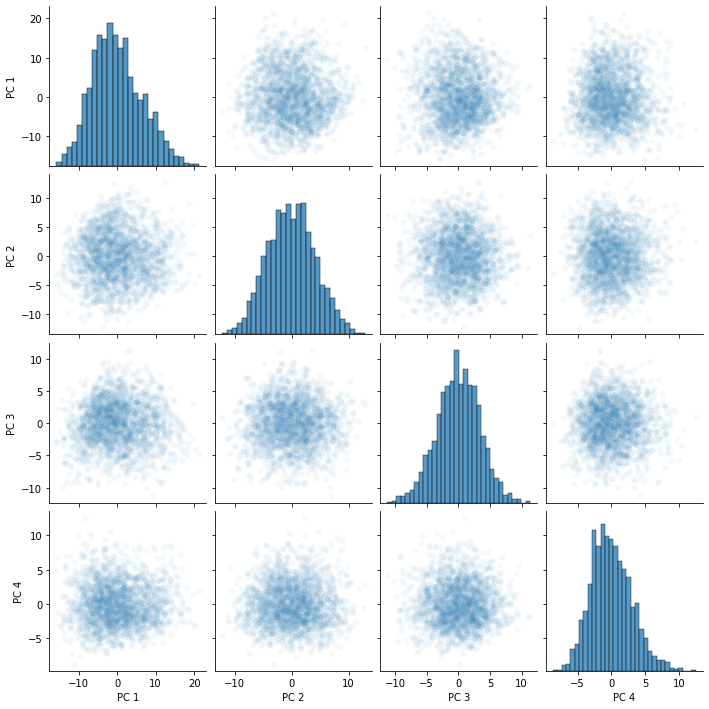

In [75]:
#Use a Pairplot to see what we have to start
plt.figure(figsize=(15,15))
sns.pairplot(pd.DataFrame(defence_pca,
                          columns = [f'PC {i}' for i in range(1,5)]),
             plot_kws={'alpha':0.05})
plt.show()

In [76]:
tsne = TSNE(n_components=2)

defence_tsne = tsne.fit_transform(defence_scaled_df)

<Figure size 1080x1080 with 0 Axes>

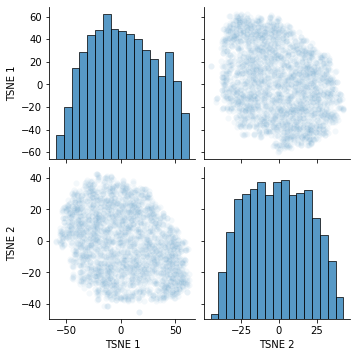

In [77]:
#Another pairplot to visualize what we see
plt.figure(figsize=(15,15))
sns.pairplot(pd.DataFrame(defence_tsne, columns = [f'TSNE {i}' for i in range(1,3)]), 
             plot_kws={'alpha':0.05})
plt.show()

Similar to the full dataset, the PC's look fairly random in the data.  TSNE does as well, but there is the hint of some different shapes that may take form.  I'll see if increasing the iterations and the complexity of the TSNE yields anything more insightful.

<Figure size 1080x1080 with 0 Axes>

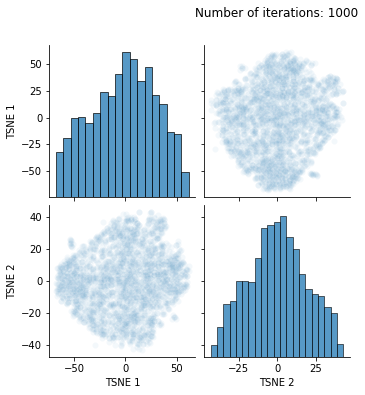

<Figure size 1080x1080 with 0 Axes>

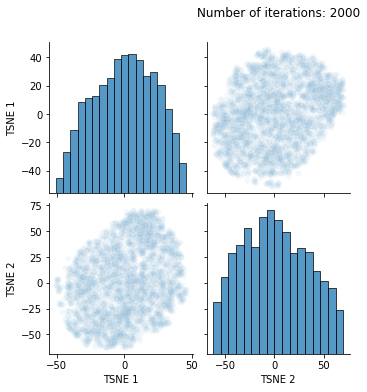

<Figure size 1080x1080 with 0 Axes>

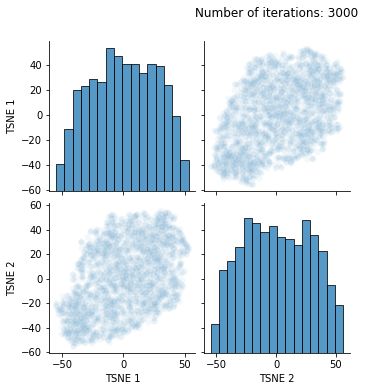

<Figure size 1080x1080 with 0 Axes>

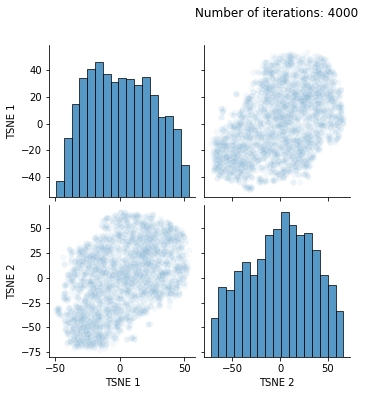

<Figure size 1080x1080 with 0 Axes>

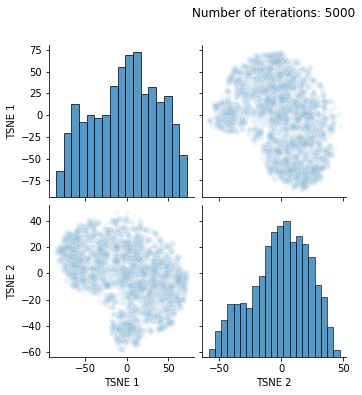

In [78]:
for num in range(1000, 5001, 1000):
    tsne = TSNE(n_components=2, 
               n_iter = num)
    
    defence_tsne = tsne.fit_transform(defence_scaled_df)

    plt.figure(figsize=(15,15))
    sns.pairplot(pd.DataFrame(defence_tsne, columns = [f'TSNE {i}' for i in range(1,3)]), plot_kws={'alpha':0.05})
    plt.title(f'Number of iterations: {num}', y = 2.2)
    plt.show()

These also all look pretty random.  5000 iterations seems to have some potential features that could be further defined more so than the models increasing the iterations.  I'll use that to increase the perplexity and see if anything more can be identified before clustering.

<Figure size 1080x1080 with 0 Axes>

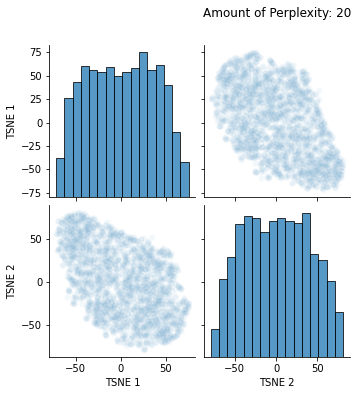

<Figure size 1080x1080 with 0 Axes>

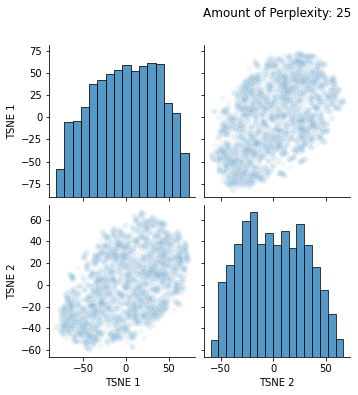

<Figure size 1080x1080 with 0 Axes>

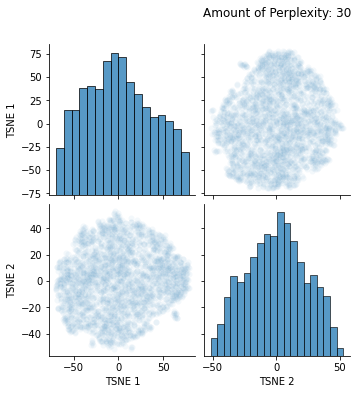

<Figure size 1080x1080 with 0 Axes>

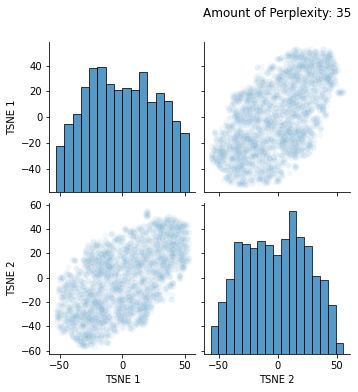

<Figure size 1080x1080 with 0 Axes>

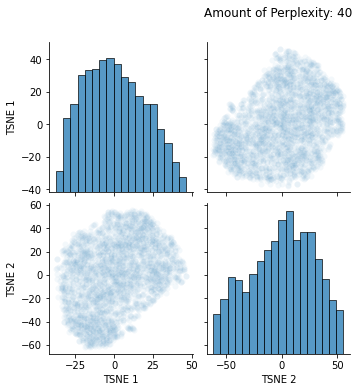

<Figure size 1080x1080 with 0 Axes>

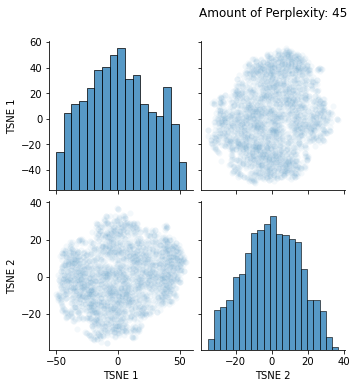

<Figure size 1080x1080 with 0 Axes>

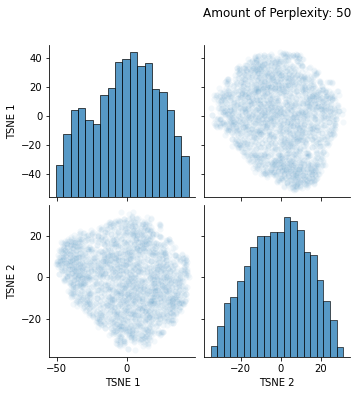

In [79]:
for num in range(20, 51, 5):
    tsne = TSNE(n_components=2, 
               n_iter = 5000,
               perplexity = num)
    
    defence_tsne = tsne.fit_transform(defence_scaled_df)

    plt.figure(figsize=(15,15))
    sns.pairplot(pd.DataFrame(defence_tsne, columns = [f'TSNE {i}' for i in range(1,3)]), plot_kws={'alpha':0.05})
    plt.title(f'Amount of Perplexity: {num}', y = 2.2)
    plt.show()

While there is no break off clusters in this data, what I see with 5000 iterations at 35 perplexity is some shapes in the data that could provide some differentiation in the data.  While there does look like there are some areas that have a higher concentration of datapoints, there is not much that separates the data as a whole for our defencemen.

Still, we'll see what we get when we try to cluster the data and evaluate what is the best way we can do so.

### Clustering Data for Defencemen

<a id = 'clusterd'></a>

In [80]:
k_values = range(2, 11)

results = pd.DataFrame()

for k in k_values:
    kmeans = KMeans(n_clusters = k)
    y_labels = kmeans.fit_predict(defence_scaled_df)

    print(f'KMeans with K = {k}')
    inertia = kmeans.inertia_
    s_score = silhouette_score(defence_scaled_df, y_labels)
    unique_values, counts = np.unique(y_labels, return_counts = True)

    results = results.append({'k':k,
                              'inertia': inertia,
                              'Silhouette Score': s_score,
                              'Counts': counts},
                             ignore_index=True)

KMeans with K = 2
KMeans with K = 3
KMeans with K = 4
KMeans with K = 5
KMeans with K = 6
KMeans with K = 7
KMeans with K = 8
KMeans with K = 9
KMeans with K = 10


In [81]:
results

,k,inertia,Silhouette Score,Counts
0,2.0,223180.173075,0.184461,"[1267, 866]"
1,3.0,204916.073666,0.121122,"[701, 641, 791]"
2,4.0,190779.074415,0.114317,"[480, 579, 585, 489]"
3,5.0,183964.348744,0.095599,"[415, 399, 422, 437, 460]"
4,6.0,177969.641470,0.083655,"[333, 415, 361, 283, 374, 367]"
5,7.0,173095.885349,0.085262,"[328, 186, 357, 341, 276, 330, 315]"
6,8.0,169109.086250,0.082381,"[261, 212, 252, 301, 282, 212, 295, 318]"
7,9.0,165429.943479,0.080007,"[151, 311, 258, 326, 266, 296, 199, 325, 1]"
8,10.0,162052.567972,0.078471,"[236, 176, 252, 298, 207, 141, 297, 225, 1, 300]"


In [82]:
results = results.set_index('k')

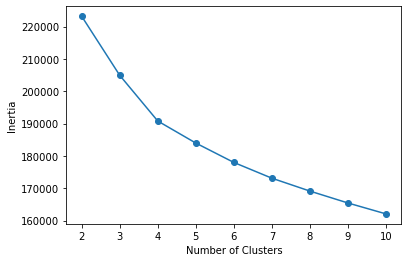

In [83]:
results['inertia'].plot(kind='line', marker = 'o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
sns.despine
plt.show()

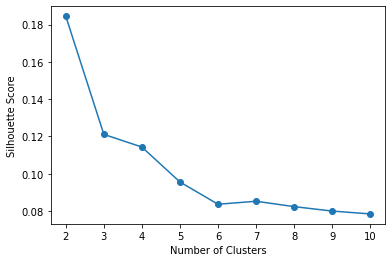

In [84]:
results['Silhouette Score'].plot(kind='line', marker = 'o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
sns.despine
plt.show()

Similar to the full dataset, the overall silhouette scores are pretty low and 2 clusters seems to be the most appropriate number.  However, there is a more distinctive drop between 4 and 5 clusters in this data, perhaps lending credence to 4 clusters being helpful in classifying our defencemen, which could potentially tell us a lot more in regards to team building.

I will separate the data on 2 and 4 clusters and visualize what we have.

In [85]:
kmeans = KMeans(n_clusters = 2)
d_clusters2 = kmeans.fit_predict(defence_scaled_df)

In [86]:
#PCA dataframe in order to graph the data
pca_df = pd.DataFrame(defence_pca, columns = [f'PC {i}' for i in range(1,5)])
pca_df['Clusters'] = d_clusters2+1

<Figure size 1080x1080 with 0 Axes>

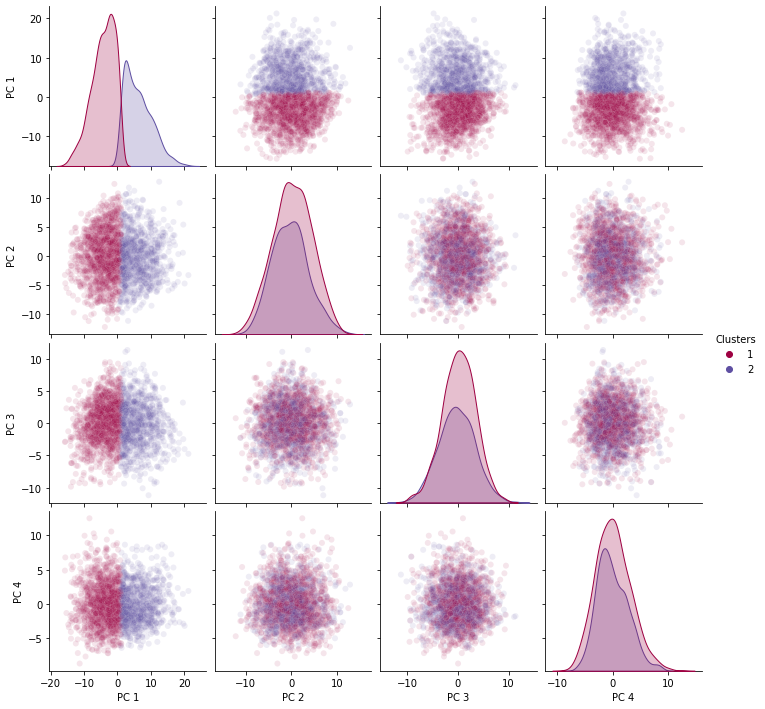

In [87]:
plt.figure(figsize=(15,15))
sns.pairplot(pca_df, 
             plot_kws={'alpha':0.1},
             hue = 'Clusters',
             palette = 'Spectral')
plt.show()

In [88]:
tsne = TSNE(n_components=2,
           perplexity = 35,
           n_iter = 5000)
    
defence_tsne = tsne.fit_transform(defence_scaled_df)

In [89]:
tsne_df = pd.DataFrame(defence_tsne, columns = [f'TSNE {i}' for i in range(1,3)])
tsne_df['Clusters'] = d_clusters2+1

<Figure size 1080x1080 with 0 Axes>

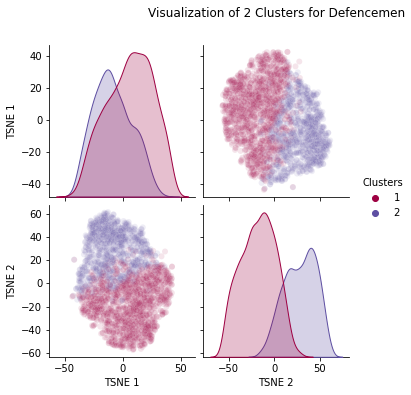

In [90]:
plt.figure(figsize=(15,15))
sns.pairplot(tsne_df,
             plot_kws={'alpha':0.1},
             hue = 'Clusters',
             palette = 'Spectral')
             
plt.title(f'Visualization of 2 Clusters for Defencemen', y = 2.2)
plt.show()

By and large, this splits the data in half between PC1 and PC2.  However, looking at TSNE, the cut is not a straight line through the data, which is interesting albeit with some overlap.

We'll try again splitting the data into 4 clusters.

In [91]:
kmeans = KMeans(n_clusters = 4)
d_clusters4 = kmeans.fit_predict(defence_scaled_df)

In [92]:
#PCA dataframe in order to graph the data
pca_df = pd.DataFrame(defence_pca, columns = [f'PC {i}' for i in range(1,5)])
pca_df['Clusters'] = d_clusters4+1

<Figure size 1080x1080 with 0 Axes>

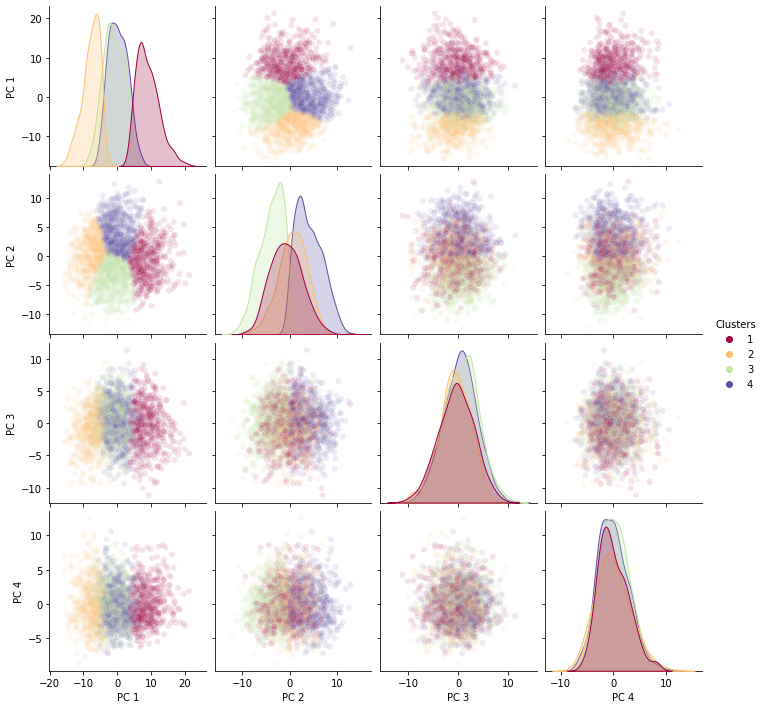

In [93]:
plt.figure(figsize=(15,15))
sns.pairplot(pca_df, 
             plot_kws={'alpha':0.1},
             hue = 'Clusters',
             palette = 'Spectral')
plt.show()

In [95]:
tsne = TSNE(n_components=2,
           perplexity = 35,
           n_iter = 5000)
    
defence_tsne = tsne.fit_transform(defence_scaled_df)

In [96]:
tsne_df = pd.DataFrame(defence_tsne, columns = [f'TSNE {i}' for i in range(1,3)])
tsne_df['Clusters'] = d_clusters4+1

<Figure size 1080x1080 with 0 Axes>

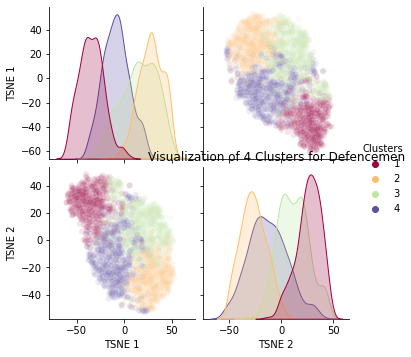

In [97]:
plt.figure(figsize=(15,15))
sns.pairplot(tsne_df,
             plot_kws={'alpha':0.1},
             hue = 'Clusters',
             palette = 'Spectral')
             
plt.title(f'Visualization of 4 Clusters for Defencemen')
plt.show()

Again, between PC1 and PC2, there does seem to be a good separation of the data, slicing it into 4 relatively equal pieces of a 'pie'.  TSNE is a bit more interesting, as it seems that Clusters 1, 2 and 3 are relatively distinct areas, whereas cluster 4 is spread across different parts of the data.  I'll add these clusters to the defence data.

In [98]:
defence_scaled_df['D_Clusters2'] = d_clusters2+1

In [99]:
defence_scaled_df['D_Clusters4'] = d_clusters4+1

In [100]:
defence_scaled_df.head()

,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%,D_Clusters2,D_Clusters4
0,1.430065,1.740519,1.501569,1.537714,1.713639,0.549330,-1.435049,1.468201,-1.488543,1.015703,-1.557134,0.764931,-1.868224,0.472049,-1.960439,1.301293,1.733090,1.456682,1.447566,1.539082,-0.217676,0.880871,0.470873,0.295439,1.697386,-0.340228,0.288254,0.659200,1.033602,0.290862,0.628216,1.065901,1.092408,1.111669,0.816262,0.611700,3.286087,-0.093501,0.577351,1.119501,1.716635,0.505791,1.045719,1.760478,1.750553,1.821704,0.973486,0.931184,0.915018,1.061883,0.902525,-0.714508,-0.015780,-0.402133,0.494398,-0.465368,-0.476382,0.751843,-0.162498,-0.168205,0.090564,-0.529328,-0.539134,0.660003,-0.203756,-0.247277,0.103117,1.350254,0.195129,1.840685,0.694681,1.622803,0.675929,1.514087,0.529651,1.279561,0.212187,1.826128,2.427468,1.986586,1.958166,2.082476,1.387438,1.539408,1.891003,-0.982965,1.070131,1.714164,0.583962,-0.289504,0.577351,1.138656,1.422458,1.907662,1.922430,1.952143,0.554717,0.964550,0.147538,-0.725135,0.288242,0.659200,0.558436,0.896723,0.628216,1.063576,1.098813,1.110615,1.357169,0.091060,0.995803,0.948748,0.900863,-1.446844,-0.075648,0.052906,1.577847,0.796278,1.363198,1.314664,1.411298,1.403078,1.403380,1.529961,0.164519,0.487524,0.848931,0.779216,1.181612,0.686002,1.281499,-0.808743,2,1
1,1.517129,1.477318,1.277147,1.337581,1.567827,1.104092,-1.134150,0.573980,-1.816340,0.399383,-1.735665,0.104426,-2.121017,0.802506,-1.491767,1.513117,1.377235,1.188850,1.198992,1.493969,1.049745,0.125897,1.512868,0.445350,-0.350093,0.347617,0.306557,-0.627079,1.183898,0.507859,-0.100098,1.114108,1.166389,1.199466,2.166926,0.756196,-0.356316,0.269443,0.479792,-0.958459,1.787557,0.792364,-0.093821,1.725767,1.750553,1.821704,1.460876,1.159874,0.762713,1.716412,1.325147,-0.624570,-0.083007,-0.016040,-0.518365,-0.086899,-0.092650,-0.342861,-0.162498,-0.168205,0.090564,0.169778,0.164213,-1.060377,-0.203756,-0.247277,0.103117,1.596587,0.300793,1.280967,0.418266,1.196375,0.466934,1.069656,0.294035,1.316743,0.338096,2.061628,1.814245,1.523648,1.527712,1.932052,1.219652,1.228707,1.852351,-0.635752,0.733707,0.755229,-0.190322,0.171188,0.479792,0.603134,0.728905,0.855220,0.874818,0.900066,0.397764,0.434898,-0.129397,0.334597,0.306545,-0.627079,0.283279,0.484037,-0.100098,0.454948,0.486699,0.501744,2.039056,-0.214810,0.441547,0.869701,1.226729,-2.225012,-0.369017,-0.033888,1.859381,0.525210,0.998753,1.205230,1.524670,1.417352,1.264132,1.746888,-0.413193,0.487524,0.739713,0.441915,1.020427,0.970841,0.378122,-1.430168,2,1
2,-0.176437,1.251988,1.275277,1.472806,0.793905,-0.560196,-0.408452,1.647565,-0.552376,1.476521,-0.793759,1.327687,-1.303602,0.534010,-0.628423,-0.148026,1.311102,1.311513,1.471124,0.772163,-1.564311,0.119096,-0.598071,-0.326415,0.379654,0.861225,-0.370647,0.173273,-0.341166,-0.116006,-0.229576,-0.370003,-0.368717,-0.371124,-0.696482,-0.363643,0.728655,0.632386,-0.495800,0.160443,-0.387370,-0.131038,-0.269135,-0.408946,-0.378994,-0.417160,3.431629,3.056963,2.677408,3.134559,-0.035839,0.769455,0.320357,1.528331,1.33102

In [157]:
defence_df = defence_df.reset_index()

In [158]:
defence_scaled_df[['Player', 'Age', 'Year','Draft Overall', 'Cap Hit', 'Defenceman', 'Team', 'Predicted_Cap_Hit', 'Prediction_Difference']] = defence_df[['Player', 'Age', 'Year','Draft Ov', 'Cap_Hit', 'Defenceman', 'Team', 'Predicted_Cap_Hit', 'Prediction_Difference']]

In [160]:
defence_scaled_df.head()

,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%,D_Clusters2,D_Clusters4,Player,Age,Year,Draft Overall,Cap Hit,Defenceman,Team,Predicted_Cap_Hit,Prediction_Difference
0,1.430065,1.740519,1.501569,1.537714,1.713639,0.549330,-1.435049,1.468201,-1.488543,1.015703,-1.557134,0.764931,-1.868224,0.472049,-1.960439,1.301293,1.733090,1.456682,1.447566,1.539082,-0.217676,0.880871,0.470873,0.295439,1.697386,-0.340228,0.288254,0.659200,1.033602,0.290862,0.628216,1.065901,1.092408,1.111669,0.816262,0.611700,3.286087,-0.093501,0.577351,1.119501,1.716635,0.505791,1.045719,1.760478,1.750553,1.821704,0.973486,0.931184,0.915018,1.061883,0.902525,-0.714508,-0.015780,-0.402133,0.494398,-0.465368,-0.476382,0.751843,-0.162498,-0.168205,0.090564,-0.529328,-0.539134,0.660003,-0.203756,-0.247277,0.103117,1.350254,0.195129,1.840685,0.694681,1.622803,0.675929,1.514087,0.529651,1.279561,0.212187,1.826128,2.427468,1.986586,1.958166,2.082476,1.387438,1.539408,1.891003,-0.982965,1.070131,1.714164,0.583962,-0.289504,0.577351,1.138656,1.422458,1.907662,1.922430,1.952143,0.554717,0.964550,0.147538,-0.725135,0.288242,0.659200,0.558436,0.896723,0.628216,1.063576,1.098813,1.110615,1.357169,0.091060,0.995803,0.948748,0.900863,-1.446844,-0.075648,0.052906,1.577847,0.796278,1.363198,1.314664,1.411298,1.403078,1.403380,1.529961,0.164519,0.487524,0.848931,0.779216,1.181612,0.686002,1.281499,-0.808743,2,1,aaron ekblad,18,2015,1.0,0.925,1,FLA,1.425904,0.500904
1,1.517129,1.477318,1.277147,1.337581,1.567827,1.104092,-1.134150,0.573980,-1.816340,0.399383,-1.735665,0.104426,-2.121017,0.802506,-1.491767,1.513117,1.377235,1.188850,1.198992,1.493969,1.049745,0.125897,1.512868,0.445350,-0.350093,0.347617,0.306557,-0.627079,1.183898,0.507859,-0.100098,1.114108,1.166389,1.199466,2.166926,0.756196,-0.356316,0.269443,0.479792,-0.958459,1.787557,0.792364,-0.093821,1.725767,1.750553,1.821704,1.460876,1.159874,0.762713,1.716412,1.325147,-0.624570,-0.083007,-0.016040,-0.518365,-0.086899,-0.092650,-0.342861,-0.162498,-0.168205,0.090564,0.169778,0.164213,-1.060377,-0.203756,-0.247277,0.103117,1.596587,0.300793,1.280967,0.418266,1.196375,0.466934,1.069656,0.294035,1.316743,0.338096,2.061628,1.814245,1.523648,1.527712,1.932052,1.219652,1.228707,1.852351,-0.635752,0.733707,0.755229,-0.190322,0.171188,0.479792,0.603134,0.728905,0.855220,0.874818,0.900066,0.397764,0.434898,-0.129397,0.334597,0.306545,-0.627079,0.283279,0.484037,-0.100098,0.454948,0.486699,0.501744,2.039056,-0.214810,0.441547,0.869701,1.226729,-2.225012,-0.369017,-0.033888,1.859381,0.525210,0.998753,1.205230,1.524670,1.417352,1.264132,1.746888,-0.413193,0.487524,0.739713,0.441915,1.020427,0.970841,0.378122,-1.430168,2,1,aaron ekblad,19,2016,1.0,0.925,1,FLA,1.306689,0.381689
2,-0.176437,1.251988,1.275277,1.472806,0.793905,-0.560196,-0.408452,1.647565,-0.552376,1.476521,-0.793759,1.327687,-1.303602,0.534010,-0.628423,-0.148026,1.311102,1.311513,1.471124,0.772163,-1.564311,0.119096,-0.598071,-0.326415,0.379654,0.861225,-0.370647,0.173273,-0.341166,-0.116006,-0.229576,-0.370003,-0.368717,-0.

With this, we will now analyze what our two defencemen clusters look like.

### Analyzing Clusters for Defencemen

In [161]:
mean_d_clusters2 = defence_scaled_df.groupby('D_Clusters2').mean()

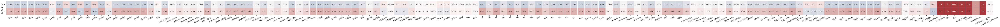

In [162]:
plt.figure(figsize=(100,20))

ax = sns.heatmap(mean_d_clusters2,
                cmap='vlag',
                 xticklabels=list(mean_d_clusters2.columns),
                 linewidths = 1,
                 annot = True,
                 vmin=-2,
                 vmax=+2,
                cbar = False)

plt.yticks(rotation=0)
plt.xticks(rotation=25)
ax.set_aspect("equal")

Similar to our initial go at this, this is not very difficult to decipher as the clusters have been separated by 'good' and 'bad' defencemen.  Cluster 1 encompasses players who are below average in our statistics, whereas Cluster 2 are the above average players.

While this is likely more accurate, I'm hopeful that dividing the defencemen into 4 clusters will be more informative to see where the divisions happen.

In [163]:
mean_d_clusters4 = defence_scaled_df.groupby('D_Clusters4').mean()

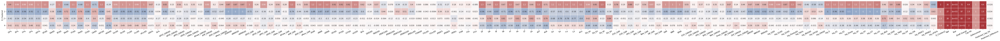

In [164]:
plt.figure(figsize=(100,20))

ax = sns.heatmap(mean_d_clusters4,
                cmap='vlag',
                 xticklabels=list(mean_d_clusters4.columns),
                 linewidths = 1,
                 annot = True,
                 vmin=-2,
                 vmax=2,
                cbar = False)

plt.yticks(rotation=0)
plt.xticks(rotation=25)
ax.set_aspect("equal")

Here we can see some interesting distinctions within the defencemen.

Cluster #1: Star Defencemen.  These are the best defencemen, especially offensively as the offensive statistics are higher values than the defensive metrics which are mostly around average).  It bares noting that the performance level in this cluster is higher than the 'good' cluster in the previous iteration, perhaps creating a better separation between the elite and the rest of the defencemen.

Cluster #4: Offensive Producer, limited ice-time.  This cluster has very limited ice-time but is the second highest offensive performing group across all clusters (only behind cluster #1).  All of the rating statistics perform better than the counting statistics, suggesting these are players that play well in limited time and are potentially on the path to have bigger roles as defencemen, or are potential defensive liabilities relative to their offensive ability.

Cluster #3: 'Stay-At-Home' Defencemen.  This cluster has the highest amount of time on-ice, particularly short-handed, and have the best defensive metrics (Def_GAR, EVD_GAR).  The ratings for offensive production is low, but the counting statistics are higher, suggesting that these players play a more defensive role and accumulate stats more due to the fact that they are on the ice a lot.  These are also the highest hitting group, for and against.

Cluster #2: Fringe NHL Defencemen.  These are the worst defencemen, but especially on offense.  Here as well the performance level of this cluster is worse that the 'bad' cluster in the previous iteration.  It would seem that the middle range between the two clusters was used to split into additional clusters.

These clusters provide much more informative detail than the first clustering did on the overall dataset.  Considering that the silhouette score was low for both, but equal for 4 clusters on each try, the position specific clustering is a bit more informative and we can see some differentiation in ability and play style.  Therefore, I will do the same for the forwards and see what we get again.

### Scaling and Visualizing Clusters for Forwards

<a id = 'visualf'></a>

In [165]:
forward_df.head()

,Player,Team,Birthday,Age,Draft Ov,GP,TOI,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,Year,Cap_Hit,ID,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%,Left_Handed,Defenceman,Predicted_Cap_Hit,Prediction_Difference
8,aaron palushaj,COL,1989-09-07,23,44.0,25,282.88,46.60,50.36,49.30,48.95,52.21,2.78,3.18,32.81,32.34,42.16,43.36,54.77,57.12,2.45,2.25,-0.41,0.46,-1.20,-2.35,0.21,8.46,90.16,0.514,-0.141,-0.734,-0.026,-0.007,0.215,0.431,-0.141,0.208,0.506,0.094,0.174,2.3,-0.6,-0.2,0.0,0.0,1.0,2.0,-0.6,1.0,2.4,0.4,0.8,6.15,7.85,10.39,0.40,6.90,1.06,1.70,0.85,1.91,0.00,0.00,1.06,0.42,1.27,-0.85,0,0,5,2,6,-4,13.09,15.00,154.68,152.49,198.76,204.44,258.20,269.29,11.57,10.59,-1.91,2.19,-5.68,-11.09,0.98,282.9,263.1,18.6,0.0,3.1,0.3,0.0,0.0,0.0,3.1,0.3,4.3,0.8,1.5,0.696,0.067,0.045,-0.725,-0.007,0.215,0.653,0.066,0.208,0.920,0.171,0.317,2013,0.600,aaron palushaj-23-2013,0.350657,0.494696,0.615186,1.068153,1.857859,1.324419,2.052841,2.079442,1.098612,1.386294,1.609438,2.302585,3.401197,3.637586,3.912023,1.064711,2.639057,1.791759,2.197225,3.496508,3.526361,1.609438,2.302585,1.136296,0,0,0.863599,0.263599
11,aaron volpatti,VAN/WSH,1985-05-30,27,293.0,33,275.13,41.32,45.85,48.68,46.13,47.88,1.09,1.55,23.17,27.36,34.11,35.95,43.61,50.92,1.74,1.90,-0.46,-4.19,-1.84,-7.31,-0.15,4.71,94.34,-0.256,0.353,-0.096,-0.026,-0.041,-0.022,-0.254,0.353,-0.063,0.032,0.006,0.011,-1.2,1.6,0.0,0.0,-0.2,-0.1,-1.2,1.6,-0.3,0.1,0.0,0.0,4.58,6.98,9.16,0.42,4.76,1.09,0.87,1.09,0.65,1.09,1.09,-0.44,0.22,0.65,-0.44,5,5,-2,1,3,-2,5.00,7.10,106.23,125.45,156.40,164.85,199.96,233.50,8.00,8.71,-2.10,-19.22,-8.45,-33.54,-0.71,275.1,271.1,3.8,0.1,-1.5,0.8,0.0,0.0,-0.2,-1.5,0.8,-1.0,-0.2,-0.3,-0.330,0.181,0.072,-0.596,-0.041,-0.022,-0.325,0.181,-0.063,-0.208,-0.039,-0.072,2013,0.600,aaron volpatti-27-2013,0.198851,0.198851,0.000000,0.364643,1.415853,1.156881,2.915064,2.613740,0.693147,0.693147,0.000000,1.098612,3.091042,3.496508,3.761200,1.068153,2.397895,1.791759,1.609438,4.394449,4.077537,1.791759,1.386294,0.306296,1,0,0.674063,0.074063
12,aaron volpatti,WSH,1985-05-30,28,293.0,41,301.87,37.01,39.99,40.29,40.40,40.31,0.81,1.38,20.14,30.22,27.87,41.31,39.27,57.93,1.44,2.12,-0.57,-10.08,-13.44,-18.66,-0.69,4.04,95.42,-0.424,-0.306,0.000,0.000,-0.061,-0.057,-0.424,-0.306,-0.118,-0.842,-0.159,-0.298,-2.1,-1.5,0.0,0.0,-0.3,-0.3,-2.1,-1.5,-0.6,-4.2,-0.8,-1.5,3.58,5.37,7.75,0.40,11.11,0.20,1.19,1.39,0.40,0.99,0.99,-0.99,0.80,1.59,-0.80,5,5,-5,4,8,-4,4.09,6.96,101.32,152.03,140.24,207.84,197.58,291.44,7.22,10.69,-2.87,-50.71,-67.60,-93.86,-3.47,301.9,299.5,0.8,0.2,-2.9,-0.5,0.0,0.0,-0.3,-2.9,-0.5,-3.9,-0.7,-1.4,-0.575,-0.093,0.615,-0.417,-0.061,-0.057,-0.572,-0.093,-0.118,-0.779,-0.148,-0.276,2014,0.575,aaron volpatti-28-2014,0.336472,0.000000,0.000000,0.336472,2.129421,1.095273,2.791165,2.479056,1.098612,0.000000,0.000000,1.098612,2.944439,3.332205,3.688879,1.105257,2.397895,0.693147,1.945910,4.356709,4.025352,2.079442,1.098612,1.203704,1,0,0.964936,0.389936
16,adam burish,S.J,1983-01-06,29,282.0,46,486.20,21.01,38.58,39.72,39.56,38.50,0.62,2.32,20.75,33.03,31.44,47.72,44.01,67.23,1.

In [115]:
#Dropping the same columns as we did previously
forward_df2 = forward_df.drop(columns = ['Player', 'Team', 'Birthday', 'ID', 'Cap_Hit', 'Year',
                                         'Left_Handed', 'GP', 'TOI', 'Age', 'Draft Ov', 'Cap_Hit',
                                         'Defenceman', 'Predicted_Cap_Hit', 'Prediction_Difference'])

In [116]:
forward_df2.head()

,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%
8,46.60,50.36,49.30,48.95,52.21,2.78,3.18,32.81,32.34,42.16,43.36,54.77,57.12,2.45,2.25,-0.41,0.46,-1.20,-2.35,0.21,8.46,90.16,0.514,-0.141,-0.734,-0.026,-0.007,0.215,0.431,-0.141,0.208,0.506,0.094,0.174,2.3,-0.6,-0.2,0.0,0.0,1.0,2.0,-0.6,1.0,2.4,0.4,0.8,6.15,7.85,10.39,0.40,6.90,1.06,1.70,0.85,1.91,0.00,0.00,1.06,0.42,1.27,-0.85,0,0,5,2,6,-4,13.09,15.00,154.68,152.49,198.76,204.44,258.20,269.29,11.57,10.59,-1.91,2.19,-5.68,-11.09,0.98,282.9,263.1,18.6,0.0,3.1,0.3,0.0,0.0,0.0,3.1,0.3,4.3,0.8,1.5,0.696,0.067,0.045,-0.725,-0.007,0.215,0.653,0.066,0.208,0.920,0.171,0.317,0.350657,0.494696,0.615186,1.068153,1.857859,1.324419,2.052841,2.079442,1.098612,1.386294,1.609438,2.302585,3.401197,3.637586,3.912023,1.064711,2.639057,1.791759,2.197225,3.496508,3.526361,1.609438,2.302585,1.136296
11,41.32,45.85,48.68,46.13,47.88,1.09,1.55,23.17,27.36,34.11,35.95,43.61,50.92,1.74,1.90,-0.46,-4.19,-1.84,-7.31,-0.15,4.71,94.34,-0.256,0.353,-0.096,-0.026,-0.041,-0.022,-0.254,0.353,-0.063,0.032,0.006,0.011,-1.2,1.6,0.0,0.0,-0.2,-0.1,-1.2,1.6,-0.3,0.1,0.0,0.0,4.58,6.98,9.16,0.42,4.76,1.09,0.87,1.09,0.65,1.09,1.09,-0.44,0.22,0.65,-0.44,5,5,-2,1,3,-2,5.00,7.10,106.23,125.45,156.40,164.85,199.96,233.50,8.00,8.71,-2.10,-19.22,-8.45,-33.54,-0.71,275.1,271.1,3.8,0.1,-1.5,0.8,0.0,0.0,-0.2,-1.5,0.8,-1.0,-0.2,-0.3,-0.330,0.181,0.072,-0.596,-0.041,-0.022,-0.325,0.181,-0.063,-0.208,-0.039,-0.072,0.198851,0.198851,0.000000,0.364643,1.415853,1.156881,2.915064,2.613740,0.693147,0.693147,0.000000,1.098612,3.091042,3.496508,3.761200,1.068153,2.397895,1.791759,1.609438,4.394449,4.077537,1.791759,1.386294,0.306296
12,37.01,39.99,40.29,40.40,40.31,0.81,1.38,20.14,30.22,27.87,41.31,39.27,57.93,1.44,2.12,-0.57,-10.08,-13.44,-18.66,-0.69,4.04,95.42,-0.424,-0.306,0.000,0.000,-0.061,-0.057,-0.424,-0.306,-0.118,-0.842,-0.159,-0.298,-2.1,-1.5,0.0,0.0,-0.3,-0.3,-2.1,-1.5,-0.6,-4.2,-0.8,-1.5,3.58,5.37,7.75,0.40,11.11,0.20,1.19,1.39,0.40,0.99,0.99,-0.99,0.80,1.59,-0.80,5,5,-5,4,8,-4,4.09,6.96,101.32,152.03,140.24,207.84,197.58,291.44,7.22,10.69,-2.87,-50.71,-67.60,-93.86,-3.47,301.9,299.5,0.8,0.2,-2.9,-0.5,0.0,0.0,-0.3,-2.9,-0.5,-3.9,-0.7,-1.4,-0.575,-0.093,0.615,-0.417,-0.061,-0.057,-0.572,-0.093,-0.118,-0.779,-0.148,-0.276,0.336472,0.000000,0.000000,0.336472,2.129421,1.095273,2.791165,2.479056,1.098612,0.000000,0.000000,1.098612,2.944439,3.332205,3.688879,1.105257,2.397895,0.693147,1.945910,4.356709,4.025352,2.079442,1.098612,1.203704
16,21.01,38.58,39.72,39.56,38.50,0.62,2.32,20.75,33.03,31.44,47.72,44.01,67.23,1.70,2.72,-1.70,-12.28,-16.28,-23.22,-1.02,2.97,92.98,-0.572,-0.267,0.008,-0.273,-0.045,0.283,-0.568,-0.268,0.238,-0.524,-0.097,-0.180,-4.0,-1.9,0.0,-0.3,-0.4,2.3,-4.0,-2.1,1.9,-4.2,-0.8,-1.5,4.81,7.03,9.13,0.45,2.56,1.23,0.49,1.23,2.22,0.12,0.12,0.99,15.06,13.08,1.97,1,1,8,122,106,16,5.00,18.80,168.13,267.63,254.78,386.72,356.60,544.76,13.81,22.06,-13.80,-99.50,-131.94,-188.16,-8.25,486.2,422.6,2.7,58.7,-3.7,-1.0,0.0,0.1,-0.4,-3.7,-1.0,-2.8,-0.5,-1.0,-0.527,-0.149,-0.478,0.053,-0.

In [117]:
ss = StandardScaler()
forward_scaled = ss.fit_transform(forward_df2)
forward_scaled_df = pd.DataFrame(data = forward_scaled, columns = forward_df2.columns)

In [118]:
forward_scaled_df.head()

,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%
0,-0.328602,-0.091243,-0.258716,-0.304350,0.162739,0.017490,0.907268,0.423126,0.886333,-0.023368,0.621080,-0.187236,0.471215,-0.443458,-0.850732,-0.462035,-0.120006,-0.294352,-0.333577,0.061652,-0.177259,-0.474305,0.959353,-0.776013,-1.318235,-0.156520,-0.475532,3.315078,0.669865,-0.751254,2.163041,0.754711,0.751588,0.719339,-0.163095,-0.254095,-0.534637,0.028841,-0.452715,0.991276,-0.328772,-0.225856,0.435062,-0.287118,-0.328712,-0.310020,-0.483828,-0.689811,-0.535381,-1.507425,-0.865010,-0.675626,0.103829,0.255694,2.638739,-0.338352,-0.339449,2.135836,-0.788391,-0.770147,-0.281432,-0.462405,-0.466547,0.524625,-0.696917,-0.730759,-0.095601,-1.124309,-1.343845,-1.370715,-1.620347,-1.414369,-1.647637,-1.430945,-1.671862,-1.309940,-1.639235,-0.348308,-0.293254,-0.343259,-0.353084,-0.235797,-1.725427,-1.775189,-0.914223,-0.932100,0.053198,0.159249,-0.4465,0.019102,-0.452752,-0.099313,0.154207,0.052431,0.048447,0.038745,1.565362,0.369464,-0.183779,-0.843162,-0.475532,3.315053,1.395298,0.372152,2.163033,1.950354,1.944588,1.888980,-0.913221,0.211007,1.668732,0.305834,-0.522161,1.041662,0.625670,1.147064,-1.659691,-0.967870,-0.264962,-1.129131,-1.918799,-2.041605,-1.956057,-2.308443,-0.983770,-1.758600,-1.406177,-0.746441,-1.256238,-1.109050,-0.194289,-0.520094
1,-0.814239,-0.797956,-0.354011,-0.721681,-0.385587,-1.701461,-1.810690,-1.412802,-0.525326,-1.140071,-0.914580,-1.349017,-0.445688,-1.437997,-1.680107,-0.505057,-0.729891,-0.353867,-0.665487,-0.359855,-1.894781,1.945503,-1.402635,1.915344,-0.443798,-0.156520,-1.024397,-0.407346,-1.425653,1.907408,-1.064510,-0.524933,-0.525472,-0.528762,-0.948312,0.725156,-0.419719,0.028841,-0.678369,-0.171423,-0.927669,0.679599,-0.618372,-0.660209,-0.674423,-0.673970,-1.283058,-1.019126,-0.894409,-1.424315,-1.371507,-0.630658,-1.243181,0.803486,-0.419739,3.406777,3.451784,-1.147001,-0.806423,-0.829902,-0.128337,1.884598,1.917446,-0.553564,-0.701531,-0.745727,-0.053587,-1.409085,-1.762185,-1.575569,-1.772505,-1.543467,-1.809124,-1.563768,-1.782320,-1.452673,-1.743989,-0.358393,-0.466521,-0.359066,-0.445546,-0.354931,-1.746893,-1.745772,-1.094773,-0.930282,-1.028793,0.387552,-0.4465,0.019102,-0.678411,-1.014249,0.365627,-0.865768,-0.875143,-0.834729,-1.606523,0.999574,-0.156118,-0.672870,-1.024397,-0.407343,-1.636608,0.998358,-1.064510,-1.177629,-1.181915,-1.167549,-1.642465,-1.272717,-1.986890,-2.289581,-1.521477,0.466487,2.035449,2.794751,-2.198482,-1.862631,-2.376140,-2.710301,-2.432936,-2.276130,-2.205103,-2.302578,-1.401133,-1.758600,-2.320349,0.476932,-0.118201,-0.811549,-1.697221,-1.196205
2,-1.210658,-1.716212,-1.643558,-1.569661,-1.344209,-1.986258,-2.094158,-1.989863,0.285385,-2.005689,0.196235,-1.800820,0.591005,-1.858225,-1.158785,-0.599704,-1.502413,-1.432582,-1.424997,-0.992117,-2.201645,2.570717,-1.917977,-1.674948,-0.312221,-0.120887,-1.347258,-0.957072,-1.945709,-1.639269,-1.719548,-2.884447,-2.919960,-2.894795,-1.150225,-0.654697,-0.419719,0.028841,-0.791196,-0.382823,-1.096109,-0.596270,-0

In [119]:
#We'll have a look at the first 4 PC's and get a sense of the data
pca = PCA(n_components=4)

forward_pca = pca.fit_transform(forward_scaled_df)

<Figure size 1080x1080 with 0 Axes>

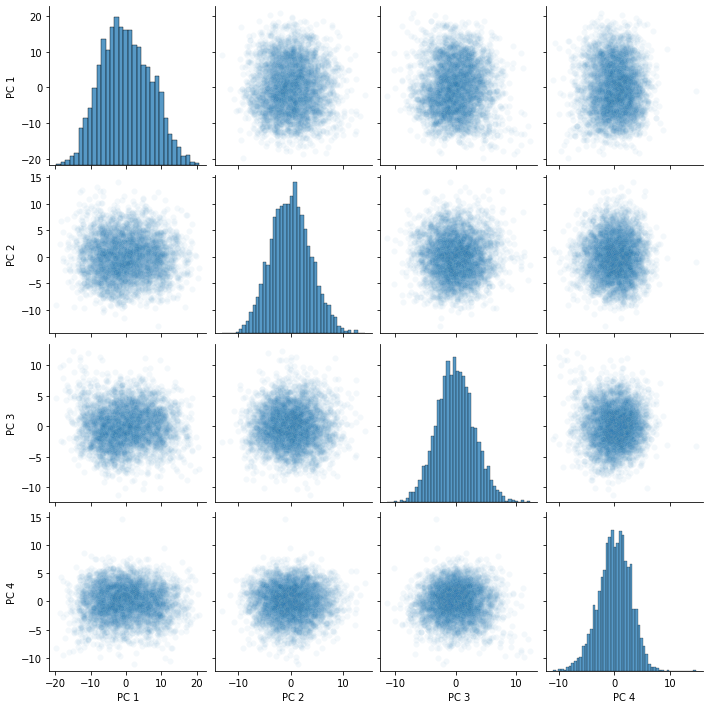

In [120]:
#Use a Pairplot to see what we have to start
plt.figure(figsize=(15,15))
sns.pairplot(pd.DataFrame(forward_pca,
                          columns = [f'PC {i}' for i in range(1,5)]),
             plot_kws={'alpha':0.05})
plt.show()

In [121]:
tsne = TSNE(n_components=2)

forward_tsne = tsne.fit_transform(forward_scaled_df)

<Figure size 1080x1080 with 0 Axes>

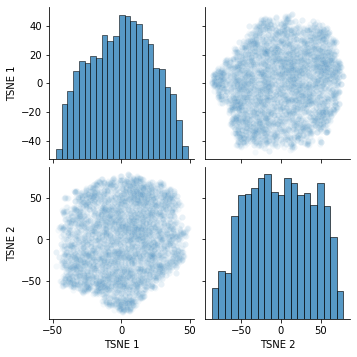

In [122]:
#Another pairplot to visualize what we see
plt.figure(figsize=(15,15))
sns.pairplot(pd.DataFrame(forward_tsne, columns = [f'TSNE {i}' for i in range(1,3)]), 
             plot_kws={'alpha':0.05})
plt.show()

The PC's look fairly random in the data.  TSNE does as well, but there is a small pinch in the data that perhaps may lead to more defined separation.  I'll if increasing the iterations and the complexity of the TSNE yields anything more insightful.

<Figure size 1080x1080 with 0 Axes>

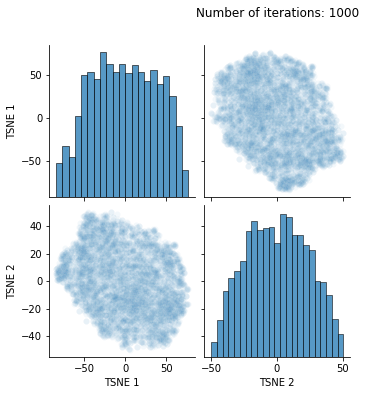

<Figure size 1080x1080 with 0 Axes>

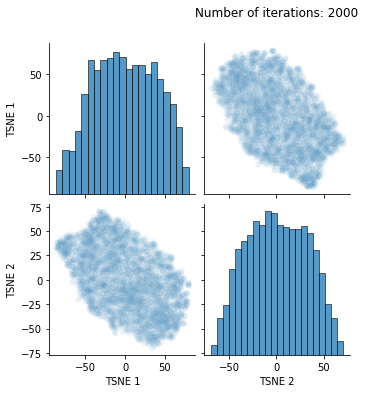

<Figure size 1080x1080 with 0 Axes>

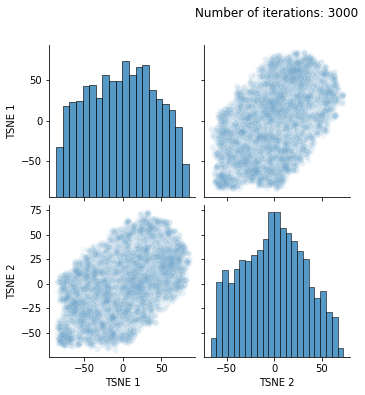

<Figure size 1080x1080 with 0 Axes>

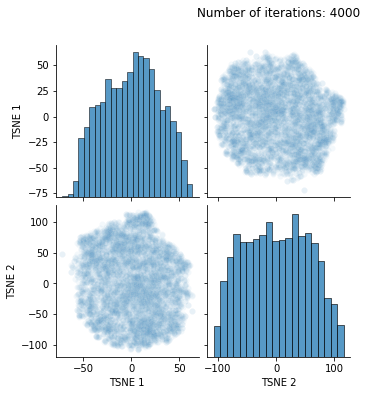

<Figure size 1080x1080 with 0 Axes>

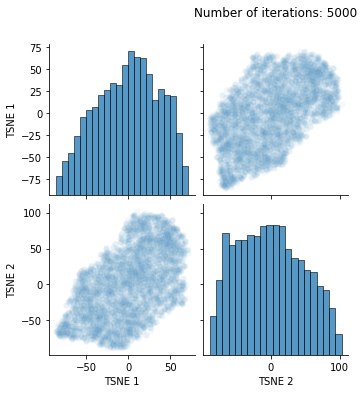

In [123]:
for num in range(1000, 5001, 1000):
    tsne = TSNE(n_components=2, 
               n_iter = num)
    
    forward_tsne = tsne.fit_transform(forward_scaled_df)

    plt.figure(figsize=(15,15))
    sns.pairplot(pd.DataFrame(forward_tsne, columns = [f'TSNE {i}' for i in range(1,3)]), plot_kws={'alpha':0.05})
    plt.title(f'Number of iterations: {num}', y = 2.2)
    plt.show()

These also all look pretty random, although the edges of the data get more defined in the TNSE, making the data look almost pencil shaped, which is interesting but may not be helpful in clustering the data together.  In the end there's not much difference in the number of iterations, but the edges of the data are mosts distinct at 5000 iterations so I'll increase the perplexity and see if anything more can be identified before clustering.

<Figure size 1080x1080 with 0 Axes>

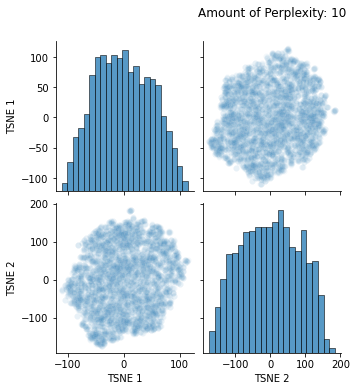

<Figure size 1080x1080 with 0 Axes>

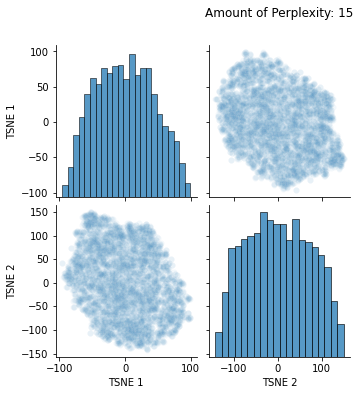

<Figure size 1080x1080 with 0 Axes>

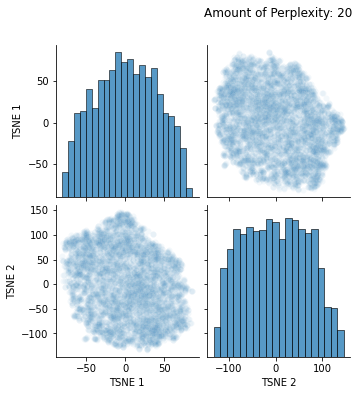

<Figure size 1080x1080 with 0 Axes>

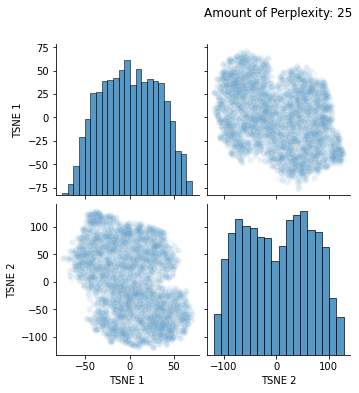

<Figure size 1080x1080 with 0 Axes>

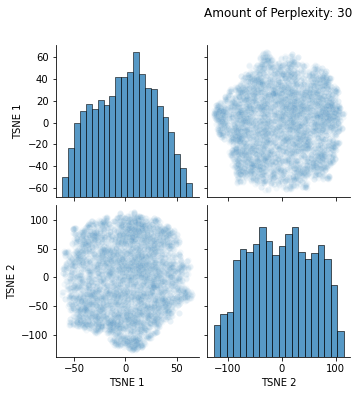

<Figure size 1080x1080 with 0 Axes>

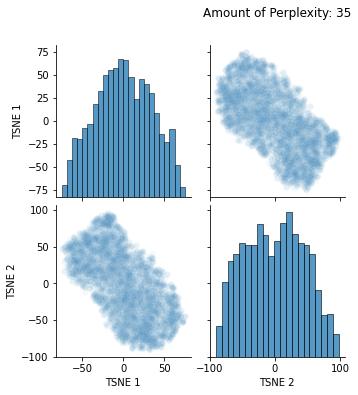

<Figure size 1080x1080 with 0 Axes>

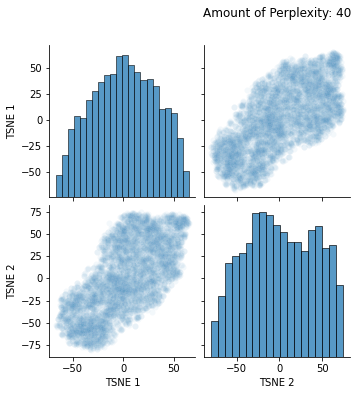

<Figure size 1080x1080 with 0 Axes>

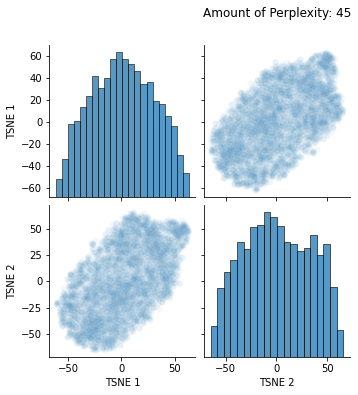

<Figure size 1080x1080 with 0 Axes>

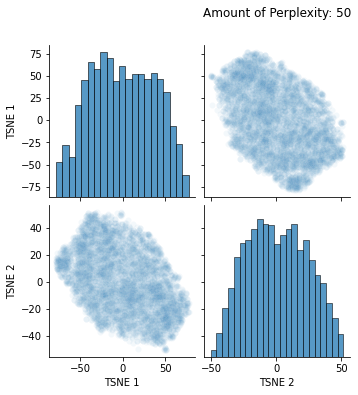

In [124]:
for num in range(10, 51, 5):
    tsne = TSNE(n_components=2, 
               n_iter = 5000,
               perplexity = num)
    
    forward_tsne = tsne.fit_transform(forward_scaled_df)

    plt.figure(figsize=(15,15))
    sns.pairplot(pd.DataFrame(forward_tsne, columns = [f'TSNE {i}' for i in range(1,3)]), plot_kws={'alpha':0.05})
    plt.title(f'Amount of Perplexity: {num}', y = 2.2)
    plt.show()

Unfortunately not much insight can be gained from these.  While there does look like there are some areas that have a higher concentration of datapoints and shapes to the data (Perplexity = 25 seems to almost pinch the data into two), there is not much that separates the data as a whole for our forwards.

Still, we'll see what we get when we try to cluster the data and evaluate what is the best way we can do so.

### Clustering Data for Forwards

<a id = 'clusterf'></a>

In [125]:
k_values = range(2, 11)

results = pd.DataFrame()

for k in k_values:
    kmeans = KMeans(n_clusters = k)
    y_labels = kmeans.fit_predict(forward_scaled_df)

    print(f'KMeans with K = {k}')
    inertia = kmeans.inertia_
    s_score = silhouette_score(forward_scaled_df, y_labels)
    unique_values, counts = np.unique(y_labels, return_counts = True)

    results = results.append({'k':k,
                              'inertia': inertia,
                              'Silhouette Score': s_score,
                              'Counts': counts},
                             ignore_index=True)

KMeans with K = 2
KMeans with K = 3
KMeans with K = 4
KMeans with K = 5
KMeans with K = 6
KMeans with K = 7
KMeans with K = 8
KMeans with K = 9
KMeans with K = 10


In [126]:
results

,k,inertia,Silhouette Score,Counts
0,2.0,404711.260532,0.209402,"[2234, 1859]"
1,3.0,369634.003493,0.123826,"[1226, 1763, 1104]"
2,4.0,348358.312746,0.110119,"[981, 1063, 1034, 1015]"
3,5.0,332821.083000,0.097965,"[856, 743, 629, 894, 971]"
4,6.0,322544.173607,0.096430,"[648, 991, 826, 174, 792, 662]"
5,7.0,312831.672040,0.085913,"[591, 650, 600, 717, 187, 668, 680]"
6,8.0,305553.154580,0.082585,"[546, 444, 183, 639, 553, 662, 574, 492]"
7,9.0,298818.888407,0.076946,"[545, 504, 528, 370, 165, 444, 521, 462, 554]"
8,10.0,293529.569108,0.071336,"[480, 475, 462, 435, 491, 478, 338, 158, 444, ..."


In [127]:
results = results.set_index('k')

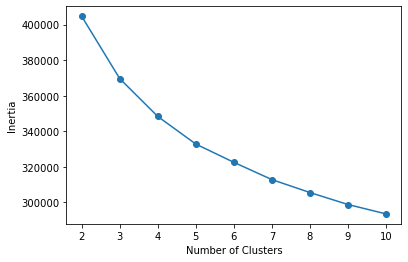

In [128]:
results['inertia'].plot(kind='line', marker = 'o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
sns.despine
plt.show()

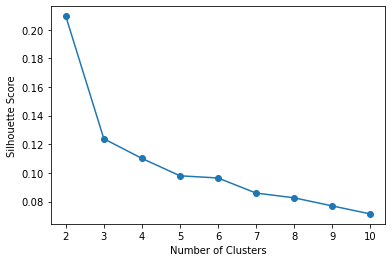

In [129]:
results['Silhouette Score'].plot(kind='line', marker = 'o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
sns.despine
plt.show()

Once again, 2 clusters seems to be the most appropriate number.  If we don't use 2 clusters, the number is not quite as clear as it was with the defencemen however.  There seems to be a big drop in inertia relative to the drop in silouette score from 3 to 4 clusters.  Also, there is a flattening of the silhouette score from 5 to 6.  I would like to explore each of 2, 4, and 6 clusters and see what we can interpret in the data.

First we'll go with 2 clusters.

In [130]:
kmeans = KMeans(n_clusters = 2)
f_clusters2 = kmeans.fit_predict(forward_scaled_df)

In [131]:
#PCA dataframe in order to graph the data
pca_df = pd.DataFrame(forward_pca, columns = [f'PC {i}' for i in range(1,5)])
pca_df['Clusters'] = f_clusters2+1

<Figure size 1080x1080 with 0 Axes>

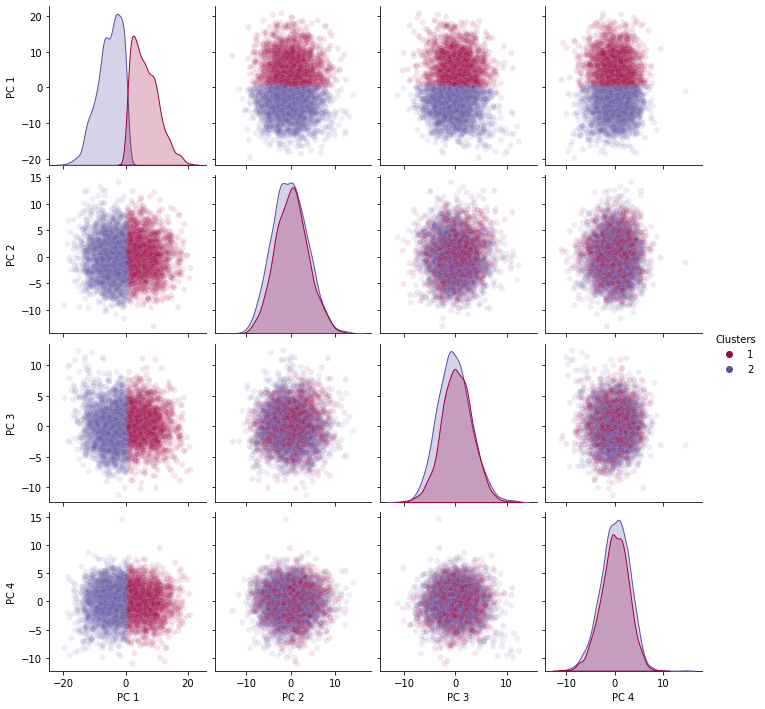

In [132]:
plt.figure(figsize=(15,15))
sns.pairplot(pca_df, 
             plot_kws={'alpha':0.1},
             hue = 'Clusters',
             palette = 'Spectral')
plt.show()

In [133]:
tsne = TSNE(n_components=2,
           n_iter = 5000,
           perplexity = 25)  #This gave us the most distinctive shape in the data, if not actual clusters.
    
forward_tsne = tsne.fit_transform(forward_scaled_df)

In [134]:
tsne_df = pd.DataFrame(forward_tsne, columns = [f'TSNE {i}' for i in range(1,3)])
tsne_df['Clusters'] = f_clusters2+1

<Figure size 1080x1080 with 0 Axes>

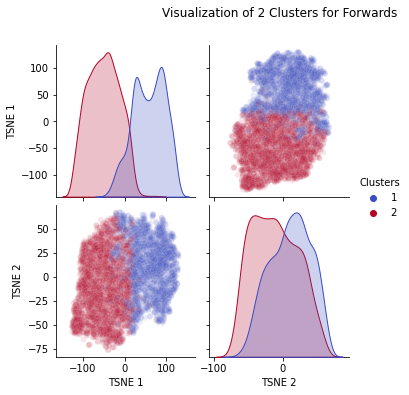

In [139]:
plt.figure(figsize=(15,15))
sns.pairplot(tsne_df,
             plot_kws={'alpha':0.1},
             hue = 'Clusters',
             palette = 'coolwarm')
             
plt.title(f'Visualization of 2 Clusters for Forwards', y = 2.2)
plt.show()

By and large, this splits the data in half between PC1 and PC2.  With some overlap in the 'mid-line' of the data.

We'll try again splitting the data into 4 clusters.

In [136]:
kmeans = KMeans(n_clusters = 4)
f_clusters4 = kmeans.fit_predict(forward_scaled_df)

In [137]:
#PCA dataframe in order to graph the data
pca_df = pd.DataFrame(forward_pca, columns = [f'PC {i}' for i in range(1,5)])
pca_df['Clusters'] = f_clusters4+1

<Figure size 1080x1080 with 0 Axes>

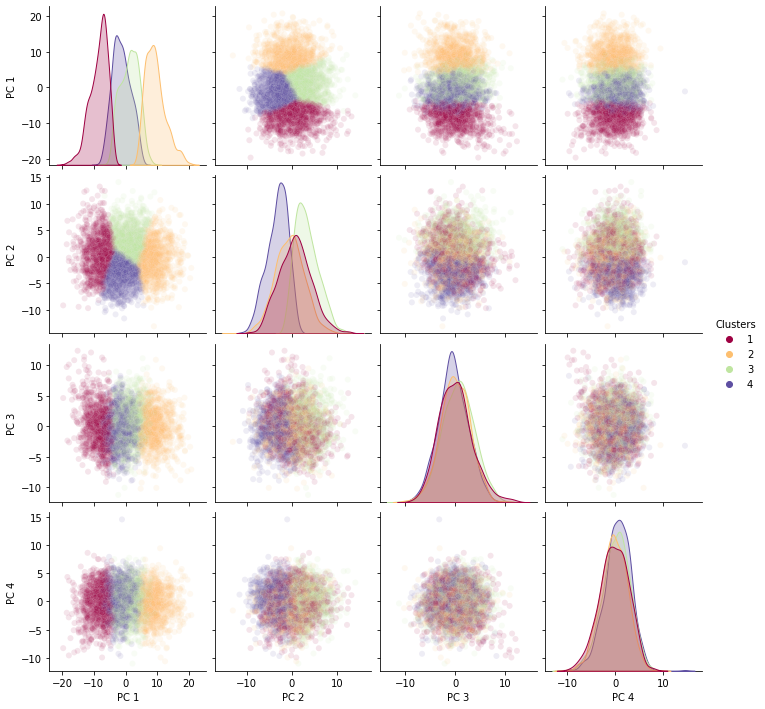

In [138]:
plt.figure(figsize=(15,15))
sns.pairplot(pca_df, 
             plot_kws={'alpha':0.1},
             hue = 'Clusters',
             palette = 'Spectral')
plt.show()

In [140]:
tsne = TSNE(n_components=2,
           n_iter = 5000,
           perplexity = 25)  #This gave us the most distinctive shape in the data, if not actual clusters.
    
forward_tsne = tsne.fit_transform(forward_scaled_df)

In [141]:
tsne_df = pd.DataFrame(forward_tsne, columns = [f'TSNE {i}' for i in range(1,3)])
tsne_df['Clusters'] = f_clusters4+1

<Figure size 1080x1080 with 0 Axes>

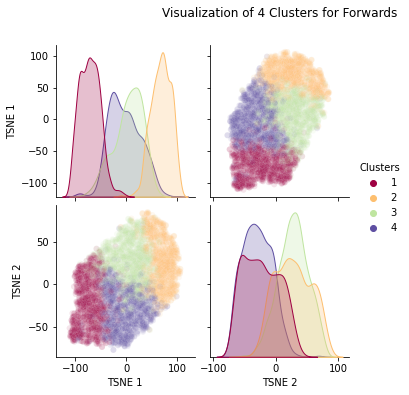

In [142]:
plt.figure(figsize=(15,15))
sns.pairplot(tsne_df,
             plot_kws={'alpha':0.1},
             hue = 'Clusters',
             palette = 'Spectral')
             
plt.title(f'Visualization of 4 Clusters for Forwards', y = 2.2)
plt.show()

Again, between PC1 and PC2, there does seem to be a good separation of the data especially between clusters 1 and 2.  Cluster 4 is a bit more spread out overlapping with 1 and 3.  The TSNE plotting does show 4 relatively distinct slices of the data.

I'm going to try one more time and experiment with splitting this data into 6 clusters.

In [143]:
kmeans = KMeans(n_clusters = 6)
f_clusters6 = kmeans.fit_predict(forward_scaled_df)

In [144]:
#PCA dataframe in order to graph the data
pca_df = pd.DataFrame(forward_pca, columns = [f'PC {i}' for i in range(1,5)])
pca_df['Clusters'] = f_clusters6+1

<Figure size 1080x1080 with 0 Axes>

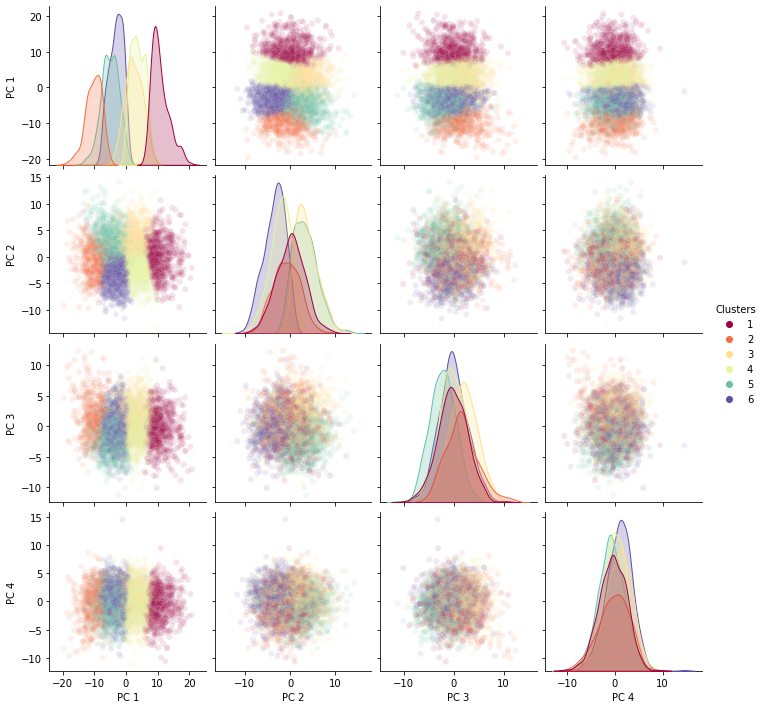

In [145]:
plt.figure(figsize=(15,15))
sns.pairplot(pca_df, 
             plot_kws={'alpha':0.1},
             hue = 'Clusters',
             palette = 'Spectral')
plt.show()

In [146]:
tsne = TSNE(n_components=2,
           n_iter = 5000,
           perplexity = 25)  #This gave us the most distinctive shape in the data, if not actual clusters.
    
forward_tsne = tsne.fit_transform(forward_scaled_df)

In [147]:
tsne_df = pd.DataFrame(forward_tsne, columns = [f'TSNE {i}' for i in range(1,3)])
tsne_df['Clusters'] = f_clusters6+1

<Figure size 1080x1080 with 0 Axes>

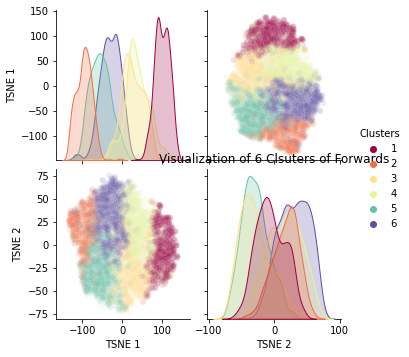

In [148]:
plt.figure(figsize=(15,15))
sns.pairplot(tsne_df,
             plot_kws={'alpha':0.1},
             hue = 'Clusters',
             palette = 'Spectral')
             
plt.title(f'Visualization of 6 Clsuters of Forwards')
plt.show()

Here, looking at the TNSE, it actually looks like the data is divided more clearly than when we chose 4 clusters.  It does look like there is some overlap in particular with clusters 3 and 4.  However, the others are more clearly defined, including Cluster 2 which is very distinct in its area of the data.

I will again look at the heatmap of each of these clusterings and see what insights I can gain from it.

### Analyzing Clusters for Forwards

In [149]:
forward_scaled_df['F_Clusters2'] = f_clusters2+1

In [150]:
forward_scaled_df['F_Clusters4'] = f_clusters4+1

In [151]:
forward_scaled_df['F_Clusters6'] = f_clusters6+1

In [152]:
forward_scaled_df.head()

,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%,F_Clusters2,F_Clusters4,F_Clusters6
0,-0.328602,-0.091243,-0.258716,-0.304350,0.162739,0.017490,0.907268,0.423126,0.886333,-0.023368,0.621080,-0.187236,0.471215,-0.443458,-0.850732,-0.462035,-0.120006,-0.294352,-0.333577,0.061652,-0.177259,-0.474305,0.959353,-0.776013,-1.318235,-0.156520,-0.475532,3.315078,0.669865,-0.751254,2.163041,0.754711,0.751588,0.719339,-0.163095,-0.254095,-0.534637,0.028841,-0.452715,0.991276,-0.328772,-0.225856,0.435062,-0.287118,-0.328712,-0.310020,-0.483828,-0.689811,-0.535381,-1.507425,-0.865010,-0.675626,0.103829,0.255694,2.638739,-0.338352,-0.339449,2.135836,-0.788391,-0.770147,-0.281432,-0.462405,-0.466547,0.524625,-0.696917,-0.730759,-0.095601,-1.124309,-1.343845,-1.370715,-1.620347,-1.414369,-1.647637,-1.430945,-1.671862,-1.309940,-1.639235,-0.348308,-0.293254,-0.343259,-0.353084,-0.235797,-1.725427,-1.775189,-0.914223,-0.932100,0.053198,0.159249,-0.4465,0.019102,-0.452752,-0.099313,0.154207,0.052431,0.048447,0.038745,1.565362,0.369464,-0.183779,-0.843162,-0.475532,3.315053,1.395298,0.372152,2.163033,1.950354,1.944588,1.888980,-0.913221,0.211007,1.668732,0.305834,-0.522161,1.041662,0.625670,1.147064,-1.659691,-0.967870,-0.264962,-1.129131,-1.918799,-2.041605,-1.956057,-2.308443,-0.983770,-1.758600,-1.406177,-0.746441,-1.256238,-1.109050,-0.194289,-0.520094,2,4,6
1,-0.814239,-0.797956,-0.354011,-0.721681,-0.385587,-1.701461,-1.810690,-1.412802,-0.525326,-1.140071,-0.914580,-1.349017,-0.445688,-1.437997,-1.680107,-0.505057,-0.729891,-0.353867,-0.665487,-0.359855,-1.894781,1.945503,-1.402635,1.915344,-0.443798,-0.156520,-1.024397,-0.407346,-1.425653,1.907408,-1.064510,-0.524933,-0.525472,-0.528762,-0.948312,0.725156,-0.419719,0.028841,-0.678369,-0.171423,-0.927669,0.679599,-0.618372,-0.660209,-0.674423,-0.673970,-1.283058,-1.019126,-0.894409,-1.424315,-1.371507,-0.630658,-1.243181,0.803486,-0.419739,3.406777,3.451784,-1.147001,-0.806423,-0.829902,-0.128337,1.884598,1.917446,-0.553564,-0.701531,-0.745727,-0.053587,-1.409085,-1.762185,-1.575569,-1.772505,-1.543467,-1.809124,-1.563768,-1.782320,-1.452673,-1.743989,-0.358393,-0.466521,-0.359066,-0.445546,-0.354931,-1.746893,-1.745772,-1.094773,-0.930282,-1.028793,0.387552,-0.4465,0.019102,-0.678411,-1.014249,0.365627,-0.865768,-0.875143,-0.834729,-1.606523,0.999574,-0.156118,-0.672870,-1.024397,-0.407343,-1.636608,0.998358,-1.064510,-1.177629,-1.181915,-1.167549,-1.642465,-1.272717,-1.986890,-2.289581,-1.521477,0.466487,2.035449,2.794751,-2.198482,-1.862631,-2.376140,-2.710301,-2.432936,-2.276130,-2.205103,-2.302578,-1.401133,-1.758600,-2.320349,0.476932,-0.118201,-0.811549,-1.697221,-1.196205,2,1,2
2,-1.210658,-1.716212,-1.643558,-1.569661,-1.344209,-1.986258,-2.094158,-1.989863,0.285385,-2.005689,0.196235,-1.800820,0.591005,-1.858225,-1.158785,-0.599704,-1.502413,-1.432582,-1.424997,-0.992117,-2.201645,2.570717,-1.917977,-1.674948,-0.312221,-0.120887,-1.347258,-0.957072,-1.945709,-1.639269,-1.719548,-2.884447,-2.919960,-2.894795,-1.150225,-0.654697,-0.419719,0.0

In [166]:
forward_df = forward_df.reset_index()

In [167]:
forward_df.head()

,index,Player,Team,Birthday,Age,Draft Ov,GP,TOI,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,Year,Cap_Hit,ID,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%,Left_Handed,Defenceman,Predicted_Cap_Hit,Prediction_Difference
0,8,aaron palushaj,COL,1989-09-07,23,44.0,25,282.88,46.60,50.36,49.30,48.95,52.21,2.78,3.18,32.81,32.34,42.16,43.36,54.77,57.12,2.45,2.25,-0.41,0.46,-1.20,-2.35,0.21,8.46,90.16,0.514,-0.141,-0.734,-0.026,-0.007,0.215,0.431,-0.141,0.208,0.506,0.094,0.174,2.3,-0.6,-0.2,0.0,0.0,1.0,2.0,-0.6,1.0,2.4,0.4,0.8,6.15,7.85,10.39,0.40,6.90,1.06,1.70,0.85,1.91,0.00,0.00,1.06,0.42,1.27,-0.85,0,0,5,2,6,-4,13.09,15.00,154.68,152.49,198.76,204.44,258.20,269.29,11.57,10.59,-1.91,2.19,-5.68,-11.09,0.98,282.9,263.1,18.6,0.0,3.1,0.3,0.0,0.0,0.0,3.1,0.3,4.3,0.8,1.5,0.696,0.067,0.045,-0.725,-0.007,0.215,0.653,0.066,0.208,0.920,0.171,0.317,2013,0.600,aaron palushaj-23-2013,0.350657,0.494696,0.615186,1.068153,1.857859,1.324419,2.052841,2.079442,1.098612,1.386294,1.609438,2.302585,3.401197,3.637586,3.912023,1.064711,2.639057,1.791759,2.197225,3.496508,3.526361,1.609438,2.302585,1.136296,0,0,0.863599,0.263599
1,11,aaron volpatti,VAN/WSH,1985-05-30,27,293.0,33,275.13,41.32,45.85,48.68,46.13,47.88,1.09,1.55,23.17,27.36,34.11,35.95,43.61,50.92,1.74,1.90,-0.46,-4.19,-1.84,-7.31,-0.15,4.71,94.34,-0.256,0.353,-0.096,-0.026,-0.041,-0.022,-0.254,0.353,-0.063,0.032,0.006,0.011,-1.2,1.6,0.0,0.0,-0.2,-0.1,-1.2,1.6,-0.3,0.1,0.0,0.0,4.58,6.98,9.16,0.42,4.76,1.09,0.87,1.09,0.65,1.09,1.09,-0.44,0.22,0.65,-0.44,5,5,-2,1,3,-2,5.00,7.10,106.23,125.45,156.40,164.85,199.96,233.50,8.00,8.71,-2.10,-19.22,-8.45,-33.54,-0.71,275.1,271.1,3.8,0.1,-1.5,0.8,0.0,0.0,-0.2,-1.5,0.8,-1.0,-0.2,-0.3,-0.330,0.181,0.072,-0.596,-0.041,-0.022,-0.325,0.181,-0.063,-0.208,-0.039,-0.072,2013,0.600,aaron volpatti-27-2013,0.198851,0.198851,0.000000,0.364643,1.415853,1.156881,2.915064,2.613740,0.693147,0.693147,0.000000,1.098612,3.091042,3.496508,3.761200,1.068153,2.397895,1.791759,1.609438,4.394449,4.077537,1.791759,1.386294,0.306296,1,0,0.674063,0.074063
2,12,aaron volpatti,WSH,1985-05-30,28,293.0,41,301.87,37.01,39.99,40.29,40.40,40.31,0.81,1.38,20.14,30.22,27.87,41.31,39.27,57.93,1.44,2.12,-0.57,-10.08,-13.44,-18.66,-0.69,4.04,95.42,-0.424,-0.306,0.000,0.000,-0.061,-0.057,-0.424,-0.306,-0.118,-0.842,-0.159,-0.298,-2.1,-1.5,0.0,0.0,-0.3,-0.3,-2.1,-1.5,-0.6,-4.2,-0.8,-1.5,3.58,5.37,7.75,0.40,11.11,0.20,1.19,1.39,0.40,0.99,0.99,-0.99,0.80,1.59,-0.80,5,5,-5,4,8,-4,4.09,6.96,101.32,152.03,140.24,207.84,197.58,291.44,7.22,10.69,-2.87,-50.71,-67.60,-93.86,-3.47,301.9,299.5,0.8,0.2,-2.9,-0.5,0.0,0.0,-0.3,-2.9,-0.5,-3.9,-0.7,-1.4,-0.575,-0.093,0.615,-0.417,-0.061,-0.057,-0.572,-0.093,-0.118,-0.779,-0.148,-0.276,2014,0.575,aaron volpatti-28-2014,0.336472,0.000000,0.000000,0.336472,2.129421,1.095273,2.791165,2.479056,1.098612,0.000000,0.000000,1.098612,2.944439,3.332205,3.688879,1.105257,2.397895,0.693147,1.945910,4.356709,4.025352,2.079442,1.098612,1.203704,1,0,0.964936,0.389936
3,16,adam burish,S.J,1983-01-06,29,282.0,46,486.20,21.01,38.58,39.72,39.56,38.50,0.62,2.32,20.75,33.03,31.44,47.72,

In [168]:
forward_scaled_df[['Player', 'Age', 'Year','Draft Overall', 'Cap Hit', 'Defenceman', 'Team', 'Predicted_Cap_Hit', 'Prediction_Difference']] = forward_df[['Player', 'Age', 'Year','Draft Ov', 'Cap_Hit', 'Defenceman', 'Team', 'Predicted_Cap_Hit', 'Prediction_Difference']]

In [169]:
forward_scaled_df.head()

,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%,F_Clusters2,F_Clusters4,F_Clusters6,Player,Age,Year,Draft Overall,Cap Hit,Defenceman,Team,Predicted_Cap_Hit,Prediction_Difference
0,-0.328602,-0.091243,-0.258716,-0.304350,0.162739,0.017490,0.907268,0.423126,0.886333,-0.023368,0.621080,-0.187236,0.471215,-0.443458,-0.850732,-0.462035,-0.120006,-0.294352,-0.333577,0.061652,-0.177259,-0.474305,0.959353,-0.776013,-1.318235,-0.156520,-0.475532,3.315078,0.669865,-0.751254,2.163041,0.754711,0.751588,0.719339,-0.163095,-0.254095,-0.534637,0.028841,-0.452715,0.991276,-0.328772,-0.225856,0.435062,-0.287118,-0.328712,-0.310020,-0.483828,-0.689811,-0.535381,-1.507425,-0.865010,-0.675626,0.103829,0.255694,2.638739,-0.338352,-0.339449,2.135836,-0.788391,-0.770147,-0.281432,-0.462405,-0.466547,0.524625,-0.696917,-0.730759,-0.095601,-1.124309,-1.343845,-1.370715,-1.620347,-1.414369,-1.647637,-1.430945,-1.671862,-1.309940,-1.639235,-0.348308,-0.293254,-0.343259,-0.353084,-0.235797,-1.725427,-1.775189,-0.914223,-0.932100,0.053198,0.159249,-0.4465,0.019102,-0.452752,-0.099313,0.154207,0.052431,0.048447,0.038745,1.565362,0.369464,-0.183779,-0.843162,-0.475532,3.315053,1.395298,0.372152,2.163033,1.950354,1.944588,1.888980,-0.913221,0.211007,1.668732,0.305834,-0.522161,1.041662,0.625670,1.147064,-1.659691,-0.967870,-0.264962,-1.129131,-1.918799,-2.041605,-1.956057,-2.308443,-0.983770,-1.758600,-1.406177,-0.746441,-1.256238,-1.109050,-0.194289,-0.520094,2,4,6,aaron palushaj,23,2013,44.0,0.600,0,COL,0.863599,0.263599
1,-0.814239,-0.797956,-0.354011,-0.721681,-0.385587,-1.701461,-1.810690,-1.412802,-0.525326,-1.140071,-0.914580,-1.349017,-0.445688,-1.437997,-1.680107,-0.505057,-0.729891,-0.353867,-0.665487,-0.359855,-1.894781,1.945503,-1.402635,1.915344,-0.443798,-0.156520,-1.024397,-0.407346,-1.425653,1.907408,-1.064510,-0.524933,-0.525472,-0.528762,-0.948312,0.725156,-0.419719,0.028841,-0.678369,-0.171423,-0.927669,0.679599,-0.618372,-0.660209,-0.674423,-0.673970,-1.283058,-1.019126,-0.894409,-1.424315,-1.371507,-0.630658,-1.243181,0.803486,-0.419739,3.406777,3.451784,-1.147001,-0.806423,-0.829902,-0.128337,1.884598,1.917446,-0.553564,-0.701531,-0.745727,-0.053587,-1.409085,-1.762185,-1.575569,-1.772505,-1.543467,-1.809124,-1.563768,-1.782320,-1.452673,-1.743989,-0.358393,-0.466521,-0.359066,-0.445546,-0.354931,-1.746893,-1.745772,-1.094773,-0.930282,-1.028793,0.387552,-0.4465,0.019102,-0.678411,-1.014249,0.365627,-0.865768,-0.875143,-0.834729,-1.606523,0.999574,-0.156118,-0.672870,-1.024397,-0.407343,-1.636608,0.998358,-1.064510,-1.177629,-1.181915,-1.167549,-1.642465,-1.272717,-1.986890,-2.289581,-1.521477,0.466487,2.035449,2.794751,-2.198482,-1.862631,-2.376140,-2.710301,-2.432936,-2.276130,-2.205103,-2.302578,-1.401133,-1.758600,-2.320349,0.476932,-0.118201,-0.811549,-1.697221,-1.196205,2,1,2,aaron volpatti,27,2013,293.0,0.600,0,VAN/WSH,0.674063,0.074063
2,-1.210658,-1.716212,-1.643558,-1.569661,-1.344209,-1.986258,-2.094158,-1.989863,0.285385,-2.005689,0.196235,-1.800820,0.591005,-1.858225,-1.158785,-0.5997

We will begin with analyzing our 2 cluster data.

In [170]:
mean_f_clusters2 = forward_scaled_df.groupby('F_Clusters2').mean()

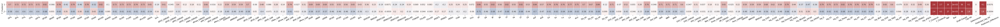

In [171]:
plt.figure(figsize=(100,20))

ax = sns.heatmap(mean_f_clusters2,
                cmap='vlag',
                 xticklabels=list(mean_f_clusters2.columns),
                 linewidths = 1,
                 annot = True,
                 vmin=-2,
                 vmax=+2,
                cbar = False)

plt.yticks(rotation=0)
plt.xticks(rotation=25)
ax.set_aspect("equal")

Unsurprisingly, this has split the data into above and below average forwards.  Cluster 1 includes the above average forwards, whereas cluster 2 are the below average forwards.

Next, we'll split the data into 4 clusters and see if we can get something more specific.

In [172]:
mean_f_clusters4 = forward_scaled_df.groupby('F_Clusters4').mean()

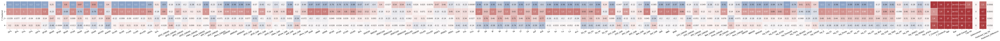

In [173]:
plt.figure(figsize=(100,20))

ax = sns.heatmap(mean_f_clusters4,
                cmap='vlag',
                 xticklabels=list(mean_f_clusters4.columns),
                 linewidths = 1,
                 annot = True,
                 vmin=-2,
                 vmax=2,
                cbar = False)

plt.yticks(rotation=0)
plt.xticks(rotation=25)
ax.set_aspect("equal")

To start, we have some similarities with how the defencemen were split into 4 groups.

Cluster #2 are our best forwards, especially offensively as the offensive statistics are higher values than the defensive metrics which are mostly around average.  Again, similar to the defencemen, the performance level in this cluster is higher than the 'good' cluster in the previous iteration, perhaps creating a better separation between the elite and the rest of the forwards.

Cluster #1 are the worst forwards offensively, and take more penalties and are by far the worst on the advanced analytics.  Here as well the performance level of this cluster is worse that the 'bad' cluster in the previous iteration.  It would seem that the middle range between the two clusters was used to split into additional clusters.

Cluster #4 has very limited ice-time but has very good defensive metrics.  The time on ice and the counting statistics are pretty low, meaning that they spend less time on the ice in a primarily defensive role.

Cluster #3 is has the second highest contribution on offense, including increased time on ice in general and on the power play specifically.  The counting stats are higher, but the overall advanced statistics are not very distinct from cluster 3, which would indicate more of a stylistic difference in play relative to the performance level.

Given what we saw visually in the plotting, I'm hopeful that looking at 6 clusters will highlight some more differences, stylistically or performance wise.

In [174]:
mean_f_clusters6 = forward_scaled_df.groupby('F_Clusters6').mean()

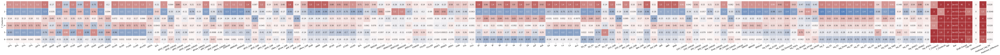

In [175]:
plt.figure(figsize=(100,20))

ax = sns.heatmap(mean_f_clusters6,
                cmap='vlag',
                 xticklabels=list(mean_f_clusters6.columns),
                 linewidths = 1,
                 annot = True,
                 vmin=-2,
                 vmax=2,
                cbar = False)

plt.yticks(rotation=0)
plt.xticks(rotation=25)
ax.set_aspect("equal")

There are some very interesting distinctions here, with some of the interesting spots on the data having some very specific classifications.

Cluster #1: Star Players.  This cluster stands out very significantly considering it is the ONLY cluster that is above average on the most 'important' advanced statistics (GAR, WAR).  This cluster has the most offensive production by far, but the defensive metrics are above average as well.

Cluster #3: Offensive Production, Defensive Liability.  This is the next best cluster in producing offense.  This cluster represents plays that have a high number of total statistics, with a significant amount of time on the ice and on the power play, but they are the worst on defensive advanced stats (Def_GAR/60, EVD_GAR/60).  The cap hit for this group confirms the findings from our regression model that offensive stats (especially Goals For and Expected Goals For) are most important when predicting the salary of a player.

Cluster #4: Primary Defensive Forwards.  This cluster fits the prototype of a 'checking line' player, particularly a center as this is the group that has the most faceoffs on average.  They also have the most time on ice while shorthanded, the most blocks, and above average number of hits for, all of which suggest primarily a defensive role.  Interestingly, the actual defensive stats are not particularly good (very close to average).  But it's likely that if these players are the best defensive forwards on a team, they are likely facing the best offensive players on the other team making it more challenging to accrue good defensive statistics.

Cluster #5: Secondary Defensive Forwards.  This group is actually the second best on the more general advanced statistics from a ratings standpoint (GAR/60, WAR/60).  But their time on the ice is limited.  Building off of the previous cluster, this group is likely the 'next best' defensive players, where they spend little time killing penalties.  That being said, belonging to this cluster, depending on the development of the player, could intimate that they are ready for increased defensive roles.

Cluster #6: Fringe NHL Forward.  This is the worst performing group across many stats, basic and advanced.  In general, these players have better (close to average) defensive stats but some of the worst offensive stats.

Cluster #2: Enforcer.  This is the cluster was the cluster that was on the 'tip' of the visualization for the data, and it is interesting to see why.  This cluster profiles as the classic NHL 'Enforcer', a high number of hits, a high number penalties taken and a high number of fights (iPENT5/iPEND5).  While the fringe forwards had bad offensive stats, the enforcers are even worse and this profile makes it clear that there job is purely physical without much concern for production.

While there is statistically a lot of cross-over between these clusters for both forwards and defencemen, separating the positions gave a lot more information that is useful in regards to team-building within a salary cap structure for the NHL.  Broadly, our final clusters (4 for defencemen, 6 for forwards) groups players into Stars, Offensive Contributors, Defensive Contributors and Fringe players.

Having these clusters, and then referencing their Cap Hits and Overall draft picks, can give actionable information about how a team could build for success on the ice.  In order to do this, we will recombine the data together so that the final, position-specific clusters are included.

In [202]:
final_df = pd.concat([forward_scaled_df, defence_scaled_df])

In [203]:
#This will rematch the index from the original dataset
final_df = final_df.sort_values('Player').reset_index()

In [204]:
final_df = final_df.drop(columns = ['index', 'F_Clusters2', 'F_Clusters4', 'D_Clusters2'])

In [205]:
final_df.head()

,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%,F_Clusters6,Player,Age,Year,Draft Overall,Cap Hit,Defenceman,Team,Predicted_Cap_Hit,Prediction_Difference,D_Clusters4
0,1.430065,1.740519,1.501569,1.537714,1.713639,0.549330,-1.435049,1.468201,-1.488543,1.015703,-1.557134,0.764931,-1.868224,0.472049,-1.960439,1.301293,1.733090,1.456682,1.447566,1.539082,-0.217676,0.880871,0.470873,0.295439,1.697386,-0.340228,0.288254,0.659200,1.033602,0.290862,0.628216,1.065901,1.092408,1.111669,0.816262,0.611700,3.286087,-0.093501,0.577351,1.119501,1.716635,0.505791,1.045719,1.760478,1.750553,1.821704,0.973486,0.931184,0.915018,1.061883,0.902525,-0.714508,-0.015780,-0.402133,0.494398,-0.465368,-0.476382,0.751843,-0.162498,-0.168205,0.090564,-0.529328,-0.539134,0.660003,-0.203756,-0.247277,0.103117,1.350254,0.195129,1.840685,0.694681,1.622803,0.675929,1.514087,0.529651,1.279561,0.212187,1.826128,2.427468,1.986586,1.958166,2.082476,1.387438,1.539408,1.891003,-0.982965,1.070131,1.714164,0.583962,-0.289504,0.577351,1.138656,1.422458,1.907662,1.922430,1.952143,0.554717,0.964550,0.147538,-0.725135,0.288242,0.659200,0.558436,0.896723,0.628216,1.063576,1.098813,1.110615,1.357169,0.091060,0.995803,0.948748,0.900863,-1.446844,-0.075648,0.052906,1.577847,0.796278,1.363198,1.314664,1.411298,1.403078,1.403380,1.529961,0.164519,0.487524,0.848931,0.779216,1.181612,0.686002,1.281499,-0.808743,NaN,aaron ekblad,18,2015,1.0,0.925,1,FLA,1.425904,0.500904,1.0
1,1.747311,1.643949,1.918621,1.806361,1.793755,3.677575,0.334947,2.507994,-0.516262,2.147836,-1.327300,1.957470,-1.353555,3.260276,0.234920,2.449600,1.811820,2.001349,1.865107,2.230812,2.432940,-0.839925,3.700160,0.806248,0.452145,0.127871,0.672613,-0.541327,3.288044,0.811654,0.288336,2.656758,2.535037,2.526175,3.463563,0.792320,0.806153,0.360179,0.772469,-0.638773,3.276908,0.856047,0.344463,2.923290,2.769032,2.746452,1.983585,1.586070,1.132597,2.043677,1.547202,1.848701,1.888995,-0.372434,-0.166100,-0.465368,-0.476382,0.295716,-0.162498,-0.168205,0.090564,-0.529328,-0.539134,0.143889,-0.203756,-0.247277,0.103117,2.197188,0.502057,1.155972,0.217086,1.022278,-0.045602,0.968680,-0.059823,1.632990,0.426103,2.714368,1.944590,2.139005,1.970732,2.384093,0.393557,-0.010053,1.478296,0.588319,1.975891,0.542133,1.280817,0.631880,0.772469,2.163132,0.728905,2.139556,2.017667,2.002242,1.890727,0.562014,0.504477,0.402713,0.672608,-0.541327,1.903650,0.687768,0.288336,1.776354,1.693439,1.682584,2.618678,1.063133,2.823114,2.452776,1.364075,-1.538017,-0.697765,-1.763970,1.771874,1.021936,1.780382,1.627888,1.289673,1.148563,0.978985,1.451657,-0.445548,1.329028,1.370780,-0.241301,-1.004907,0.215828,0.378122,-1.339543,NaN,aaron ekblad,25,2022,1.0,7.500,1,FLA,7.985278,0.485278,1.0
2,1.420524,1.503828,1.262186,1.267264,1.558213,1.920826,-0.373052,1.725550,-0.910730,1.228096,-0.990759,0.742588,-1.462544,2.144985,-0.307753,1.624603,1.561461,1.271000,1.216863,1.734571,1.153332,-0.214181,1.108646,-0.098772,3.525780,-0.474156,-0.700097,0.802120,2.633814,-0.267904,-0.148652,1.572082,1.499303,1.462857

In [206]:
final_df.loc[final_df['D_Clusters4'].isna()]

,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%,F_Clusters6,Player,Age,Year,Draft Overall,Cap Hit,Defenceman,Team,Predicted_Cap_Hit,Prediction_Difference,D_Clusters4
8,-0.328602,-0.091243,-0.258716,-0.304350,0.162739,0.017490,0.907268,0.423126,0.886333,-0.023368,0.621080,-0.187236,0.471215,-0.443458,-0.850732,-0.462035,-0.120006,-0.294352,-0.333577,0.061652,-0.177259,-0.474305,0.959353,-0.776013,-1.318235,-0.156520,-0.475532,3.315078,0.669865,-0.751254,2.163041,0.754711,0.751588,0.719339,-0.163095,-0.254095,-0.534637,0.028841,-0.452715,0.991276,-0.328772,-0.225856,0.435062,-0.287118,-0.328712,-0.310020,-0.483828,-0.689811,-0.535381,-1.507425,-0.865010,-0.675626,0.103829,0.255694,2.638739,-0.338352,-0.339449,2.135836,-0.788391,-0.770147,-0.281432,-0.462405,-0.466547,0.524625,-0.696917,-0.730759,-0.095601,-1.124309,-1.343845,-1.370715,-1.620347,-1.414369,-1.647637,-1.430945,-1.671862,-1.309940,-1.639235,-0.348308,-0.293254,-0.343259,-0.353084,-0.235797,-1.725427,-1.775189,-0.914223,-0.932100,0.053198,0.159249,-0.446500,0.019102,-0.452752,-0.099313,0.154207,0.052431,0.048447,0.038745,1.565362,0.369464,-0.183779,-0.843162,-0.475532,3.315053,1.395298,0.372152,2.163033,1.950354,1.944588,1.888980,-0.913221,0.211007,1.668732,0.305834,-0.522161,1.041662,0.625670,1.147064,-1.659691,-0.967870,-0.264962,-1.129131,-1.918799,-2.041605,-1.956057,-2.308443,-0.983770,-1.758600,-1.406177,-0.746441,-1.256238,-1.109050,-0.194289,-0.520094,6.0,aaron palushaj,23,2013,44.0,0.600,0,COL,0.863599,0.263599,NaN
11,-0.814239,-0.797956,-0.354011,-0.721681,-0.385587,-1.701461,-1.810690,-1.412802,-0.525326,-1.140071,-0.914580,-1.349017,-0.445688,-1.437997,-1.680107,-0.505057,-0.729891,-0.353867,-0.665487,-0.359855,-1.894781,1.945503,-1.402635,1.915344,-0.443798,-0.156520,-1.024397,-0.407346,-1.425653,1.907408,-1.064510,-0.524933,-0.525472,-0.528762,-0.948312,0.725156,-0.419719,0.028841,-0.678369,-0.171423,-0.927669,0.679599,-0.618372,-0.660209,-0.674423,-0.673970,-1.283058,-1.019126,-0.894409,-1.424315,-1.371507,-0.630658,-1.243181,0.803486,-0.419739,3.406777,3.451784,-1.147001,-0.806423,-0.829902,-0.128337,1.884598,1.917446,-0.553564,-0.701531,-0.745727,-0.053587,-1.409085,-1.762185,-1.575569,-1.772505,-1.543467,-1.809124,-1.563768,-1.782320,-1.452673,-1.743989,-0.358393,-0.466521,-0.359066,-0.445546,-0.354931,-1.746893,-1.745772,-1.094773,-0.930282,-1.028793,0.387552,-0.446500,0.019102,-0.678411,-1.014249,0.365627,-0.865768,-0.875143,-0.834729,-1.606523,0.999574,-0.156118,-0.672870,-1.024397,-0.407343,-1.636608,0.998358,-1.064510,-1.177629,-1.181915,-1.167549,-1.642465,-1.272717,-1.986890,-2.289581,-1.521477,0.466487,2.035449,2.794751,-2.198482,-1.862631,-2.376140,-2.710301,-2.432936,-2.276130,-2.205103,-2.302578,-1.401133,-1.758600,-2.320349,0.476932,-0.118201,-0.811549,-1.697221,-1.196205,2.0,aaron volpatti,27,2013,293.0,0.600,0,VAN/WSH,0.674063,0.074063,NaN
12,-1.210658,-1.716212,-1.643558,-1.569661,-1.344209,-1.986258,-2.094158,-1.989863,0.285385,-2.005689,0.196235,-1.800820,0.591005,-1.858225,-1.158785,-0.599704

In [207]:
#Filling the null values for the opposite position of the clusters so that it is set to 0
final_df.loc[(final_df['D_Clusters4'].isna()), 'D_Clusters4'] = 0

In [208]:
final_df.loc[(final_df['F_Clusters6'].isna()), 'F_Clusters6'] = 0

In [209]:
final_df

,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%,F_Clusters6,Player,Age,Year,Draft Overall,Cap Hit,Defenceman,Team,Predicted_Cap_Hit,Prediction_Difference,D_Clusters4
0,1.430065,1.740519,1.501569,1.537714,1.713639,0.549330,-1.435049,1.468201,-1.488543,1.015703,-1.557134,0.764931,-1.868224,0.472049,-1.960439,1.301293,1.733090,1.456682,1.447566,1.539082,-0.217676,0.880871,0.470873,0.295439,1.697386,-0.340228,0.288254,0.659200,1.033602,0.290862,0.628216,1.065901,1.092408,1.111669,0.816262,0.611700,3.286087,-0.093501,0.577351,1.119501,1.716635,0.505791,1.045719,1.760478,1.750553,1.821704,0.973486,0.931184,0.915018,1.061883,0.902525,-0.714508,-0.015780,-0.402133,0.494398,-0.465368,-0.476382,0.751843,-0.162498,-0.168205,0.090564,-0.529328,-0.539134,0.660003,-0.203756,-0.247277,0.103117,1.350254,0.195129,1.840685,0.694681,1.622803,0.675929,1.514087,0.529651,1.279561,0.212187,1.826128,2.427468,1.986586,1.958166,2.082476,1.387438,1.539408,1.891003,-0.982965,1.070131,1.714164,0.583962,-0.289504,0.577351,1.138656,1.422458,1.907662,1.922430,1.952143,0.554717,0.964550,0.147538,-0.725135,0.288242,0.659200,0.558436,0.896723,0.628216,1.063576,1.098813,1.110615,1.357169,0.091060,0.995803,0.948748,0.900863,-1.446844,-0.075648,0.052906,1.577847,0.796278,1.363198,1.314664,1.411298,1.403078,1.403380,1.529961,0.164519,0.487524,0.848931,0.779216,1.181612,0.686002,1.281499,-0.808743,0.0,aaron ekblad,18,2015,1.0,0.925,1,FLA,1.425904,0.500904,1.0
1,1.747311,1.643949,1.918621,1.806361,1.793755,3.677575,0.334947,2.507994,-0.516262,2.147836,-1.327300,1.957470,-1.353555,3.260276,0.234920,2.449600,1.811820,2.001349,1.865107,2.230812,2.432940,-0.839925,3.700160,0.806248,0.452145,0.127871,0.672613,-0.541327,3.288044,0.811654,0.288336,2.656758,2.535037,2.526175,3.463563,0.792320,0.806153,0.360179,0.772469,-0.638773,3.276908,0.856047,0.344463,2.923290,2.769032,2.746452,1.983585,1.586070,1.132597,2.043677,1.547202,1.848701,1.888995,-0.372434,-0.166100,-0.465368,-0.476382,0.295716,-0.162498,-0.168205,0.090564,-0.529328,-0.539134,0.143889,-0.203756,-0.247277,0.103117,2.197188,0.502057,1.155972,0.217086,1.022278,-0.045602,0.968680,-0.059823,1.632990,0.426103,2.714368,1.944590,2.139005,1.970732,2.384093,0.393557,-0.010053,1.478296,0.588319,1.975891,0.542133,1.280817,0.631880,0.772469,2.163132,0.728905,2.139556,2.017667,2.002242,1.890727,0.562014,0.504477,0.402713,0.672608,-0.541327,1.903650,0.687768,0.288336,1.776354,1.693439,1.682584,2.618678,1.063133,2.823114,2.452776,1.364075,-1.538017,-0.697765,-1.763970,1.771874,1.021936,1.780382,1.627888,1.289673,1.148563,0.978985,1.451657,-0.445548,1.329028,1.370780,-0.241301,-1.004907,0.215828,0.378122,-1.339543,0.0,aaron ekblad,25,2022,1.0,7.500,1,FLA,7.985278,0.485278,1.0
2,1.420524,1.503828,1.262186,1.267264,1.558213,1.920826,-0.373052,1.725550,-0.910730,1.228096,-0.990759,0.742588,-1.462544,2.144985,-0.307753,1.624603,1.561461,1.271000,1.216863,1.734571,1.153332,-0.214181,1.108646,-0.098772,3.525780,-0.474156,-0.700097,0.802120,2.633814,-0.267904,-0.148652,1.572082,1.499303,1.462857

For ease of understanding, we're going to re-order the clusters to be more similar to each other:

1: Star Forward/Defencemen

2: Offensive Forward/Defencemen

3: Defensive Forward/Defencemen

4: Secondary Defensive Forward

5: Fringe Forward/Defencemen

6: Enforcer

In [210]:
final_df.loc[(final_df['F_Clusters6'] == 3), 'F_Clusters6'] = 10
final_df.loc[(final_df['F_Clusters6'] == 4), 'F_Clusters6'] = 9
final_df.loc[(final_df['F_Clusters6'] == 5), 'F_Clusters6'] = 8
final_df.loc[(final_df['F_Clusters6'] == 6), 'F_Clusters6'] = 7
final_df.loc[(final_df['F_Clusters6'] == 2), 'F_Clusters6'] = 6

In [211]:
final_df.loc[(final_df['F_Clusters6'] == 10), 'F_Clusters6'] = 2
final_df.loc[(final_df['F_Clusters6'] == 9), 'F_Clusters6'] = 3
final_df.loc[(final_df['F_Clusters6'] == 8), 'F_Clusters6'] = 4
final_df.loc[(final_df['F_Clusters6'] == 7), 'F_Clusters6'] = 5

In [212]:
final_df.loc[(final_df['D_Clusters4'] == 4), 'D_Clusters4'] = 10
final_df.loc[(final_df['D_Clusters4'] == 2), 'D_Clusters4'] = 5

In [213]:
final_df.loc[(final_df['D_Clusters4'] == 10), 'D_Clusters4'] = 2

In [214]:
final_df.loc[(final_df['D_Clusters4'] == 1) | (final_df['F_Clusters6'] == 1)]

,GF%,SF%,FF%,CF%,xGF%,GF/60,GA/60,SF/60,SA/60,FF/60,FA/60,CF/60,CA/60,xGF/60,xGA/60,G±/60,S±/60,F±/60,C±/60,xG±/60,oiSh%,Sv%,xEVO_GAR/60,xEVD_GAR/60,xPPO_GAR/60,xSHD_GAR/60,xTake_GAR/60,xDraw_GAR/60,xOff_GAR/60,xDef_GAR/60,xPens_GAR/60,xGAR/60,xWAR/60,xSPAR/60,xEVO_GAR,xEVD_GAR,xPPO_GAR,xSHD_GAR,xTake_GAR,xDraw_GAR,xOff_GAR,xDef_GAR,xPens_GAR,xGAR,xWAR,xSPAR,iSF/60,iFF/60,iCF/60,ixG/60,Sh%,GIVE/60,TAKE/60,iPENT2/60,iPEND2/60,iPENT5/60,iPEND5/60,iPEN±/60,FOW/60,FOL/60,FO±/60,iPENT5,iPEND5,iPEN±,FOW,FOL,FO±,GF,GA,SF,SA,FF,FA,CF,CA,xGF,xGA,G±,S±,F±,C±,xG±,TOI_All,TOI_EV,TOI_PP,TOI_SH,EVO_GAR,EVD_GAR,PPO_GAR,SHD_GAR,Take_GAR,Off_GAR,Def_GAR,GAR,WAR,SPAR,EVO_GAR/60,EVD_GAR/60,PPO_GAR/60,SHD_GAR/60,Take_GAR/60,Draw_GAR/60,Off_GAR/60,Def_GAR/60,Pens_GAR/60,GAR/60,WAR/60,SPAR/60,log_G/60,log_A1/60,log_A2/60,log_Points/60,log_FSh%,log_iBLK/60,log_iHF/60,log_iHA/60,log_G,log_A1,log_A2,log_Points,log_iSF,log_iFF,log_iCF,log_ixG,log_iBLK,log_GIVE,log_TAKE,log_iHF,log_iHA,log_iPENT2,log_iPEND2,log_xFSh%,F_Clusters6,Player,Age,Year,Draft Overall,Cap Hit,Defenceman,Team,Predicted_Cap_Hit,Prediction_Difference,D_Clusters4
0,1.430065,1.740519,1.501569,1.537714,1.713639,0.549330,-1.435049,1.468201,-1.488543,1.015703,-1.557134,0.764931,-1.868224,0.472049,-1.960439,1.301293,1.733090,1.456682,1.447566,1.539082,-0.217676,0.880871,0.470873,0.295439,1.697386,-0.340228,0.288254,0.659200,1.033602,0.290862,0.628216,1.065901,1.092408,1.111669,0.816262,0.611700,3.286087,-0.093501,0.577351,1.119501,1.716635,0.505791,1.045719,1.760478,1.750553,1.821704,0.973486,0.931184,0.915018,1.061883,0.902525,-0.714508,-0.015780,-0.402133,0.494398,-0.465368,-0.476382,0.751843,-0.162498,-0.168205,0.090564,-0.529328,-0.539134,0.660003,-0.203756,-0.247277,0.103117,1.350254,0.195129,1.840685,0.694681,1.622803,0.675929,1.514087,0.529651,1.279561,0.212187,1.826128,2.427468,1.986586,1.958166,2.082476,1.387438,1.539408,1.891003,-0.982965,1.070131,1.714164,0.583962,-0.289504,0.577351,1.138656,1.422458,1.907662,1.922430,1.952143,0.554717,0.964550,0.147538,-0.725135,0.288242,0.659200,0.558436,0.896723,0.628216,1.063576,1.098813,1.110615,1.357169,0.091060,0.995803,0.948748,0.900863,-1.446844,-0.075648,0.052906,1.577847,0.796278,1.363198,1.314664,1.411298,1.403078,1.403380,1.529961,0.164519,0.487524,0.848931,0.779216,1.181612,0.686002,1.281499,-0.808743,0.0,aaron ekblad,18,2015,1.0,0.925,1,FLA,1.425904,0.500904,1.0
1,1.747311,1.643949,1.918621,1.806361,1.793755,3.677575,0.334947,2.507994,-0.516262,2.147836,-1.327300,1.957470,-1.353555,3.260276,0.234920,2.449600,1.811820,2.001349,1.865107,2.230812,2.432940,-0.839925,3.700160,0.806248,0.452145,0.127871,0.672613,-0.541327,3.288044,0.811654,0.288336,2.656758,2.535037,2.526175,3.463563,0.792320,0.806153,0.360179,0.772469,-0.638773,3.276908,0.856047,0.344463,2.923290,2.769032,2.746452,1.983585,1.586070,1.132597,2.043677,1.547202,1.848701,1.888995,-0.372434,-0.166100,-0.465368,-0.476382,0.295716,-0.162498,-0.168205,0.090564,-0.529328,-0.539134,0.143889,-0.203756,-0.247277,0.103117,2.197188,0.502057,1.155972,0.217086,1.022278,-0.045602,0.968680,-0.059823,1.632990,0.426103,2.714368,1.944590,2.139005,1.970732,2.384093,0.393557,-0.010053,1.478296,0.588319,1.975891,0.542133,1.280817,0.631880,0.772469,2.163132,0.728905,2.139556,2.017667,2.002242,1.890727,0.562014,0.504477,0.402713,0.672608,-0.541327,1.903650,0.687768,0.288336,1.776354,1.693439,1.682584,2.618678,1.063133,2.823114,2.452776,1.364075,-1.538017,-0.697765,-1.763970,1.771874,1.021936,1.780382,1.627888,1.289673,1.148563,0.978985,1.451657,-0.445548,1.329028,1.370780,-0.241301,-1.004907,0.215828,0.378122,-1.339543,0.0,aaron ekblad,25,2022,1.0,7.500,1,FLA,7.985278,0.485278,1.0
2,1.420524,1.503828,1.262186,1.267264,1.558213,1.920826,-0.373052,1.725550,-0.910730,1.228096,-0.990759,0.742588,-1.462544,2.144985,-0.307753,1.624603,1.561461,1.271000,1.216863,1.734571,1.153332,-0.214181,1.108646,-0.098772,3.525780,-0.474156,-0.700097,0.802120,2.633814,-0.267904,-0.148652,1.572082,1.499303,1.462857

In [215]:
#DATA to be exported for visualizations in Tableau
final_df.to_csv('data/VISUALIZATION_DATA.csv',index=False)

### Analysis of Clusters

<a id = 'interpret'></a>

Through this clustering, we have seen some clusters that could potentially show some differentiation between players and the different roles NHL players may have on a team.  That being said, the Silhouette scores for these clusters are fairly weak and there is likely to be some overlap of these clusters, especially when grouping all players together.  Perhaps the nature of the sport does not lend itself to easily differntiating players based on their performance statistics.

However, when the players were separated by position, even though the silhouette scores were similarly weak, the information gained about those clusters was more specific and could potentially add insight into a team's building strategy and perhaps provide additional evaluation to whether specific players are overvalued or undervalued.

To do this, I would like to do something similar to an EDA on these Clusters.

In [269]:
#Note unlike EDA, I want to make a little summary Dataframe of our clusters
forward_means = final_df.groupby('F_Clusters6').mean()
forward_stdevs = final_df.groupby('F_Clusters6').std()
forward_max = final_df.groupby('F_Clusters6').max()
forward_min = final_df.groupby('F_Clusters6').min()

In [273]:
#Combining the above info into a dataframe
forward_caphit_df = pd.DataFrame({'Actual Means': forward_means['Cap Hit'].values,
                                   'Actual STDev': forward_stdevs['Cap Hit'].values,
                                   'Actual Max': forward_max['Cap Hit'].values,
                                   'Actual Min': forward_min['Cap Hit'].values,
                                  'Predicted Means': forward_means['Predicted_Cap_Hit'].values,
                                  'Predicted STDev': forward_stdevs['Predicted_Cap_Hit'].values,
                                  'Predicted Max': forward_max['Predicted_Cap_Hit'].values,
                                  'Predicted Min': forward_min['Predicted_Cap_Hit'].values,
                                  'Predict/Actual Diff': forward_means['Prediction_Difference'].values
                                  }, index = forward_means.index)

In [274]:
#Deselect the 0 row, which is defencemen and not forwards
forward_caphit_df = forward_caphit_df.loc[1:6]

In [275]:
forward_caphit_df

,Actual Means,Actual STDev,Actual Max,Actual Min,Predicted Means,Predicted STDev,Predicted Max,Predicted Min,Predict/Actual Diff
F_Clusters6,,,,,,,,,
1.0,4.967255,2.740835,12.500,0.573,4.994891,2.077101,9.307359,-0.325481,0.027636
2.0,3.925340,2.357088,11.643,0.550,3.979558,1.887660,9.493566,-0.329736,0.054218
3.0,3.135917,2.199087,10.278,0.550,3.108181,1.838135,8.260425,-0.165596,-0.027735
4.0,1.930514,1.399652,10.500,0.550,1.931873,1.050917,6.311822,-0.001384,0.001359
5.0,1.662131,1.502000,9.000,0.525,1.611278,1.179362,5.856389,-0.092749,-0.050853
6.0,1.299063,1.040387,6.000,0.525,1.294234,0.698875,4.013604,-0.036458,-0.004830


It's not surprising that our best offensive forwards (Cluster #1) are the highest paid at nearly $5million on average, but the range of values us quite large and almost encompasses the entire range of ALL Cap Hits.  With this range of data, I am interested to see what the distribution of Cap Hits are for each cluster.  While each cluster has a wide range, perhaps the distribution of values can tell us more about where the true value lies within each cluster.

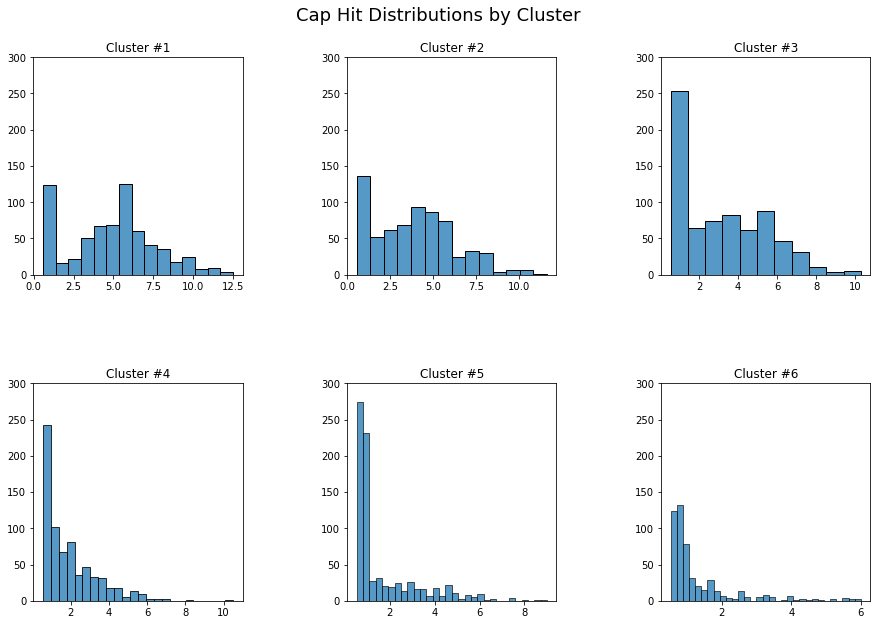

In [347]:
plt.figure(figsize=(15, 10))
plt.subplots_adjust(hspace=0.5,wspace=0.5)
plt.suptitle("Cap Hit Distributions by Cluster", fontsize=18, y=0.95)

for n in range(1, 7): #Not including 0 because those are defencemen, not forwards
    ax = plt.subplot(2, 3, n)

    sns.histplot(x = final_df['Cap Hit'].loc[(final_df['F_Clusters6'] == n)])

    ax.set_title(f'Cluster #{n}')
    ax.set_xlabel('')
    ax.set_ylabel('')
    plt.ylim(0, 300)

Some interesting patterns emerge here:

1. There is a significant number of players who are earning at or near the minimum in every cluster **including** Cluster #1.  While the proportion of 'minimum' salaries increases as you go from cluster to cluster, there does seem to be a lot of value that can be found without a lot of investment, whether it is drafting rookies that can contribute quickly or veterans passed their prime that can still contribute.


2. At the other end of the spectrum, for the 'Fringe' NHLers (clusters 5 and 6), if the level of expectation is a similar level of performance or role, then it is not worth spending more than $1 million on that level ov player as there is an abbundance of them at that level.


3. The $5.5-6 million mark seems to be a specific delineation within Cluster 1.  If a team expects to acquire a player of this level, it is likely that they would have to pay at least this amount.


4.  There are some significantly overpaid players based on which cluster they were identified for.  Looking at Cluster #5, which are 'fringe' NHLers, there are multiple players at or over 8 million!  Considering the mean Cap Hit for that cluster is 1.6 million, this is a massive overpay relative to the performance of that player.


With this, I would like to go through each cluster and identify players who are significantly over and under the value of their cluster.  First, I'll go through the 'worse' clusters (4, 5, 6) to see who is overpaid there.


In [305]:
final_df[['Player', 'Age', 'Year', 'Cap Hit']].loc[(final_df['F_Clusters6'] == 4)].sort_values('Cap Hit', ascending = False).head(10)

,Player,Age,Year,Cap Hit
2922,jonathan toews,33,2022,10.500
5121,ryan getzlaf,35,2021,8.250
5148,ryan kesler,33,2018,6.875
5147,ryan kesler,34,2019,6.875
4777,paul stastny,26,2013,6.600
1680,derek stepan,29,2020,6.500
3468,loui eriksson,33,2019,6.000
5724,tomas plekanec,33,2017,6.000
5725,tomas plekanec,34,2018,6.000
686,brandon dubinsky,31,2018,5.850


In [306]:
final_df[['Player', 'Age', 'Year', 'Cap Hit']].loc[(final_df['F_Clusters6'] == 5)].sort_values('Cap Hit', ascending = False).head(10)

,Player,Age,Year,Cap Hit
2629,jeff skinner,28,2021,9.000
1395,corey perry,33,2019,8.625
3830,matt duchene,29,2021,8.000
6164,zach parise,36,2021,7.538
6163,zach parise,37,2022,7.538
1514,dany heatley,31,2013,7.500
5306,scott gomez,32,2013,7.357
781,brendan gallagher,29,2022,6.500
1475,daniel briere,34,2013,6.500
214,alex radulov,35,2022,6.250


In [307]:
final_df[['Player', 'Age', 'Year', 'Cap Hit']].loc[(final_df['F_Clusters6'] == 6)].sort_values('Cap Hit', ascending = False).head(10)

,Player,Age,Year,Cap Hit
3355,kyle okposo,32,2021,6.00
3470,loui eriksson,36,2022,6.00
4167,mike richards,29,2015,5.75
4168,mike richards,30,2016,5.75
355,andrew ladd,32,2019,5.50
354,andrew ladd,35,2022,5.50
2893,jonathan drouin,26,2022,5.50
1536,dave bolland,29,2016,5.50
1547,david clarkson,29,2014,5.25
1548,david clarkson,30,2015,5.25


Going through each of these 3 lists a pattern emerges.  Many of these players are veterans who are likely passed their prime playing days that had signed big contracts earlier in their careers.  This really highlights the risk/reward of signing good players to large, long-term contracts.

Players like Jonathan Toews, Corey Perry, Ryan Getzlaf, Mike Richards and others were near an all-star level and were likely Cluster 1 players at some point in their career.  In order to retain these players, teams likely signed long-term deals that kept them on their team.  The teams paid for production in the first years of the contract, but the last couple of years the player no longer has the ability to produce at the same level.

This would suggest that teams shouldn't pay for these players for this long of duration for the amount they are being paid for as the team will lose the opportunity to acquire better players at the end of these contracts.  That being said, each of the four players listed above were cornerstone players for Stanley Cup winning teams.  Perhaps it is worth these upfront investments in production, knowing that the team will suffer for it later, if it means it helps them win a championship.

Next I would like to identify players who are underpaid according to these clusters, specifically in clusters 1, 2 and 3.  I am going to make one caveat on this however.  Through the other models, we have already identified rookies and veterans earning the minimum as players who outperform their predictions.  The salaries for these players is typically less than a million.  To identify other players with this performance level, I'll limit the search to those making over 1 million.

In [311]:
final_df[['Player', 'Age', 'Year', 'Cap Hit']].loc[(final_df['F_Clusters6'] == 1) & (final_df['Cap Hit'] > 1)].sort_values('Cap Hit').head(10)

,Player,Age,Year,Cap Hit
3768,mathieu perreault,25,2014,1.050
4163,mike ribeiro,34,2015,1.050
3776,mats zuccarello,26,2014,1.150
5544,tanner pearson,24,2017,1.400
5850,troy terry,24,2022,1.450
3367,kyle palmieri,24,2016,1.467
2501,jarome iginla,36,2014,1.800
3115,justin abdelkader,27,2015,1.800
3026,josh anderson,24,2019,1.850
6065,vladislav namestnikov,24,2018,1.938


In [312]:
final_df[['Player', 'Age', 'Year', 'Cap Hit']].loc[(final_df['F_Clusters6'] == 2) & (final_df['Cap Hit'] > 1)].sort_values('Cap Hit').head(10)

,Player,Age,Year,Cap Hit
843,brett connolly,23,2016,1.025
709,brandon pirri,25,2017,1.100
1005,cam atkinson,25,2015,1.150
4745,paul byron,28,2018,1.167
1690,derick brassard,31,2020,1.200
2353,jake virtanen,22,2019,1.250
2483,jared mccann,22,2019,1.250
2705,joe colborne,25,2016,1.275
285,andreas athanasiou,23,2018,1.388
3380,kyle turris,23,2013,1.400


In [313]:
final_df[['Player', 'Age', 'Year', 'Cap Hit']].loc[(final_df['F_Clusters6'] == 3) & (final_df['Cap Hit'] > 1)].sort_values('Cap Hit').head(10)

,Player,Age,Year,Cap Hit
1045,carl soderberg,28,2015,1.008
1046,carl soderberg,27,2014,1.008
1435,dale weise,27,2016,1.025
1086,chandler stephenson,25,2020,1.050
1512,danton heinen,26,2022,1.100
4045,michael raffl,25,2015,1.100
4202,mikkel boedker,22,2013,1.100
4053,michael raffl,26,2016,1.100
57,adam lowry,24,2018,1.125
5067,ross colton,25,2022,1.125


A common theme that we see across these groups is that many of these players are still somewhat young (less than 27 for the most part.  However, in general, this does not include players who continued to improve to make an all-star level.  This may show that acquiring the level of performance outlined in these clusters may be more affordable that expected.  This may also highlight a weakness in these clusters, particularly cluster 1, where the range of ability within that cluster is maybe wider than the actual on-ice impact.

In the end, a team should decide whether to invest a lot of money into a single high end talent, or to spread the share of the cap to have more players at a comparable, but lower, level of performance.  This last 'underpaid' list would hint that finding a 'Cluster 1' level of talent may be an afforadable way to acquire more talent for a team.

With that, I would like to do the same exercise with Defencemen.

In [314]:
#Same set-up as with the forwards
defence_means = final_df.groupby('D_Clusters4').mean()
defence_stdevs = final_df.groupby('D_Clusters4').std()
defence_max = final_df.groupby('D_Clusters4').max()
defence_min = final_df.groupby('D_Clusters4').min()

In [332]:
#Combining the above info into a dataframe
defence_caphit_df = pd.DataFrame({'Actual Means': defence_means['Cap Hit'].values,
                                   'Actual STDev': defence_stdevs['Cap Hit'].values,
                                   'Actual Max': defence_max['Cap Hit'].values,
                                   'Actual Min': defence_min['Cap Hit'].values,
                                  'Predicted Means': defence_means['Predicted_Cap_Hit'].values,
                                  'Predicted STDev': defence_stdevs['Predicted_Cap_Hit'].values,
                                  'Predicted Max': defence_max['Predicted_Cap_Hit'].values,
                                  'Predicted Min': defence_min['Predicted_Cap_Hit'].values,
                                  'Predict/Actual Diff': defence_means['Prediction_Difference'].values
                                  }, index = defence_means.index)

In [333]:
#Deselect the 0 row, which are forwards, not defencemen
defence_caphit_df = defence_caphit_df.loc[1:5]

In [334]:
defence_caphit_df

,Actual Means,Actual STDev,Actual Max,Actual Min,Predicted Means,Predicted STDev,Predicted Max,Predicted Min,Predict/Actual Diff
D_Clusters4,,,,,,,,,
1.0,4.391822,2.371281,11.5,0.578,4.365803,1.769876,8.719581,-0.365277,-0.026019
2.0,2.046275,1.700380,9.0,0.525,2.085602,1.349469,7.286700,0.001443,0.039327
3.0,3.400195,1.932427,11.5,0.550,3.337754,1.411478,8.662197,0.107133,-0.062441
5.0,1.890081,1.481103,7.0,0.525,1.923996,0.992090,6.428409,0.044746,0.033915


Similar to the Forwards, it's no surprise that Cluster 1 is the highest paid, though the average is lower than it is for the forwards.

Cluster #2 are the defencemen who were offensively inclined but not to the same level as cluster #1, so it's interesting that Cluster #3 (defensive defencemen, low offense) is actually the second highest paid cluster.  It appears that these players are more recognized their for their defensive contributions, particularly compared to the forwards. We'll see how the cap hit is distributed amongst these clusters.

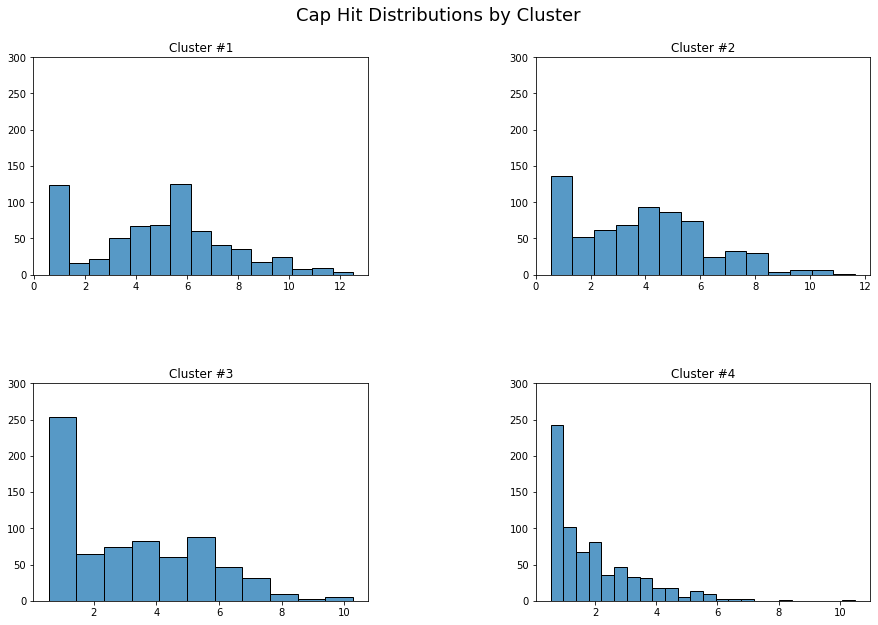

In [349]:
plt.figure(figsize=(15, 10))
plt.subplots_adjust(hspace=0.5,wspace=0.5)
plt.suptitle("Cap Hit Distributions by Cluster", fontsize=18, y=0.95)

for n in [1,2,3,4]: #Not including 0 because those are forwards, not defencemen
    ax = plt.subplot(2, 2, n)

    sns.histplot(x = final_df['Cap Hit'].loc[(final_df['F_Clusters6'] == n)])

    ax.set_title(f'Cluster #{n}')
    ax.set_xlabel('')
    ax.set_ylabel('')
    plt.ylim(0, 300)

There are a few things that I notice here similar to the forwards.

1. It looks like there is some significant value to be had from players on rookie and veteran minimum contracts in the higher performing clusters.

2. It is interesting that Cluster #3 was the second highest mean Cap Hit, but ALSO the highest number of players being paid at the 1 million mark or less.  If a player is being paid solely for their defensive prowess, a team may have to be careful about the amount committed to the player considering the number that are available for cheap.

3. It looks like the artifical 5.5-6 million salary marker applies to defencemen as well as forward, given the frequency at that specific level of Cap Hit.

4. There isn't the same proportion of 'minimum' salary players for the 'fringe' defencemen as there were for the forwards.  Given the limited number of spots for defencemen versus forwards (6 defencemen vs 12 forwards in a normal NHL line-up), there seems to be a higher proportion of even low-level defencemen that have a salary over 1 million in general.

Now, I would like to look more closely at the 'Fringe' defencemen and see what patterns may be seen.

In [350]:
final_df[['Player', 'Age', 'Year', 'Cap Hit']].loc[(final_df['D_Clusters4'] == 5)].sort_values('Cap Hit', ascending = False).head(10)

,Player,Age,Year,Cap Hit
3556,marcedouard vlasic,34,2022,7.000
1724,dion phaneuf,33,2019,7.000
3557,marcedouard vlasic,33,2021,7.000
829,brent seabrook,34,2020,6.875
2849,johnny boychuk,35,2020,6.000
3550,marc staal,33,2021,5.700
3549,marc staal,32,2020,5.700
3811,matt carle,30,2016,5.500
1321,colton parayko,27,2021,5.500
455,anton stralman,35,2022,5.500


Similar to the forwards, there is a common theme of older players with high salaries here, most of which are at the end of long-term contracts.  There is mixed team success within this list (Seabrook and Boychuk were members of Stanley Cup winning teams) but also the actual cap hit of these 'fringe' defencemen are a bit lower than the 'fringe' forwards.

This could mean that, in general, signing a defencemen to a bigger contract is lower risk than forwards, but the same risk/reward calculation needs to be made whether a team wants to pay a player for longer knowing they'll get good performance at the start of the contract but poor performance at the end of it.

Now we will see who from the other 3 clusters are the most underpaid, using the same 1 million limit for our defencemen.

In [351]:
final_df[['Player', 'Age', 'Year', 'Cap Hit']].loc[(final_df['D_Clusters4'] == 1) & (final_df['Cap Hit'] > 1)].sort_values('Cap Hit').head(10)

,Player,Age,Year,Cap Hit
3574,marco scandella,24,2015,1.025
3950,mattias ekholm,24,2015,1.038
3942,mattias ekholm,25,2016,1.038
88,alec martinez,27,2015,1.100
87,alec martinez,26,2014,1.100
1969,erik gustafsson d,26,2019,1.200
1967,erik gustafsson d,27,2020,1.200
1260,cody franson,25,2013,1.200
3129,justin braun,26,2014,1.250
5290,sami vatanen,23,2015,1.262


In [352]:
final_df[['Player', 'Age', 'Year', 'Cap Hit']].loc[(final_df['D_Clusters4'] == 2) & (final_df['Cap Hit'] > 1)].sort_values('Cap Hit').head(10)

,Player,Age,Year,Cap Hit
4818,philip larsen,23,2014,1.025
5012,robert bortuzzo,26,2016,1.050
5013,robert bortuzzo,27,2017,1.050
200,alex petrovic,24,2017,1.050
201,alex petrovic,23,2016,1.050
1694,derrick pouliot,24,2019,1.100
3640,mark borowiecki,28,2018,1.100
3673,mark pysyk,23,2016,1.125
2886,jonas siegenthaler,24,2022,1.125
2870,jon merrill,25,2018,1.138


In [353]:
final_df[['Player', 'Age', 'Year', 'Cap Hit']].loc[(final_df['D_Clusters4'] == 3) & (final_df['Cap Hit'] > 1)].sort_values('Cap Hit').head(10)

,Player,Age,Year,Cap Hit
3575,marco scandella,23,2014,1.025
2744,joel edmundson,24,2018,1.050
554,ben lovejoy,29,2014,1.100
4176,mike weaver,35,2014,1.100
549,ben lovejoy,31,2016,1.100
548,ben lovejoy,30,2015,1.100
3001,jordie benn,30,2018,1.100
3002,jordie benn,29,2017,1.100
3000,jordie benn,31,2019,1.100
3678,mark pysyk,24,2017,1.125


For Cluster number 1 and 2 (the stars and offensively inclined defencemen) we have a similar pattern of players that are still young but before their peak (less than 27 years old).

In this Cluster 1 list, we do have some players that have gone on to become some of the best in the NHL.  At the date of this project, Mattias Ekholm just signed a contract that will pay him 6.25 million per year.  Alec Martinez followed a similar trajectory and is currently paid 5.25 million per year.  This could hint to the fact that defencemen are a later developing position compared to forwards or, conversely, someone who will become a good forward will show they are earlier in their career.

### Next Steps

1. The next notebook is titled **Brian Johns Capstone #4 - Findings**.  No data is required to be uploaded to the final notebook.

1. The csv file output here will be placed in a data folder.  The 'VISUALIZATION_DATA.csv' file that has been provided was used to develop the visualization in Tableau for the Capstone Report.